In [2]:
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
import pymongo
import warnings
warnings.filterwarnings("ignore")
username = "tagger-admin"
password = "tvaiadmin"
db_client = pymongo.MongoClient('104.198.62.226', username=username,
                                password=password,
                                authSource='tags',
                                authMechanism='SCRAM-SHA-256', port=27017).tags

import aerospike
config = {
    'hosts': [('35.228.136.58', 3000)]
}

client = aerospike.client(config).connect()
data_as_key = ("ids_to_validate", "data", "data")

bert_data_key = ("ids_to_validate", "data", "bert_tags")

tags_dictionary = client.get(data_as_key)[-1]['tags']
guten_tag_labels = client.get(bert_data_key)[-1]["gutenTag"]
print("tags_dictionary:", len(tags_dictionary))
print("guten_tag_labels:",len(guten_tag_labels))

tags_dictionary: 5620
guten_tag_labels: 254


In [24]:
from IPython.display import Image 
from IPython.core.display import Image, display

In [5]:
def tags_simmilarity(model, person): 
    if len(model.union(person)) > 0:
        return len(model.intersection(person))/len(model.union(person))
    if len(model.union(person)) == 0 and len(model) == 0:
        return 1

In [3]:
for i in db_client["tweets_pipeline_v2"].find({"$or": [{"status":"graphicone_search"}, 
                                                      ],
                                               }):
    print(i)
    break

{'_id': ObjectId('5dc4c2435dcf6274b6a447eb'), 'tweet_text': '5 steps for securing #IoT deployments https://t.co/DhjOAAU3hz via @iotagenda https://t.co/nbLUhrtBa2', 'hashtags': ['IoT'], 'tweet_timestamp': datetime.datetime(2019, 11, 2, 9, 3), 'username': 'tamaramccleary', 'user_id': 2307675307, 'user_counters': {'followers_count': 306374, 'friends_count': 215979, 'listed_count': 8590}, 'tweet_counters': {'retweet_count': 4, 'favorite_count': 11}, 'img_urls': 'http://pbs.twimg.com/media/EIUlfSvW4AAFdyV.png', 'tweet_id': 1190554891619454977, 'downloaded': True, 'download_error': False, 'img_type': 'graphic', 'graph_type': 'pie-donut', 'confirmed_after_validate': ['cyber security'], 'status': 'graphicone_search', 'validated_timestamp': datetime.datetime(2019, 11, 8, 16, 30, 10, 475000), 'validator_username': 'tagger5', 'grafeed_approver': 'share10', 'grafeed_confirmed': ['cyber security'], 'grafeed_industries': ['Banks insurance and finance', 'Technology as you know it'], 'grafeed_shifts':

5dfb6c0d521d05797e7f5821
0.5
2020-03-09 14:21:38.348000
DIFFER: {'financials', 'fixed income', 'credit'}
MODEL: {'energy', 'bonds', 'high yield'}
TAGGER: {'high yield', 'bonds', 'fixed income', 'financials', 'energy', 'credit'}


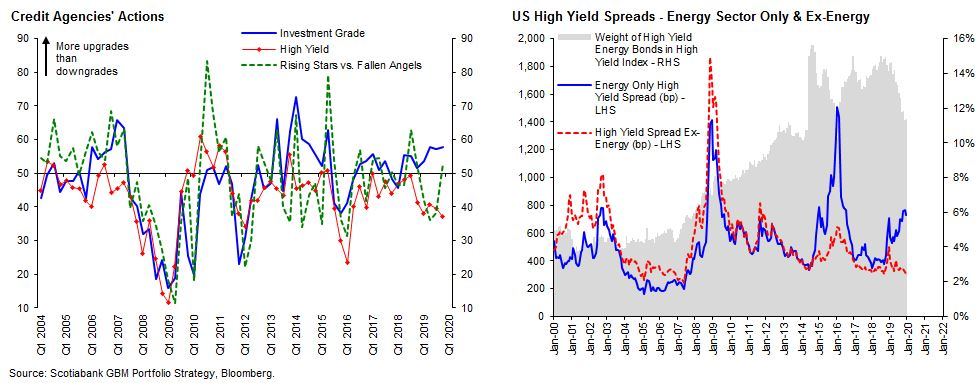



5e0255b09ac2235ce37d96d4
0.75
2020-03-09 14:17:51.183000
DIFFER: {'gdp'}
MODEL: {'macro', 'retirement', 'government'}
TAGGER: {'macro', 'gdp', 'retirement', 'government'}


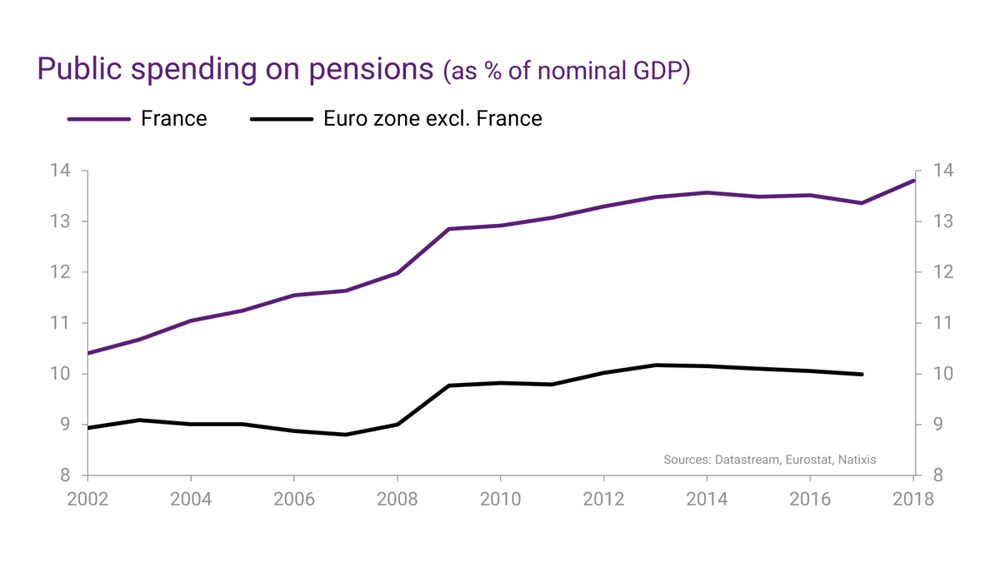



5dfbc77631f3fbd32886abd2
0.5
2020-03-09 14:10:43.767000
DIFFER: {'legal', 'taxes'}
MODEL: {'dividends', 'cash'}
TAGGER: {'taxes', 'dividends', 'legal', 'cash'}


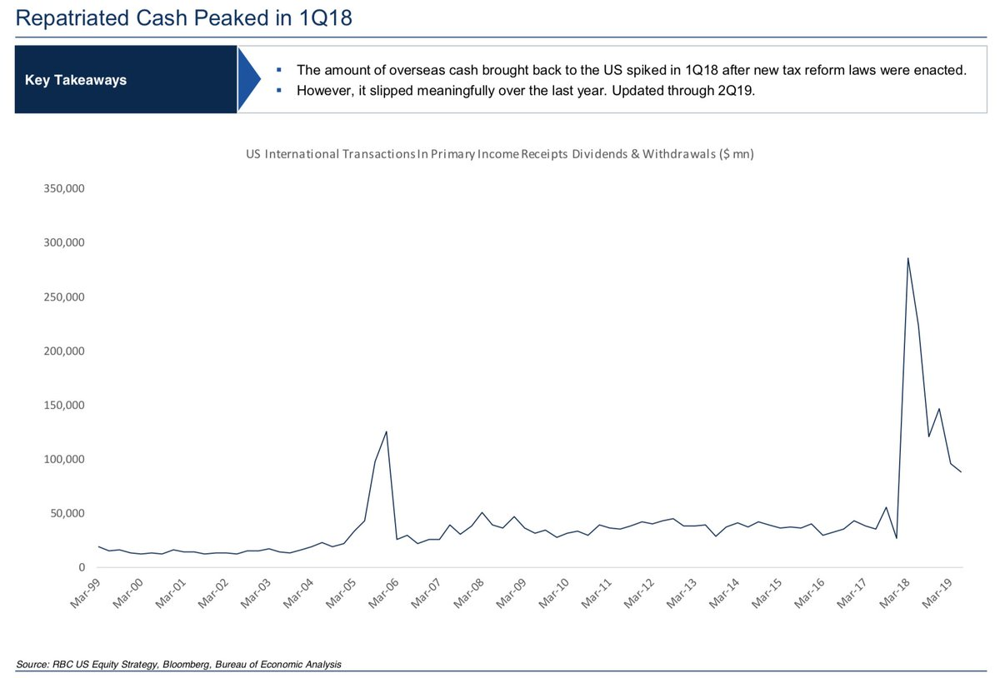



5dfbec7f73157c57b827c921
0.4444444444444444
2020-03-08 16:09:54.354000
DIFFER: {'global', 'government bonds', 'mortgage', 'high yield'}
MODEL: {'developed markets', 'bonds', 'fixed income', 'funds', 'emerging markets'}
TAGGER: {'government bonds', 'high yield', 'bonds', 'fixed income', 'funds', 'global', 'mortgage', 'emerging markets'}


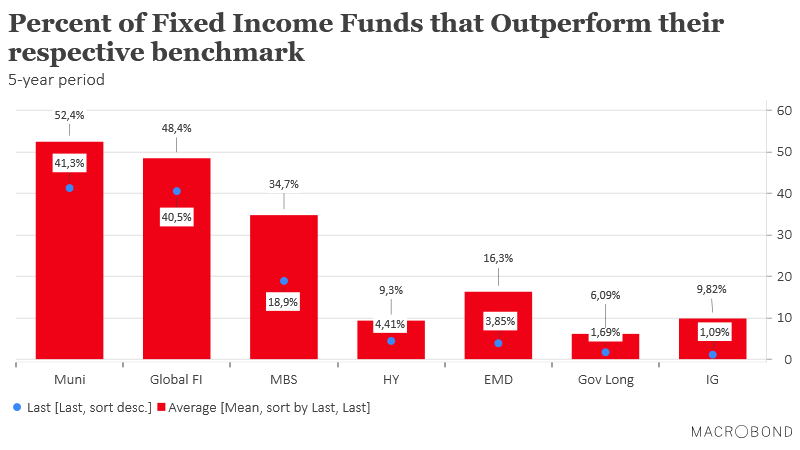



5e04bf42feee0fbc388adfa8
0.6666666666666666
2020-03-08 15:51:36.118000
DIFFER: {'personal finance'}
MODEL: {'savings', 'consumer'}
TAGGER: {'savings', 'consumer', 'personal finance'}


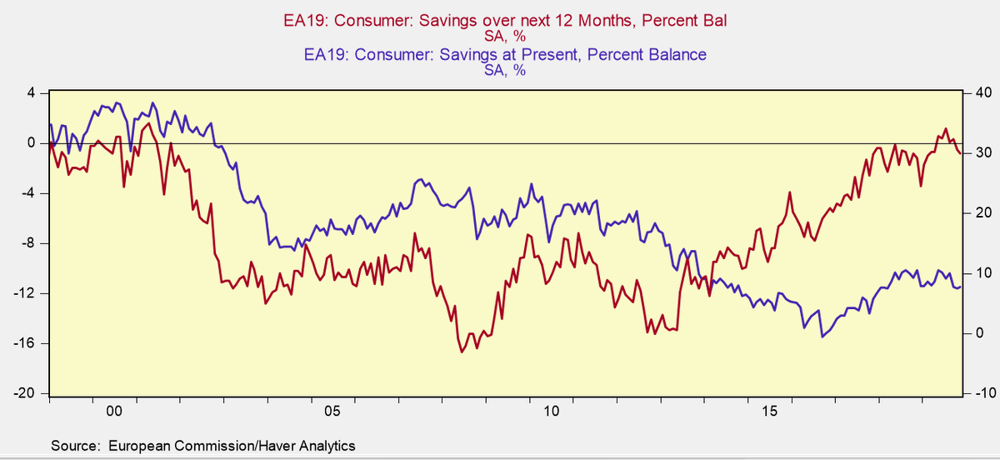



5e053f7ffeee0fbc388ae88f
0.5
2020-03-08 15:50:59.494000
DIFFER: {'commodities'}
MODEL: {'volatility'}
TAGGER: {'commodities', 'volatility'}


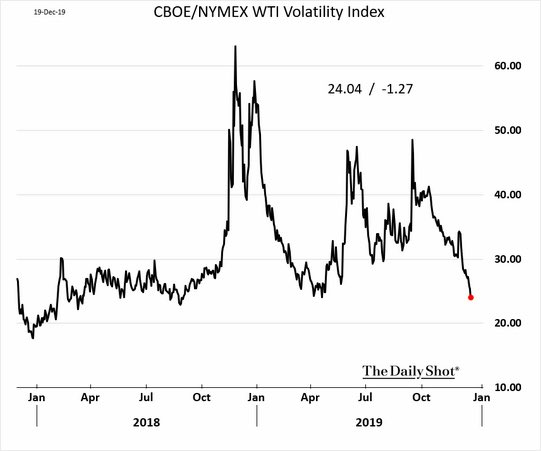



5e04ac365ebad2315fab451b
0.6
2020-03-08 15:45:55.862000
DIFFER: {'energy'}
MODEL: {'sentiment', 'bear market', 'commodities', 'bull market'}
TAGGER: {'sentiment', 'energy', 'bear market', 'commodities'}


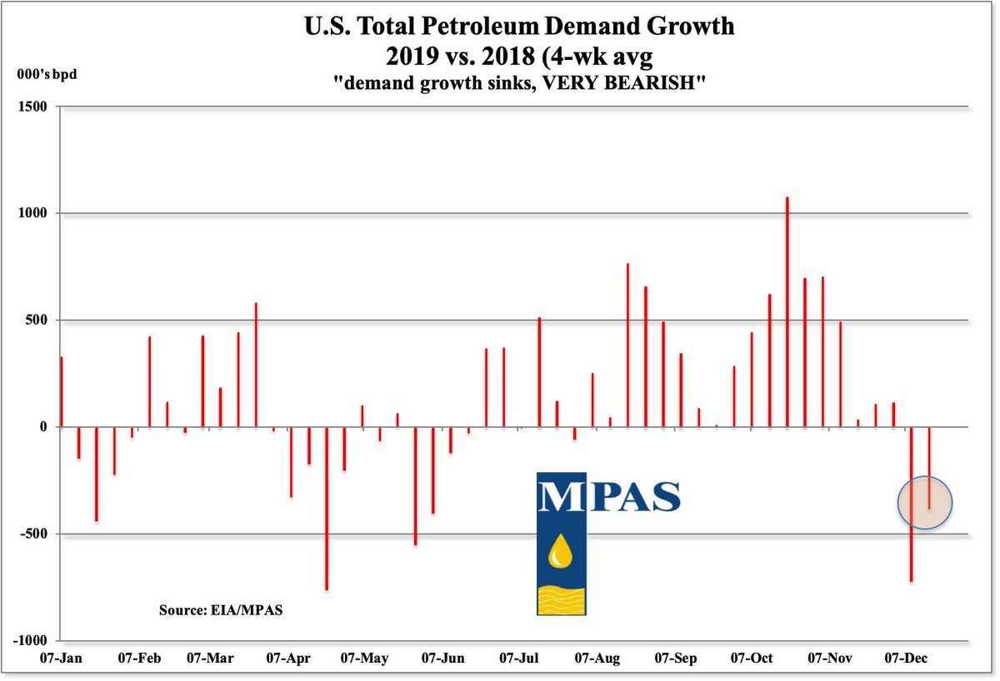



5e04c10e8213f9846f8aaed2
0.6666666666666666
2020-03-08 15:44:57.624000
DIFFER: {'innovation', 'telecom'}
MODEL: {'global', 'information technology', 'intellectual property', 'technology'}
TAGGER: {'technology', 'innovation', 'information technology', 'intellectual property', 'global', 'telecom'}


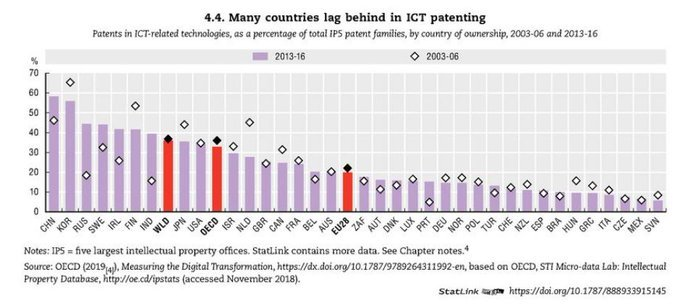



5e0551bdb78dec48356f7660
0.5
2020-03-08 15:39:41.050000
DIFFER: {'social justice', 'religion'}
MODEL: {'crimes', 'social'}
TAGGER: {'crimes', 'social justice', 'social', 'religion'}


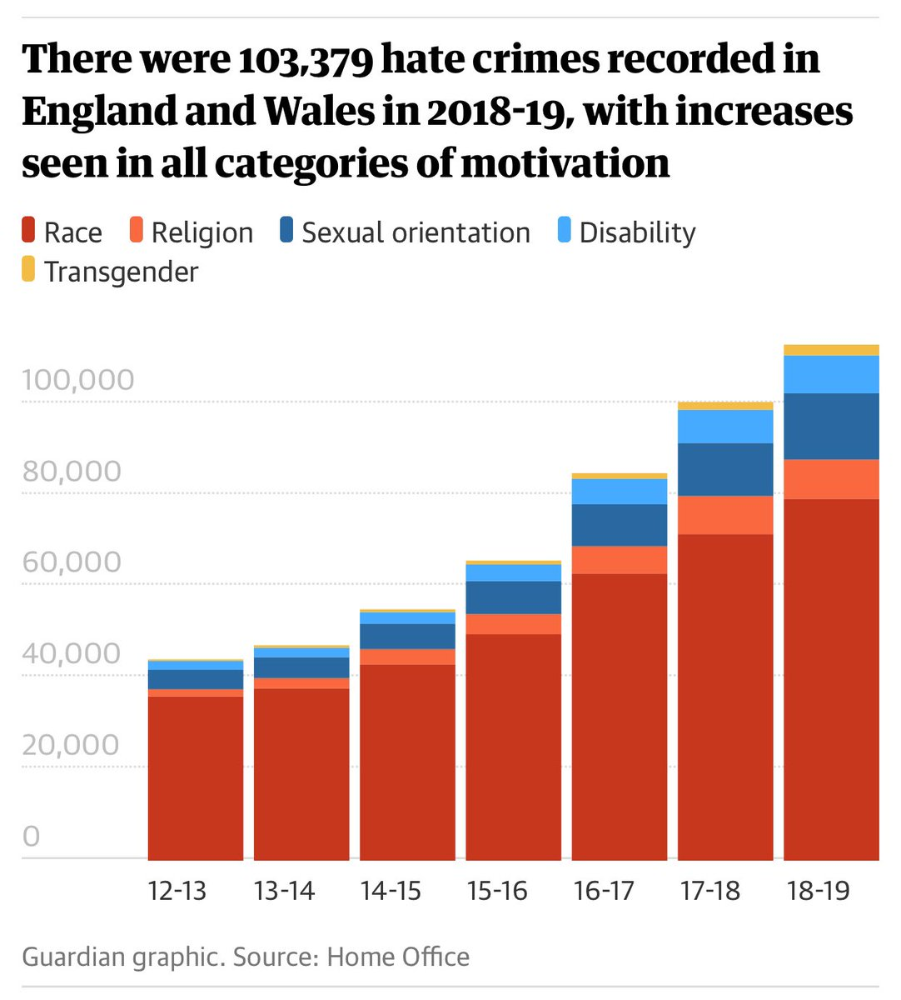



5e057662af4c97c37c3b797c
0.8
2020-03-08 15:37:36.189000
DIFFER: {'social'}
MODEL: {'gender', 'demography', 'life expectancy', 'woman'}
TAGGER: {'demography', 'life expectancy', 'woman', 'gender', 'social'}


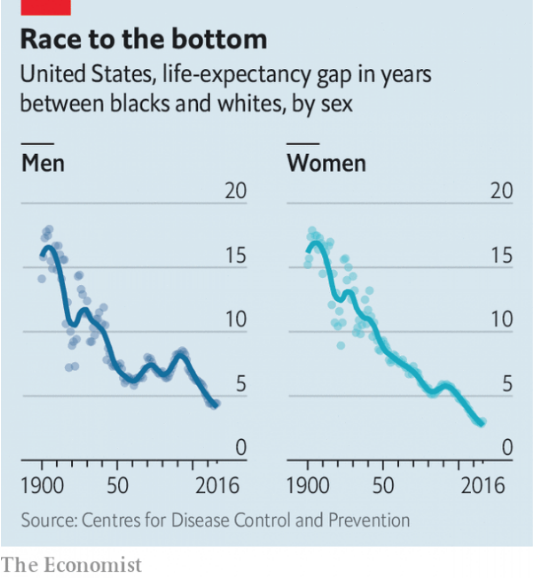



5e027020606f1ebb7cc50c0a
0.3333333333333333
2020-03-08 15:36:53.456000
DIFFER: {'technology', 'social', 'banking', 'government'}
MODEL: {'bubble', 'large caps'}
TAGGER: {'technology', 'bubble', 'banking', 'government', 'large caps', 'social'}


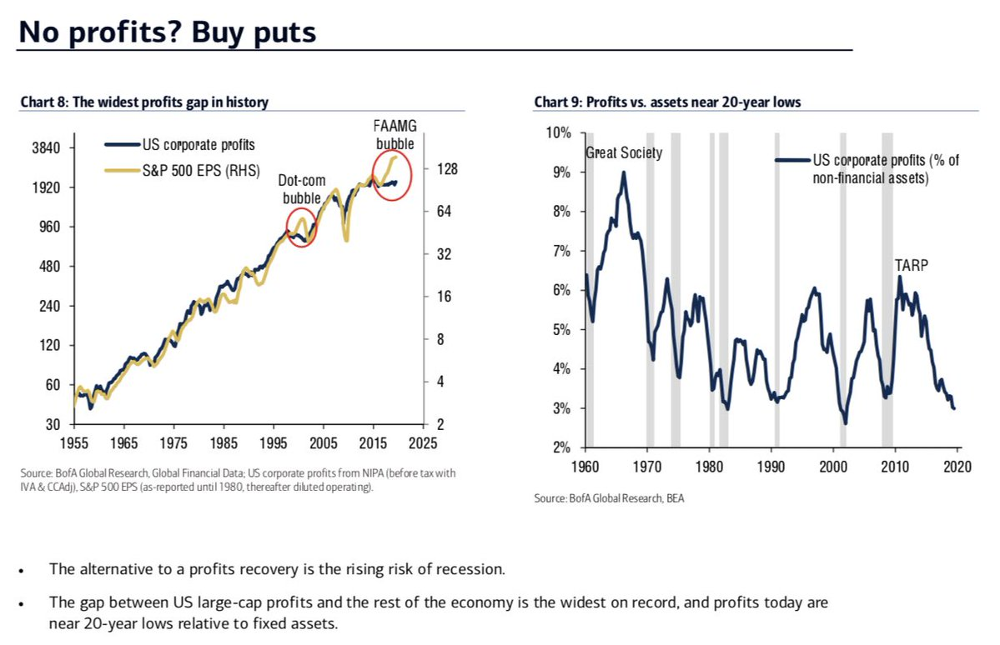



5e02f6e0ea78a895950869de
0.5
2020-03-08 15:30:30.502000
DIFFER: {'large caps'}
MODEL: {'volatility'}
TAGGER: {'volatility', 'large caps'}


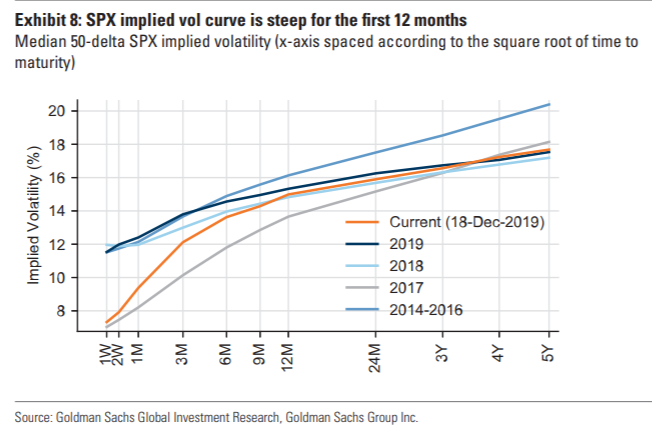



5e064fcbc26373f083b34e5a
0.25
2020-03-08 15:29:28.334000
DIFFER: {'sentiment', 'politics', 'volatility'}
MODEL: {'futures'}
TAGGER: {'sentiment', 'volatility', 'politics', 'futures'}


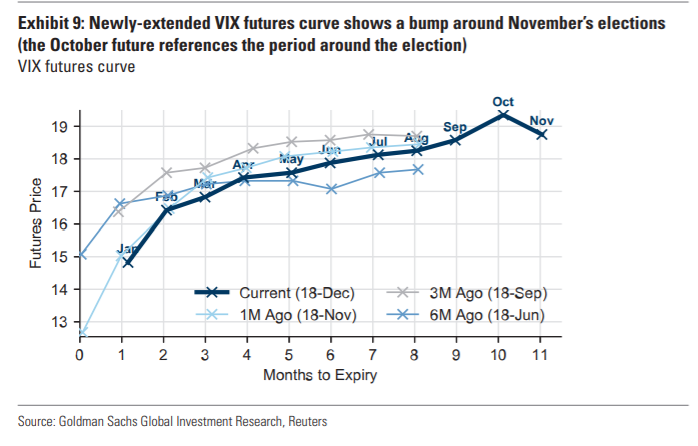



5e045036ebc02109584dcc7b
0.6666666666666666
2020-03-08 15:26:51.293000
DIFFER: {'global'}
MODEL: {'currency', 'payments'}
TAGGER: {'global', 'currency', 'payments'}


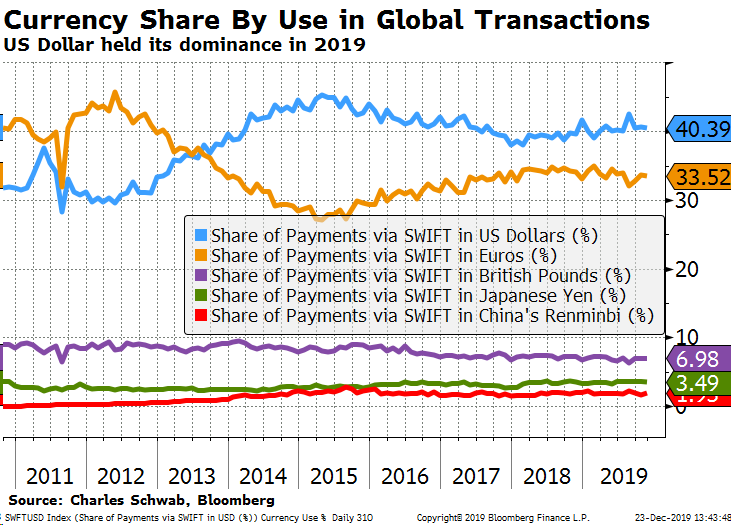



5e02a789ecd005afdaf91bdb
0.75
2020-03-08 14:38:52.275000
DIFFER: {'trade war'}
MODEL: {'trade', 'imports', 'tariffs'}
TAGGER: {'trade', 'imports', 'trade war', 'tariffs'}


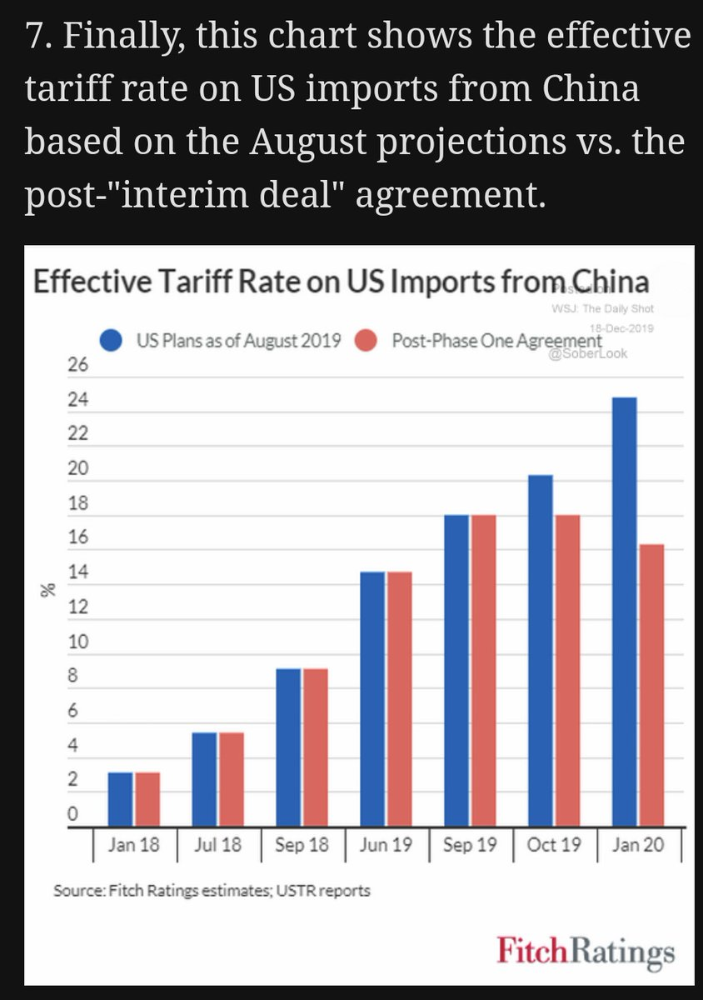



5e02c6ab30ac50bea26e0e0e
0.3333333333333333
2020-03-08 14:38:06.367000
DIFFER: {'financials', 'large caps'}
MODEL: {'buyback'}
TAGGER: {'financials', 'large caps', 'buyback'}


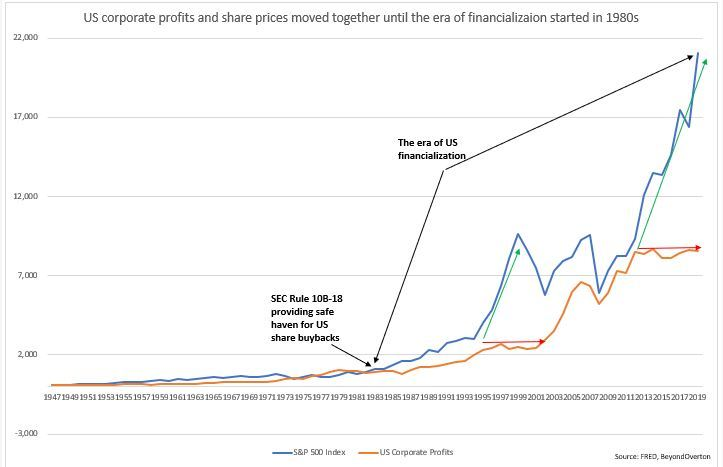



5e17329483775cffcfdc71e6
0.6666666666666666
2020-03-08 14:05:26.949000
DIFFER: {'debt'}
MODEL: {'banking', 'credit card', 'cashless', 'loan', 'credit'}
TAGGER: {'banking', 'credit card', 'debt', 'loan', 'cashless'}


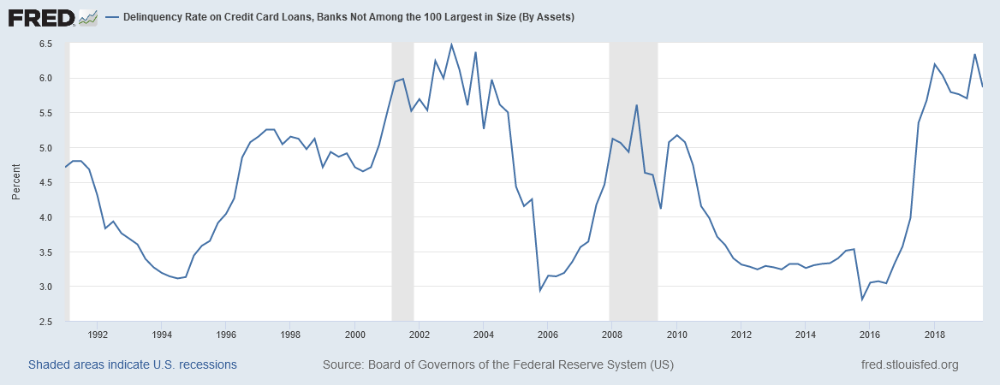



5e1743dcb0241b31cff10aaa
0.4
2020-03-08 13:07:28.877000
DIFFER: {'financials', 'credit', 'debt'}
MODEL: {'bankruptcy', 'consumer'}
TAGGER: {'bankruptcy', 'financials', 'debt', 'consumer', 'credit'}


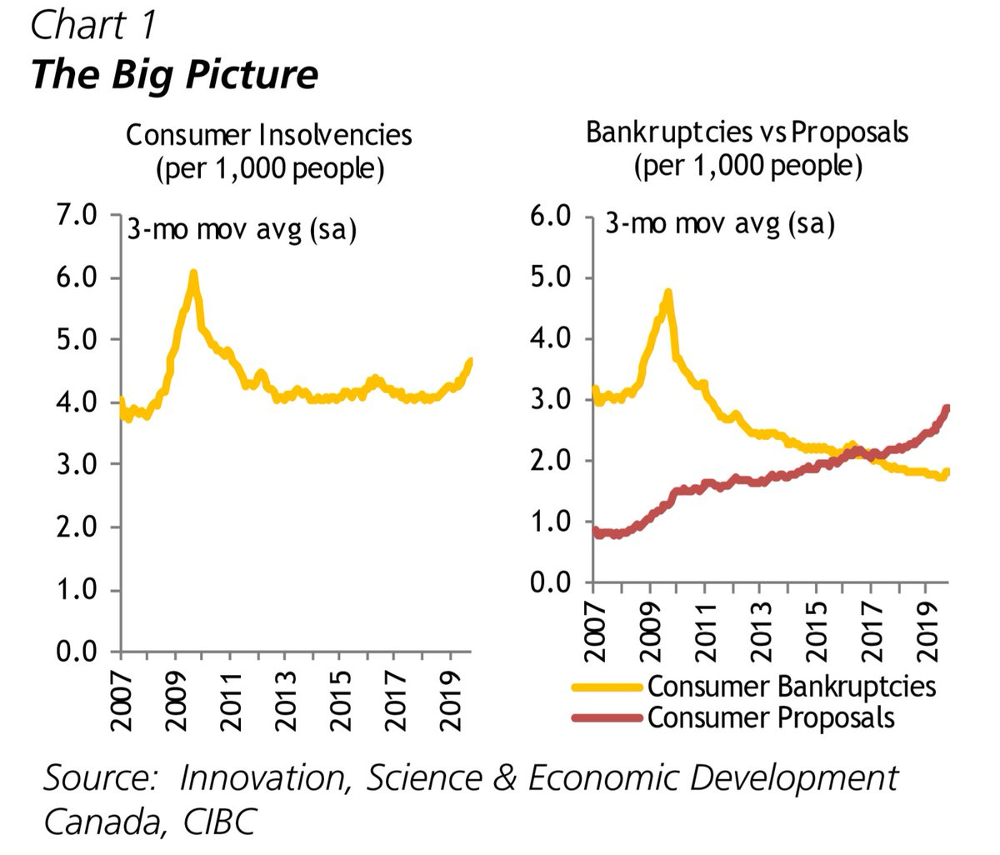



5e1b9794acfefcecab9f7ccf
0.4666666666666667
2020-03-08 13:05:04.868000
DIFFER: {'sentiment', 'metals', 'bull market'}
MODEL: {'technology', 'mining', 'consumer discretionary', 'real estate', 'information technology', 'materials', 'trade', 'financials', 'industrials', 'utilities', 'health', 'energy'}
TAGGER: {'technology', 'real estate', 'bull market', 'financials', 'industrials', 'utilities', 'metals', 'health', 'sentiment', 'energy'}


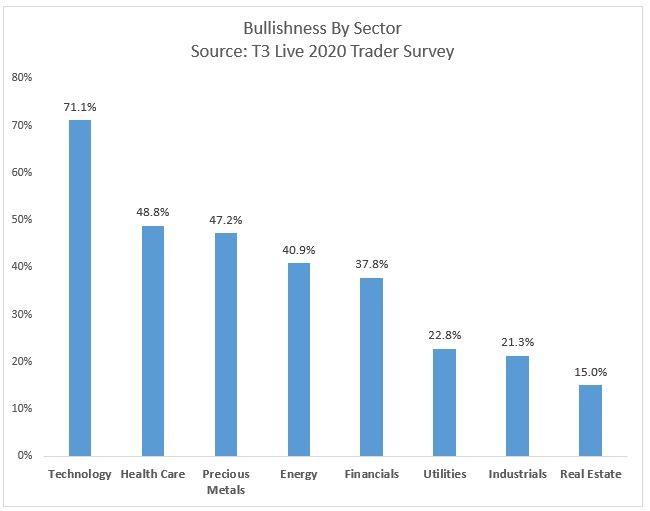



5e17fe7a3a3af4aa7fe0cb6c
0.7142857142857143
2020-03-08 13:02:46.611000
DIFFER: {'solar energy', 'legal'}
MODEL: {'mining', 'trade', 'metals', 'commodities', 'tariffs'}
TAGGER: {'legal', 'mining', 'solar energy', 'trade', 'metals', 'commodities', 'tariffs'}


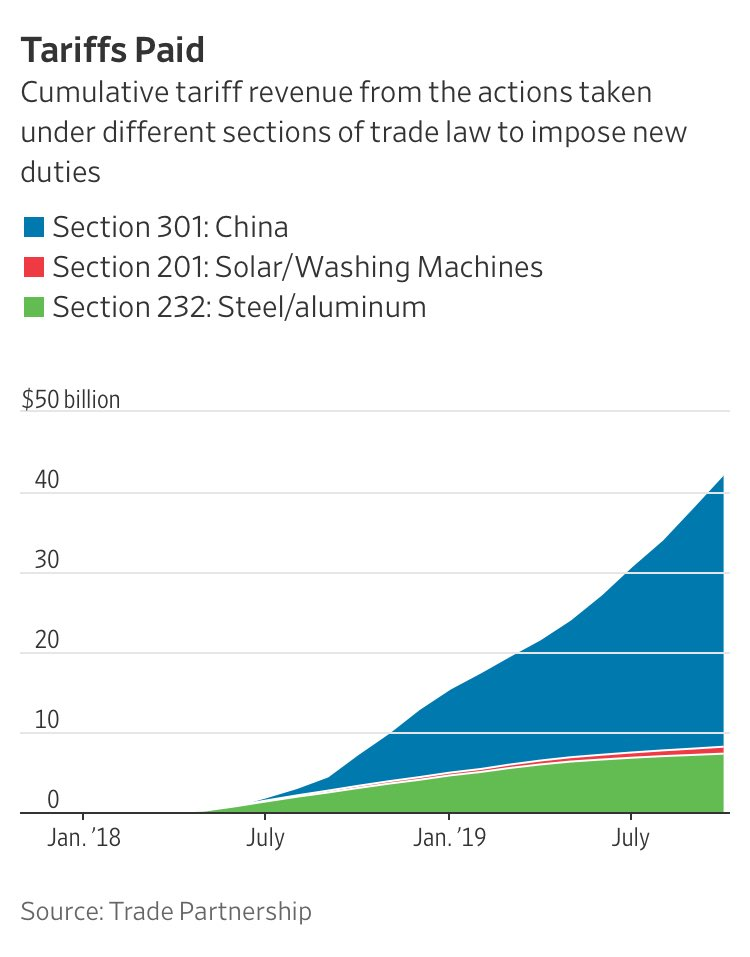



5e1a993ab1548eea67ddcf8b
0.0
2020-03-08 12:56:17.541000
DIFFER: {'sentiment', 'bull market', 'large caps'}
MODEL: set()
TAGGER: {'sentiment', 'large caps', 'bull market'}


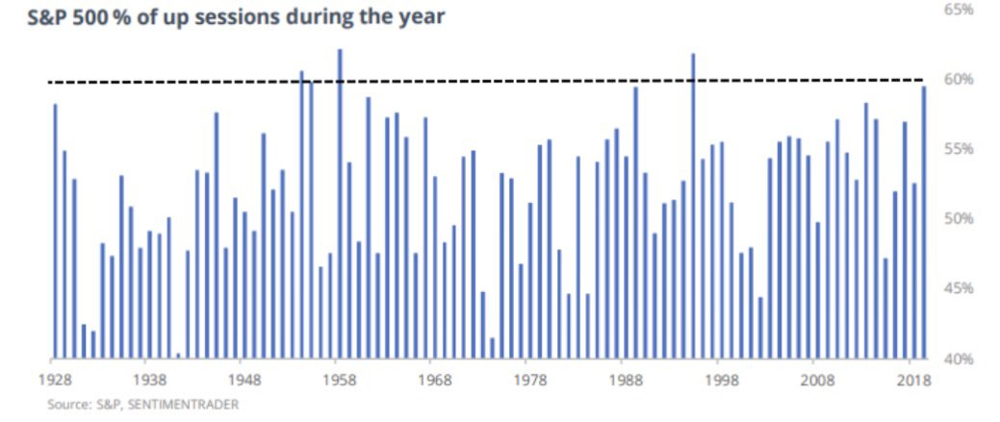



5e1829f79b4b433e300a5517
0.6666666666666666
2020-03-08 12:17:23.540000
DIFFER: {'macro'}
MODEL: {'gdp', 'deficit'}
TAGGER: {'macro', 'gdp', 'deficit'}


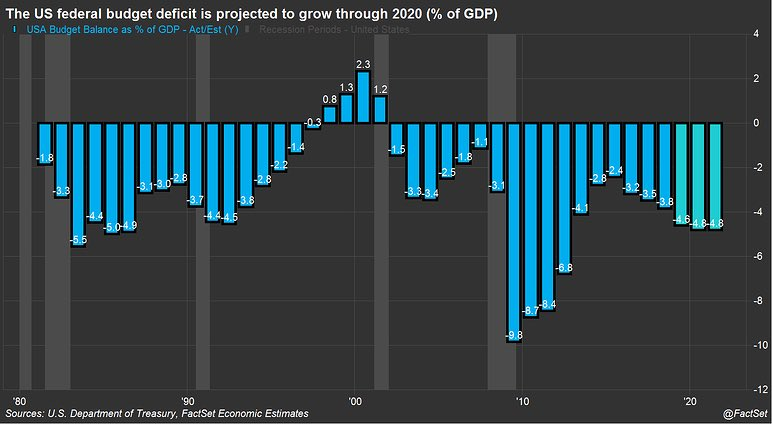



5e197fb9cac91b183ec4e220
0.6666666666666666
2020-03-08 12:09:07.861000
DIFFER: set()
MODEL: {'technology', 'manufacturing', 'employment', 'industrials', 'global', 'robotics'}
TAGGER: {'global', 'technology', 'manufacturing', 'robotics'}


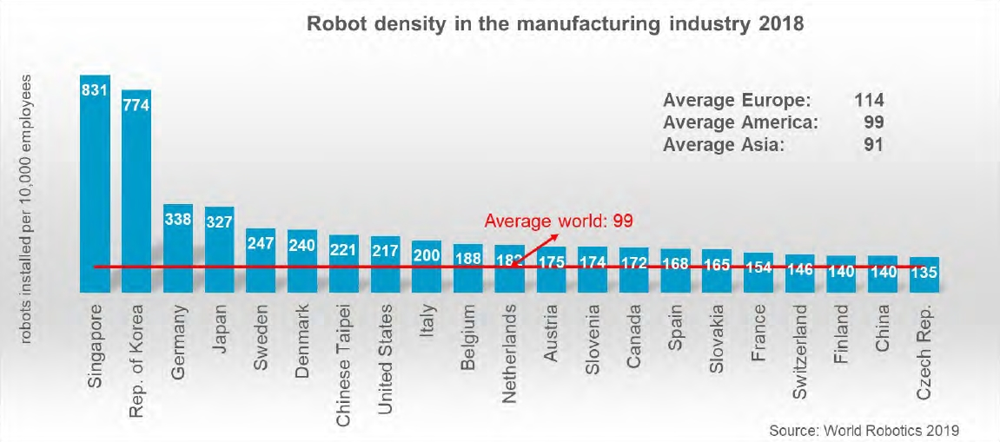



5e1bc8036c5ac09ee2499ae5
0.625
2020-03-08 12:01:49.722000
DIFFER: {'services', 'payments'}
MODEL: {'technology', 'information technology', 'financials', 'fintech', 'consumer', 'credit'}
TAGGER: {'technology', 'payments', 'financials', 'fintech', 'services', 'consumer', 'credit'}


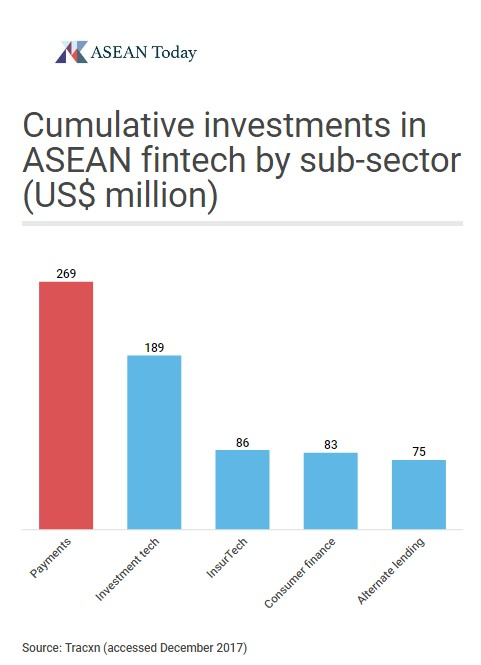



5e1c4bea84e200895f1f0292
0.3333333333333333
2020-03-08 11:54:45.506000
DIFFER: {'legal', 'social'}
MODEL: {'crimes'}
TAGGER: {'legal', 'crimes', 'social'}


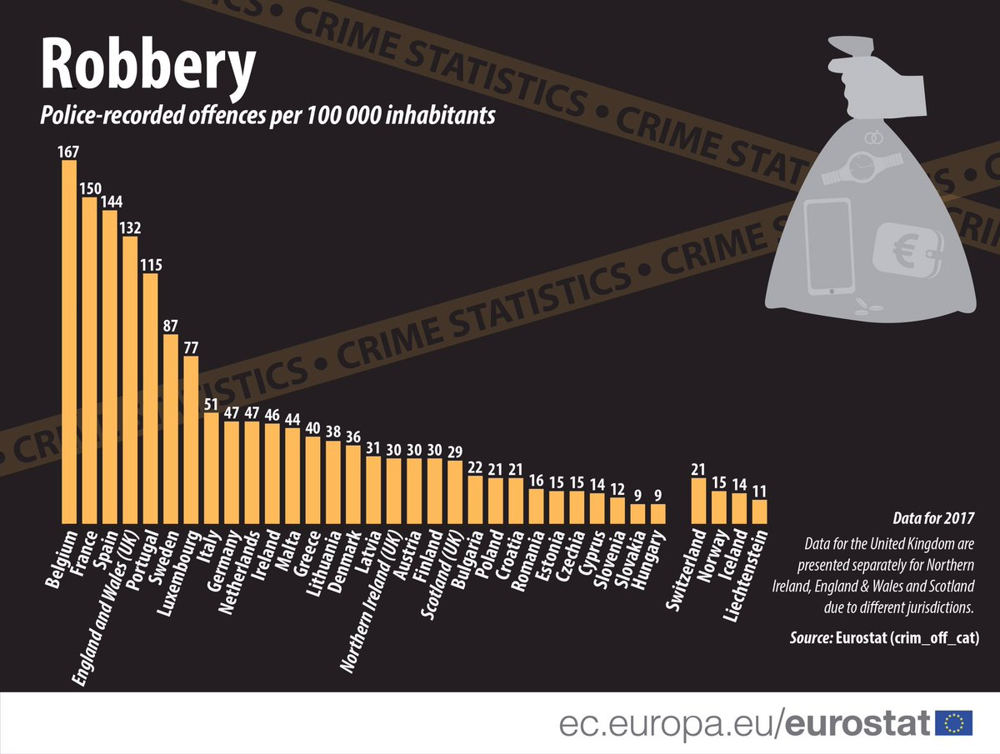



5e1b58e176ae9f5c7e982184
0.7142857142857143
2020-03-08 10:40:13.569000
DIFFER: {'trade war', 'large caps'}
MODEL: {'mining', 'futures', 'trade', 'metals', 'commodities'}
TAGGER: {'mining', 'trade war', 'futures', 'large caps', 'trade', 'metals', 'commodities'}


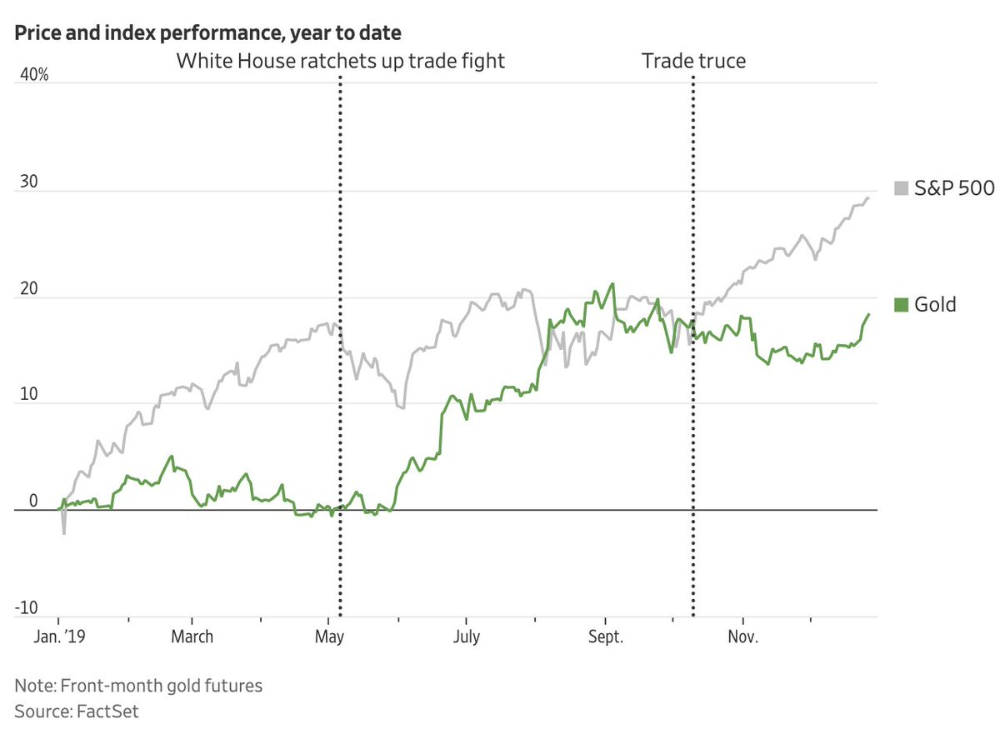



5e17acff37a9441cf51d5176
0.3333333333333333
2020-03-08 10:39:27.650000
DIFFER: {'cash', 'credit'}
MODEL: {'dividends'}
TAGGER: {'dividends', 'cash', 'credit'}


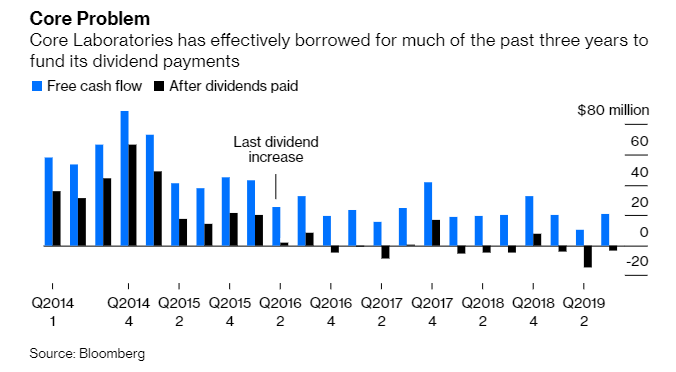



5e17fda88d9d0823c91b0aaa
0.5
2020-03-08 10:36:00.252000
DIFFER: {'digital', 'art'}
MODEL: {'streaming', 'music'}
TAGGER: {'music', 'streaming', 'digital', 'art'}


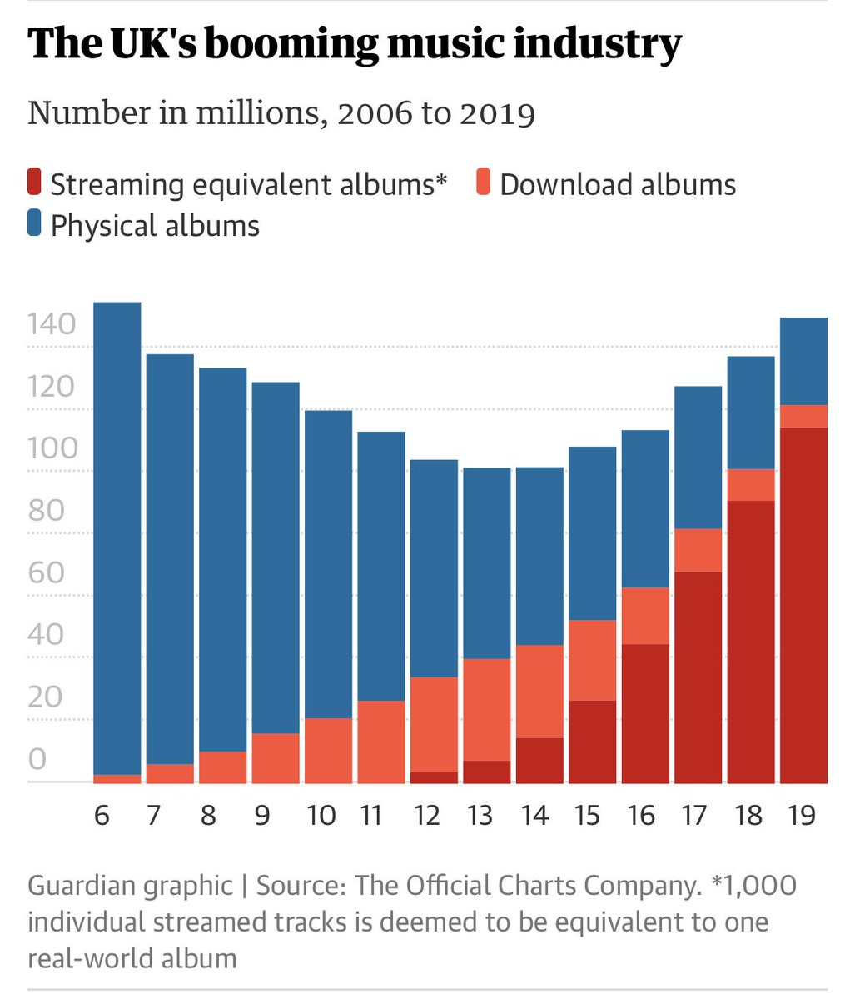



5e1aee5e49d3a1ba02966683
0.0
2020-03-08 10:17:41.641000
DIFFER: {'migration', 'education', 'social'}
MODEL: {'gender', 'demography', 'social justice'}
TAGGER: {'migration', 'education', 'social'}


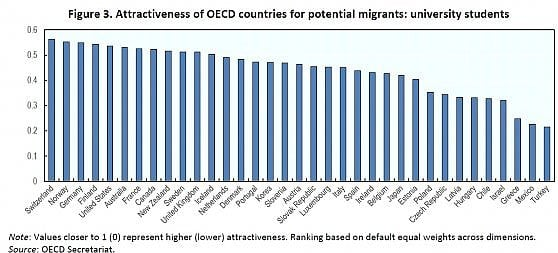



5e1b063c10bf151146366673
0.1
2020-03-08 10:02:39.836000
DIFFER: {'government bonds', 'monetary policy', 'macro', 'bonds', 'quantitative easing'}
MODEL: {'legal', 'government', 'large caps', 'politics', 'social'}
TAGGER: {'monetary policy', 'government bonds', 'macro', 'bonds', 'quantitative easing', 'large caps'}


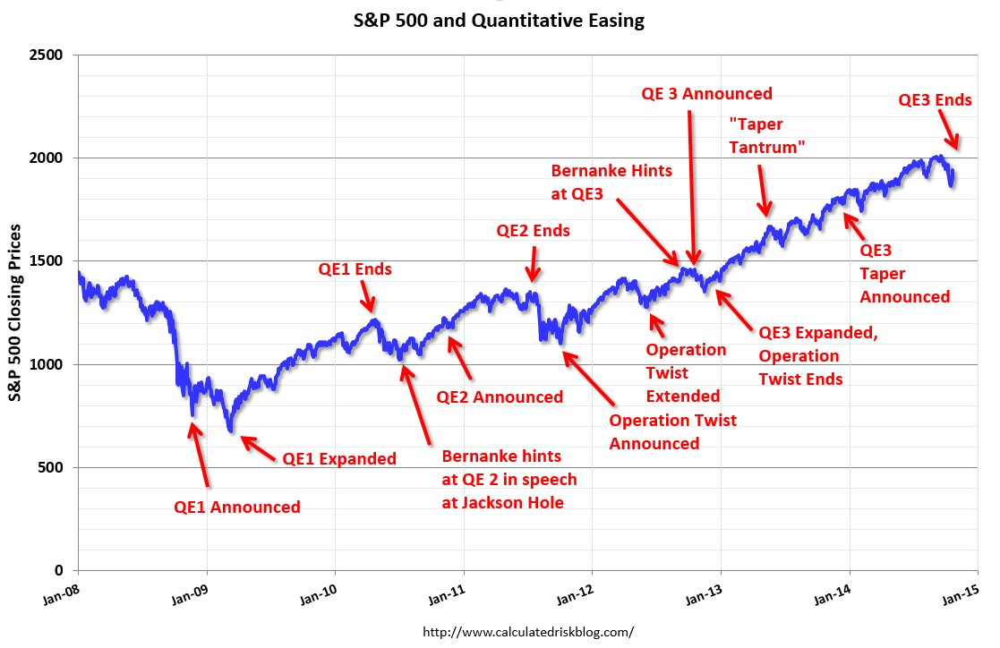



5e1bb044c4895cd2da9001e3
0.6666666666666666
2020-03-08 10:00:07.919000
DIFFER: {'gdp'}
MODEL: {'macro', 'deficit'}
TAGGER: {'macro', 'gdp', 'deficit'}


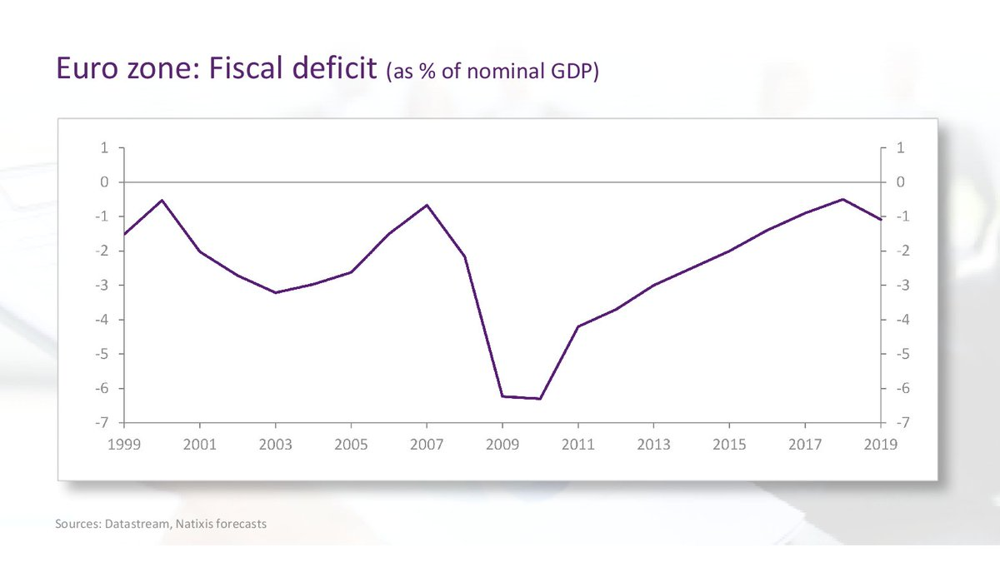



5e175e0926ac45f4cec33d51
0.5
2020-03-08 09:59:56.466000
DIFFER: {'technology'}
MODEL: {'software'}
TAGGER: {'technology', 'software'}


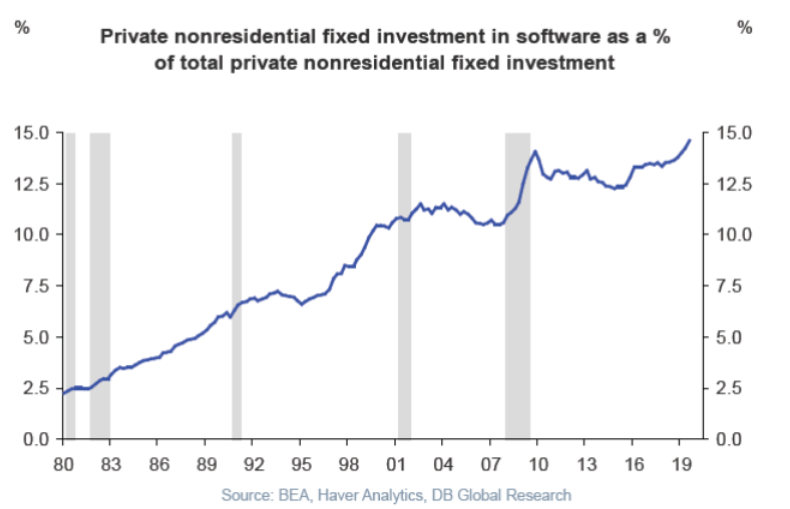



5e1bb043c4895cd2da9001da
0.4
2020-03-08 09:52:26.918000
DIFFER: {'debt', 'fixed income'}
MODEL: {'default', 'bonds', 'government bonds'}
TAGGER: {'default', 'debt', 'bonds', 'fixed income'}


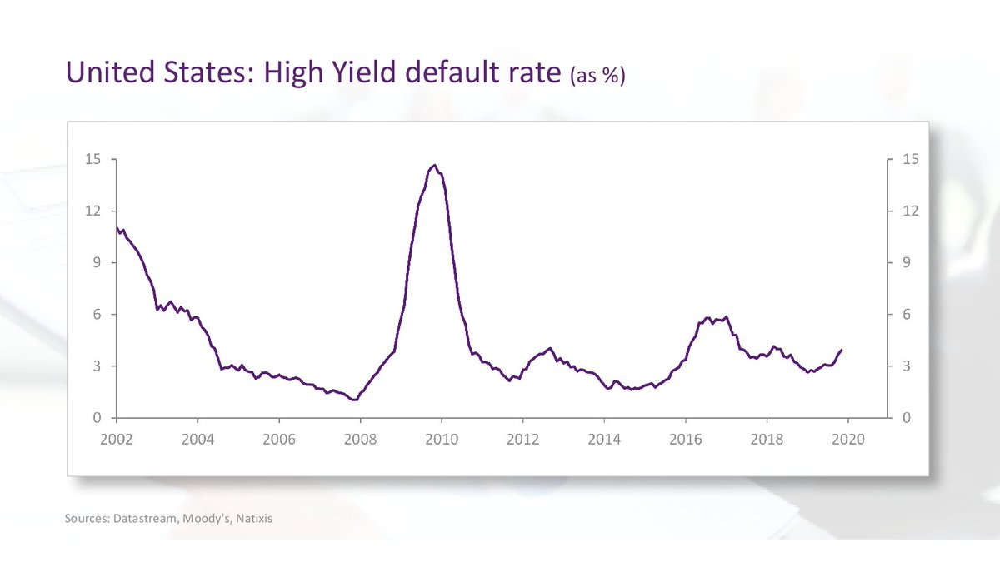



5e175ab8eb32024d5d4c0fe7
0.9166666666666666
2020-03-08 09:50:57.898000
DIFFER: {'large caps'}
MODEL: {'consumer staples', 'consumer discretionary', 'real estate', 'information technology', 'materials', 'financials', 'industrials', 'utilities', 'health', 'energy', 'telecom'}
TAGGER: {'consumer staples', 'consumer discretionary', 'real estate', 'information technology', 'materials', 'large caps', 'financials', 'industrials', 'utilities', 'health', 'energy', 'telecom'}


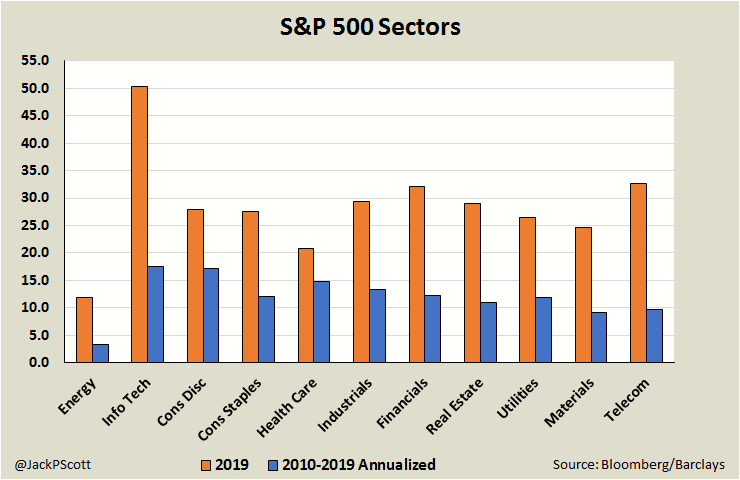



5e1aee2346fc4888bb507eaf
0.3333333333333333
2020-03-08 08:44:41.707000
DIFFER: {'large caps'}
MODEL: {'dividends', 'bonds'}
TAGGER: {'dividends', 'large caps'}


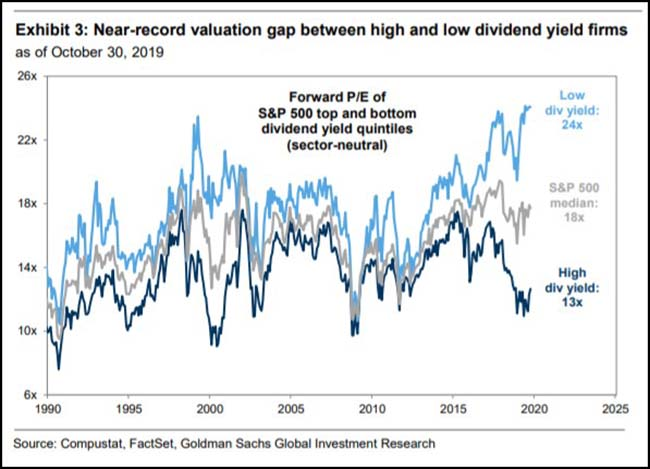



5e16f5c6d751bedcfbe362cd
0.5714285714285714
2020-03-08 08:44:01.619000
DIFFER: {'transportation', 'batteries', 'fuel'}
MODEL: {'chemical', 'energy', 'electricity', 'commodities'}
TAGGER: {'fuel', 'chemical', 'transportation', 'electricity', 'energy', 'batteries', 'commodities'}


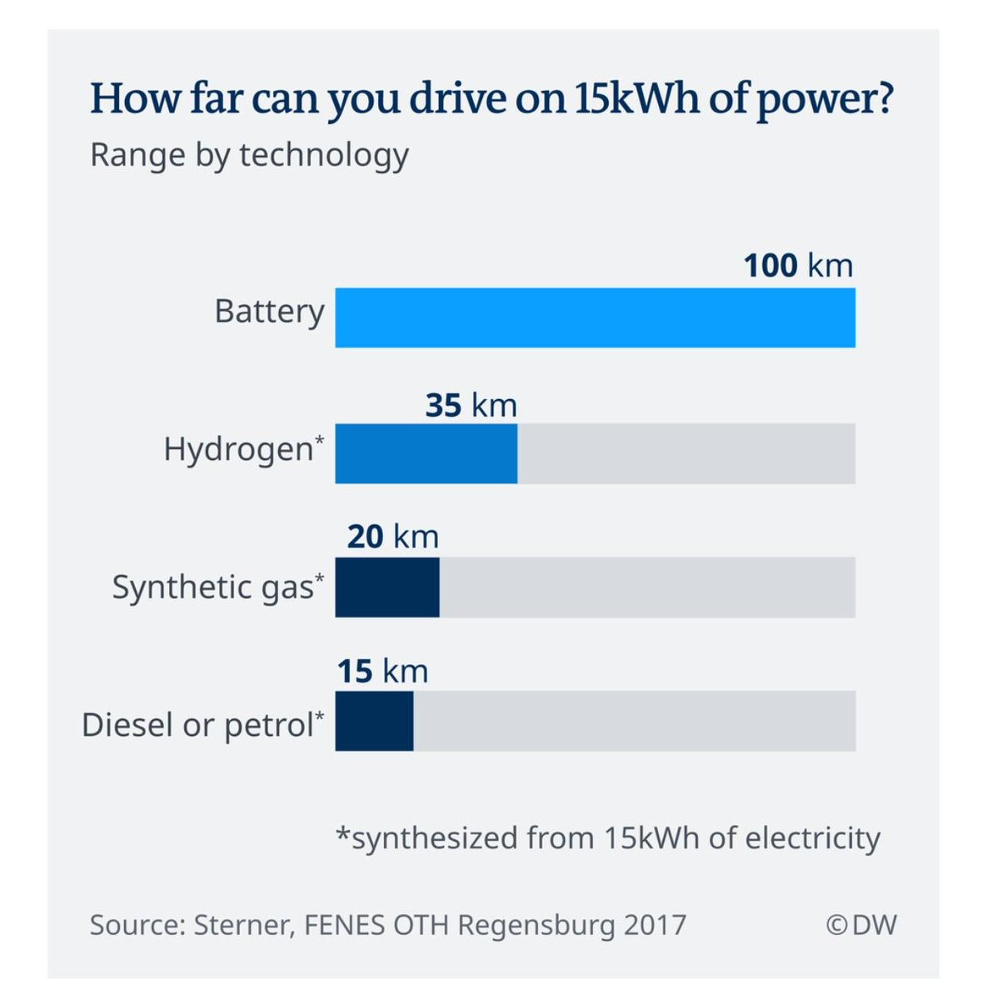



5e1b5680b9476e30a001be8e
0.6666666666666666
2020-03-08 08:06:15.398000
DIFFER: {'leisure', 'gaming'}
MODEL: {'real estate', 'travel', 'recession', 'bubble'}
TAGGER: {'gaming', 'recession', 'real estate', 'bubble', 'travel', 'leisure'}


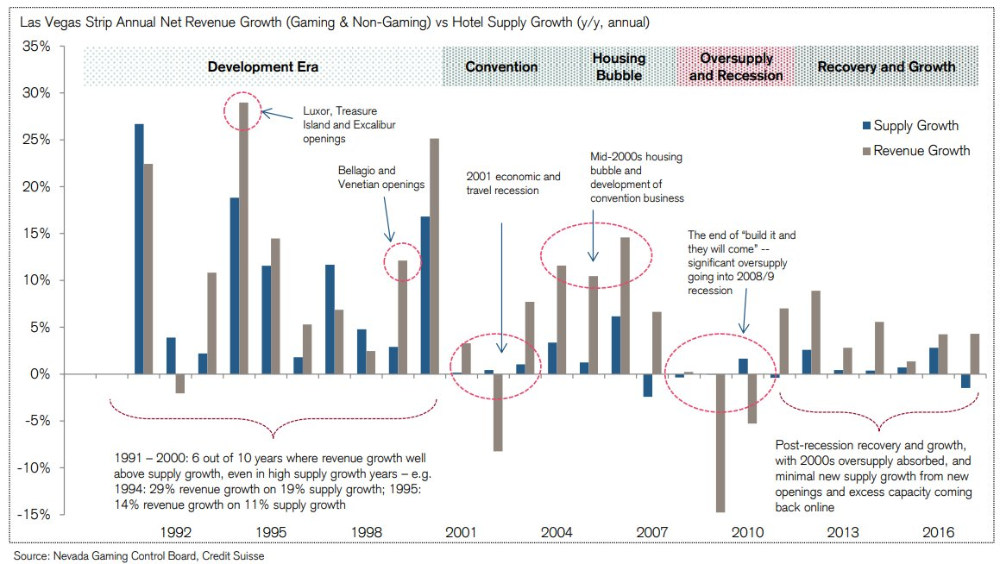



5e17b4e0b0241b31cff10e83
0.75
2020-03-08 07:53:39.254000
DIFFER: set()
MODEL: {'legal', 'migration', 'population', 'social'}
TAGGER: {'legal', 'migration', 'social'}


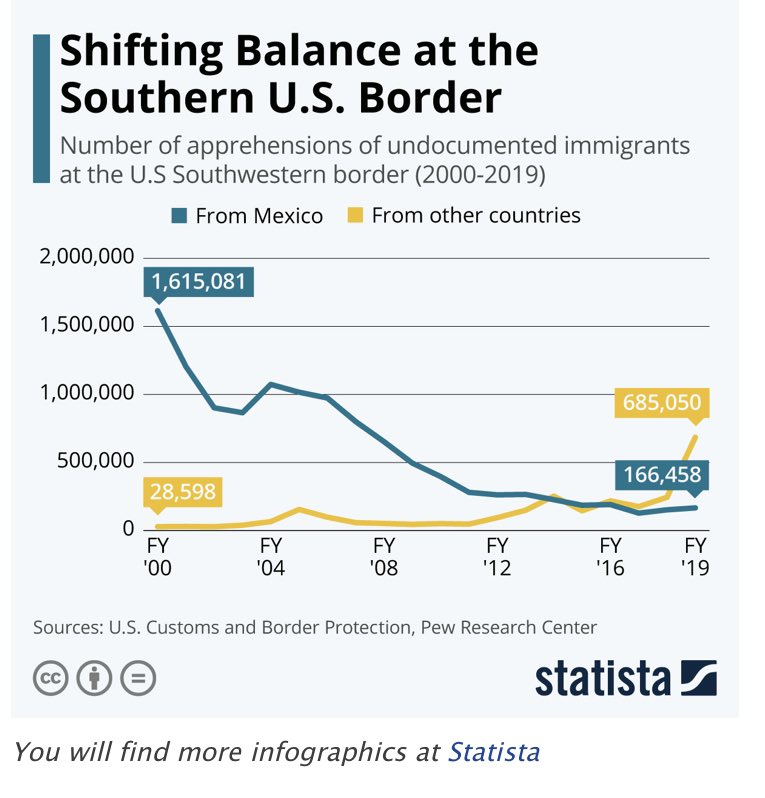



5e19985dbf41a391eff789f2
0.6666666666666666
2020-03-08 07:52:06.956000
DIFFER: {'global'}
MODEL: {'banking', 'payments'}
TAGGER: {'global', 'banking', 'payments'}


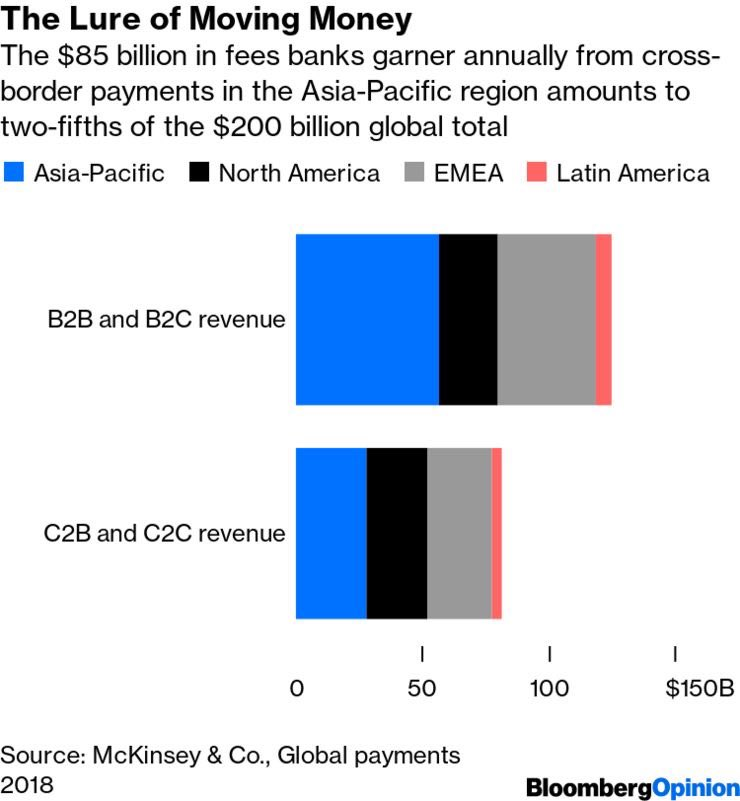



5e17522a3a3af4aa7fe0c4f0
0.8
2020-03-08 07:39:04.206000
DIFFER: set()
MODEL: {'technology', 'innovation', 'science', 'intellectual property', 'global'}
TAGGER: {'science', 'global', 'innovation', 'intellectual property'}


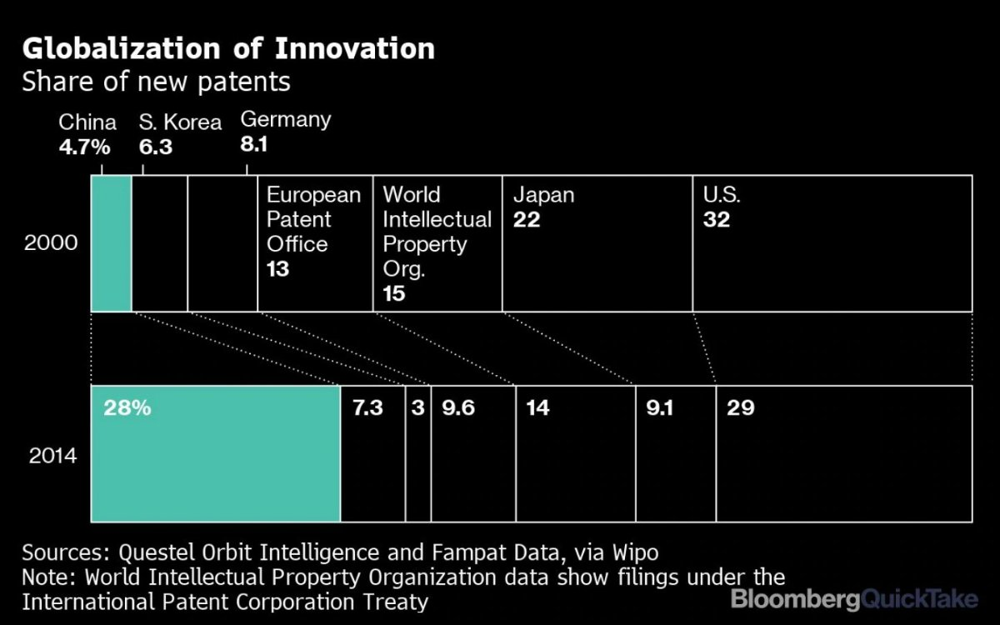



5e16e6e137a9441cf51d4b3d
0.5
2020-03-08 07:29:52.837000
DIFFER: {'global', 'demography'}
MODEL: {'gender', 'children', 'education', 'woman'}
TAGGER: {'demography', 'woman', 'children', 'education', 'global'}


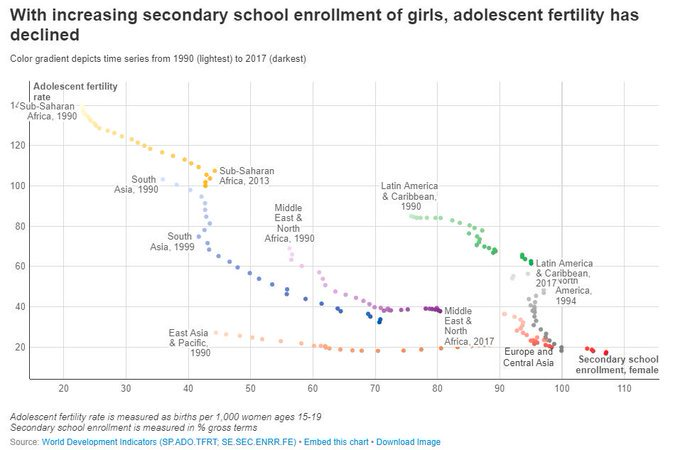



5e1971935a0b6291f5085e4e
0.4
2020-03-08 07:07:25.789000
DIFFER: {'biotech'}
MODEL: {'global', 'developed markets', 'pharmaceutical industry', 'medicine'}
TAGGER: {'medicine', 'pharmaceutical industry', 'biotech'}


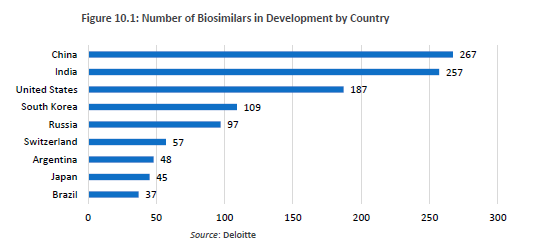



5e17c4bcf05efdc386e94ca3
0.4666666666666667
2020-03-08 06:46:54.301000
DIFFER: {'fixed income', 'energy', 'currency', 'large caps', 'funds', 'etf', 'cash', 'loan'}
MODEL: {'mining', 'government bonds', 'high yield', 'bonds', 'metals', 'commodities', 'emerging markets'}
TAGGER: {'mining', 'government bonds', 'high yield', 'bonds', 'fixed income', 'currency', 'large caps', 'etf', 'funds', 'metals', 'energy', 'cash', 'loan', 'commodities', 'emerging markets'}


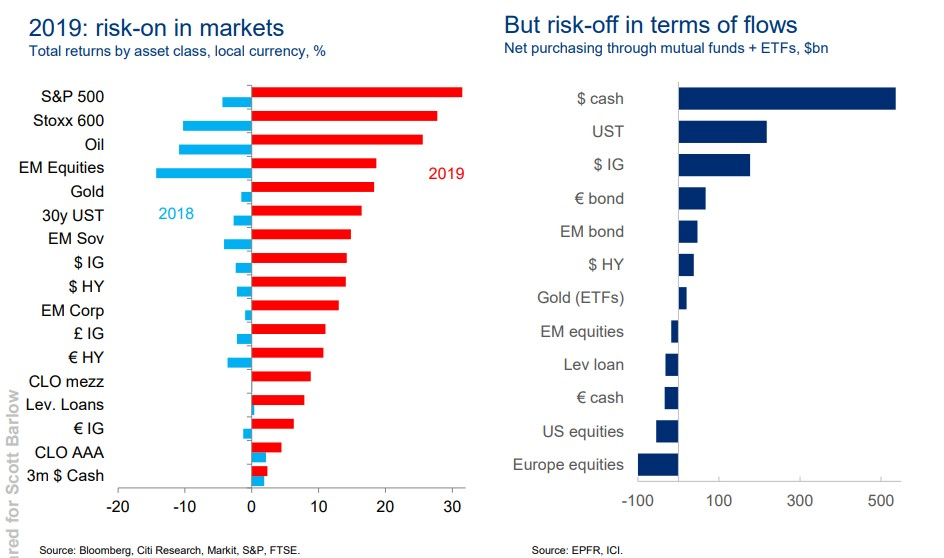



5e1a90315800463d2cbf4669
0.46153846153846156
2020-03-08 05:59:40.918000
DIFFER: {'drugs', 'chemical', 'metals', 'medicine', 'pharmaceutical industry'}
MODEL: {'imports', 'retail', 'trade', 'consumer products', 'agriculture', 'taxes', 'commodities', 'tariffs'}
TAGGER: {'taxes', 'drugs', 'chemical', 'imports', 'trade', 'metals', 'consumer products', 'medicine', 'pharmaceutical industry', 'commodities', 'tariffs'}


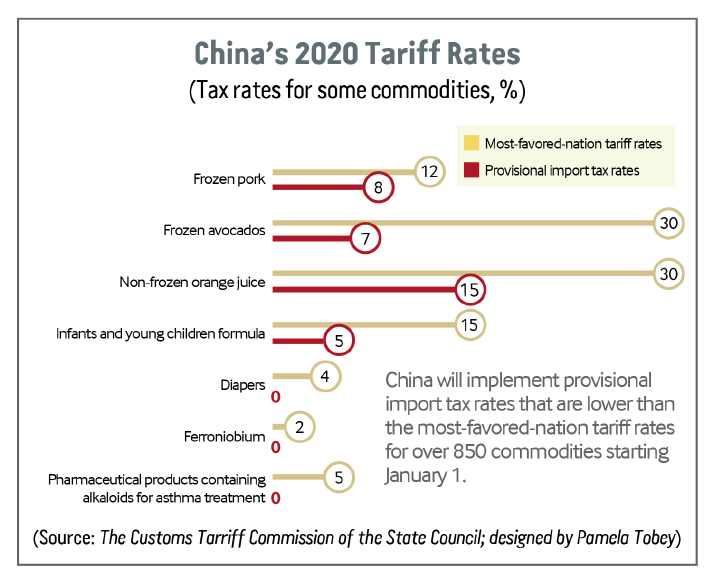



5e1a90315800463d2cbf4667
0.5
2020-03-08 05:05:19.922000
DIFFER: {'internet', 'construction & engineering', 'biotech', 'semiconductors'}
MODEL: {'technology', 'mining', 'chemical', 'information technology', 'manufacturing', 'financials', 'industrials', 'm&a', 'health', 'energy'}
TAGGER: {'mining', 'construction & engineering', 'information technology', 'manufacturing', 'semiconductors', 'financials', 'biotech', 'm&a', 'health', 'energy', 'internet'}


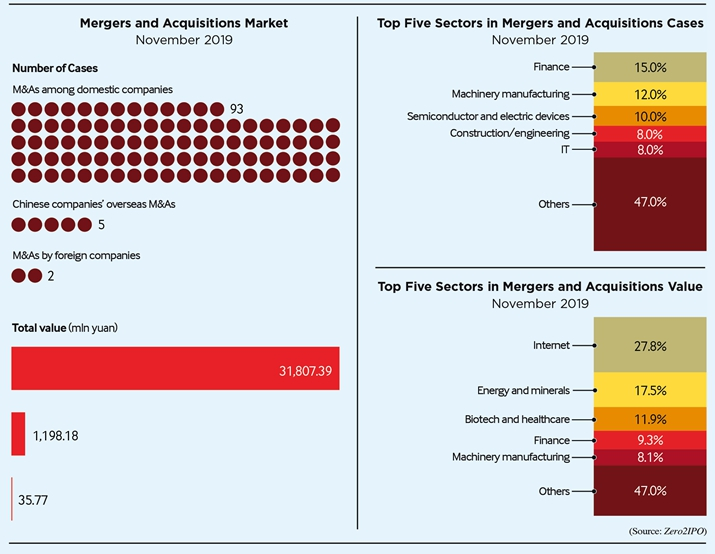



5e172f904eda81af4508318a
0.7142857142857143
2020-03-08 04:43:24.174000
DIFFER: {'technology', 'taxes', 'global', 'large caps'}
MODEL: {'consumer staples', 'consumer discretionary', 'real estate', 'materials', 'financials', 'industrials', 'utilities', 'health', 'energy', 'telecom'}
TAGGER: {'consumer staples', 'technology', 'consumer discretionary', 'real estate', 'materials', 'large caps', 'financials', 'industrials', 'utilities', 'health', 'energy', 'taxes', 'telecom', 'global'}


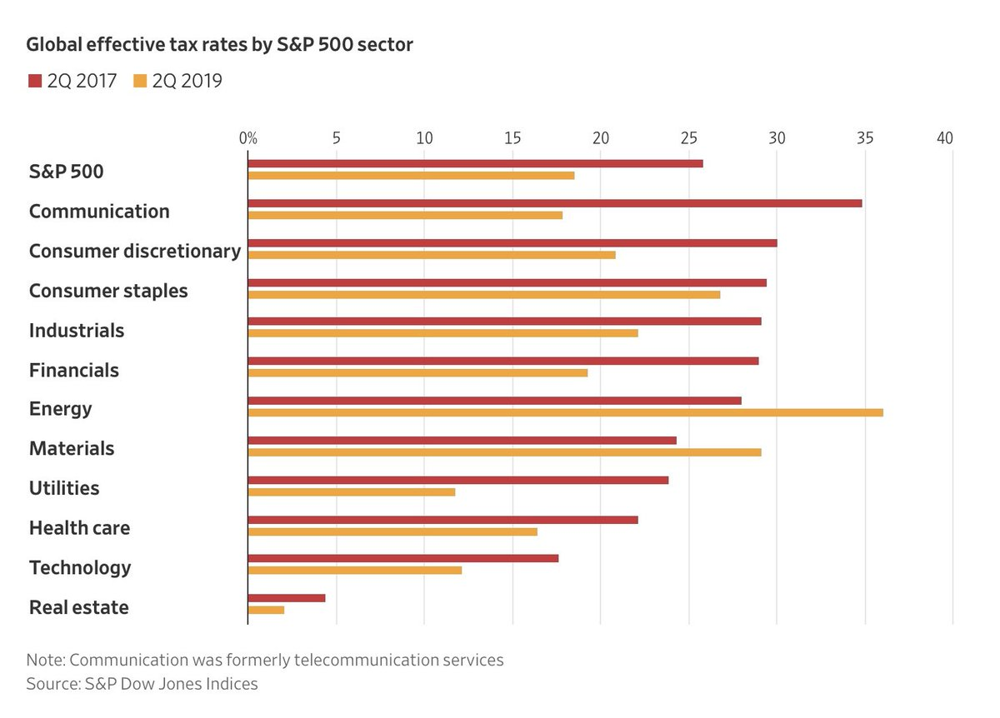



5e194e6c42bacaa86e3d2161
0.5
2020-03-08 04:42:17.259000
DIFFER: {'macro', 'commodities'}
MODEL: {'trade', 'deficit'}
TAGGER: {'macro', 'deficit', 'commodities', 'trade'}


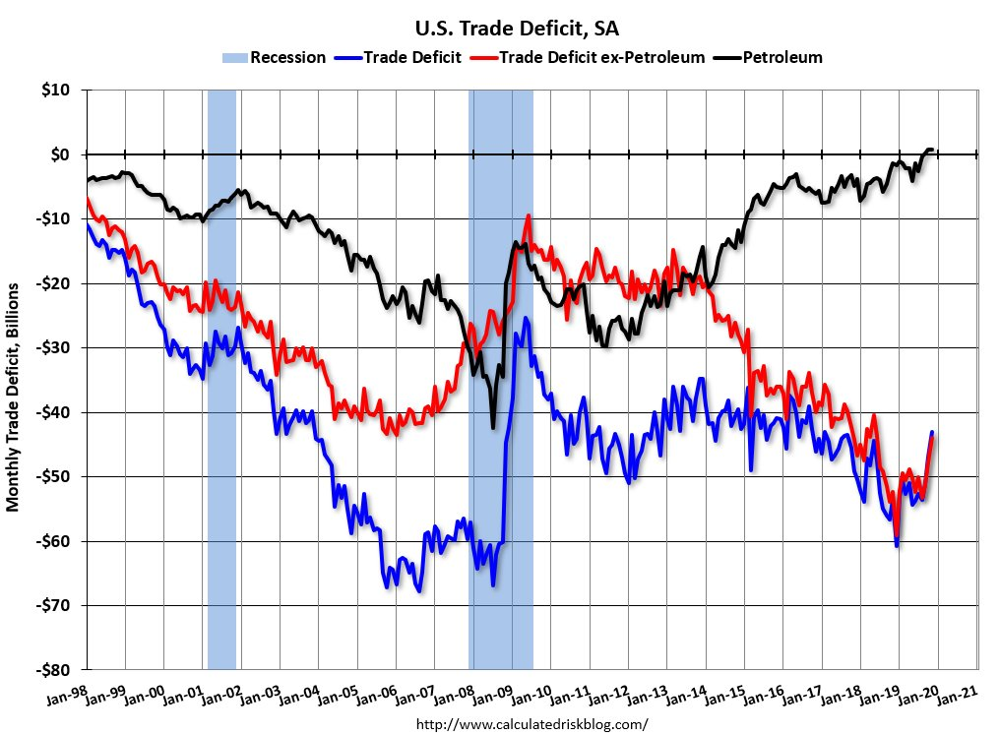



5e16f03319580d16a5584af0
0.6666666666666666
2020-03-08 04:33:13.279000
DIFFER: {'fixed income'}
MODEL: {'bonds', 'high yield'}
TAGGER: {'bonds', 'fixed income', 'high yield'}


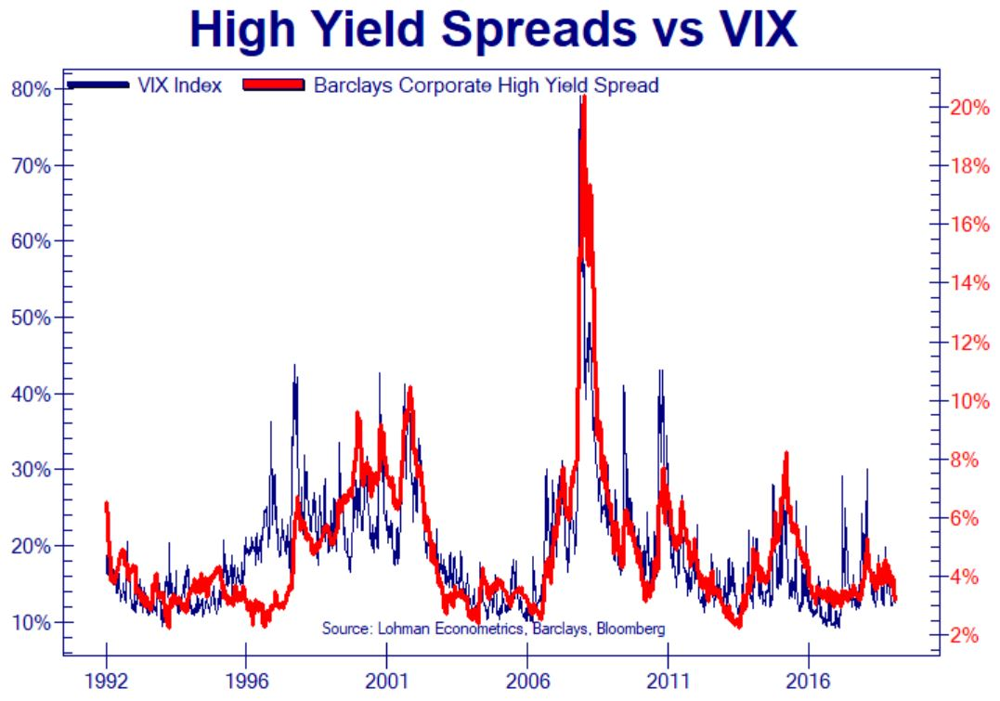



5e1876f837aec36535e70b25
0.5
2020-03-08 04:32:29.027000
DIFFER: {'social'}
MODEL: {'migration'}
TAGGER: {'migration', 'social'}


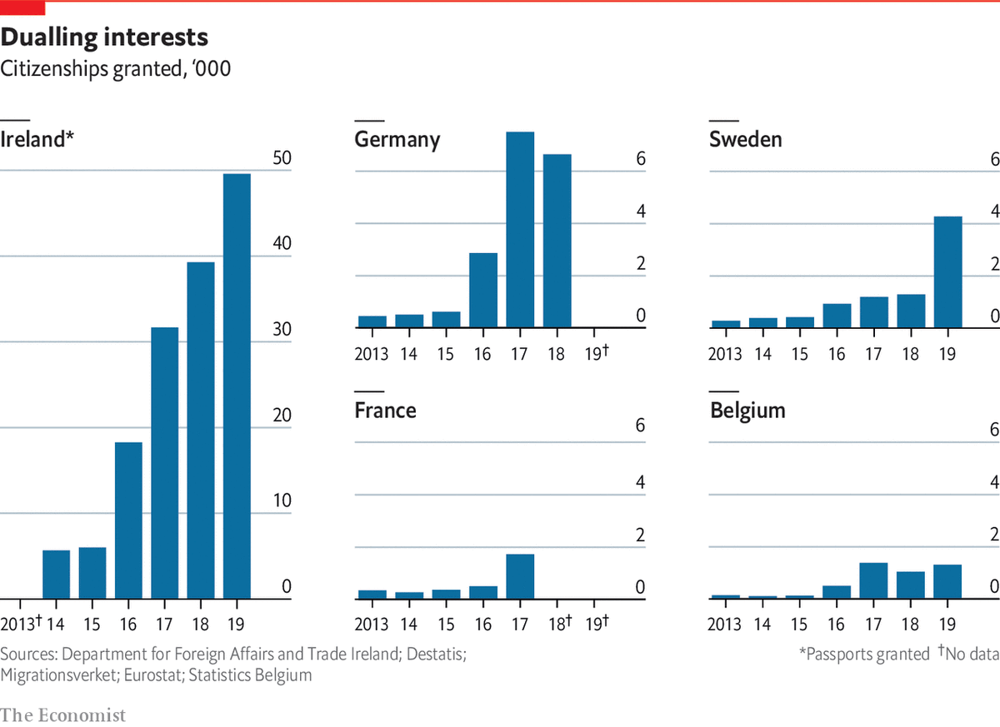



5e1b8c19ed96283fc4a02591
0.8
2020-03-08 04:31:24.669000
DIFFER: {'social'}
MODEL: {'macro', 'manufacturing', 'gdp', 'deficit'}
TAGGER: {'macro', 'gdp', 'deficit', 'manufacturing', 'social'}


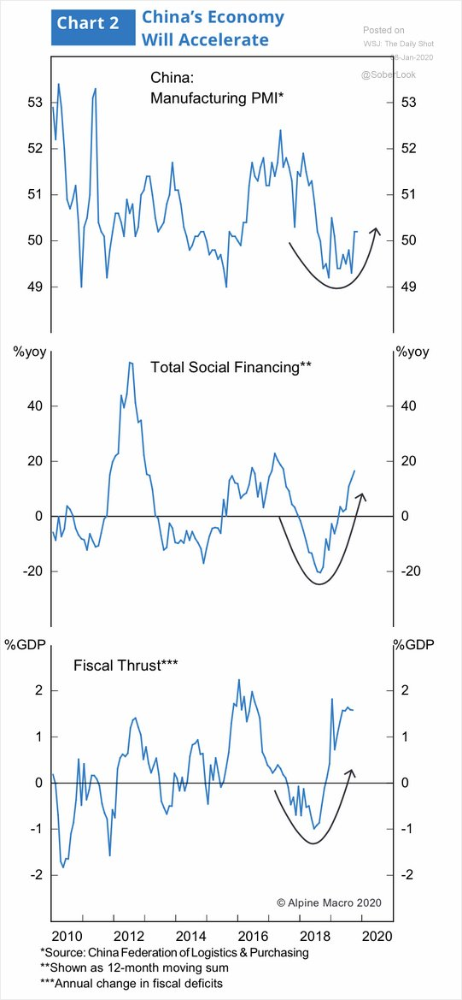



5e1979faeaffecb8a2373325
0.6666666666666666
2020-03-08 04:30:14.039000
DIFFER: set()
MODEL: {'technology', 'innovation', 'intellectual property'}
TAGGER: {'innovation', 'intellectual property'}


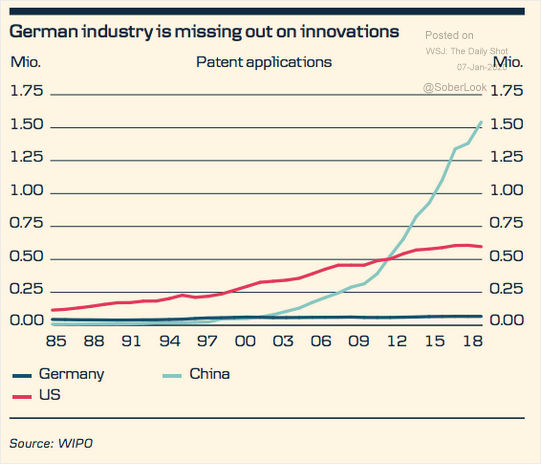



5e1aaa1249d3a1ba0296651f
0.8571428571428571
2020-03-07 16:34:26.578000
DIFFER: set()
MODEL: {'wealth', 'personal finance', 'global', 'inflation', 'poverty', 'population', 'social'}
TAGGER: {'wealth', 'personal finance', 'global', 'poverty', 'population', 'social'}


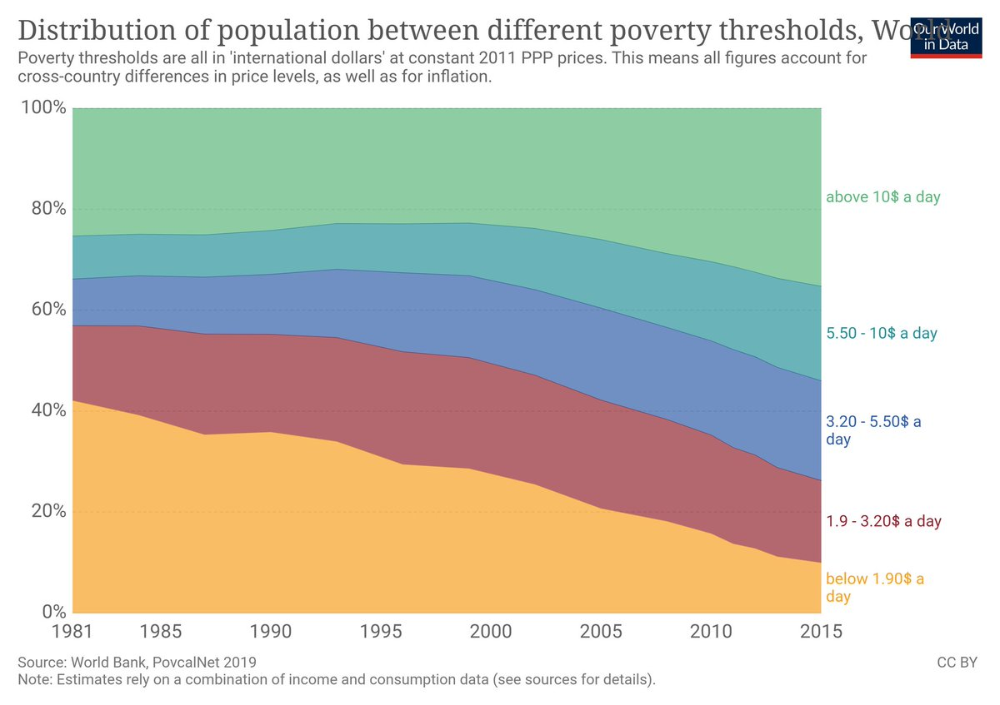



5e1ae2ccc37e9f2ffa6af958
0.625
2020-03-07 16:33:11.435000
DIFFER: {'funds', 'personal finance', 'consumer discretionary'}
MODEL: {'equality', 'social justice', 'real estate', 'wealth', 'education'}
TAGGER: {'equality', 'consumer discretionary', 'real estate', 'social justice', 'wealth', 'education', 'funds', 'personal finance'}


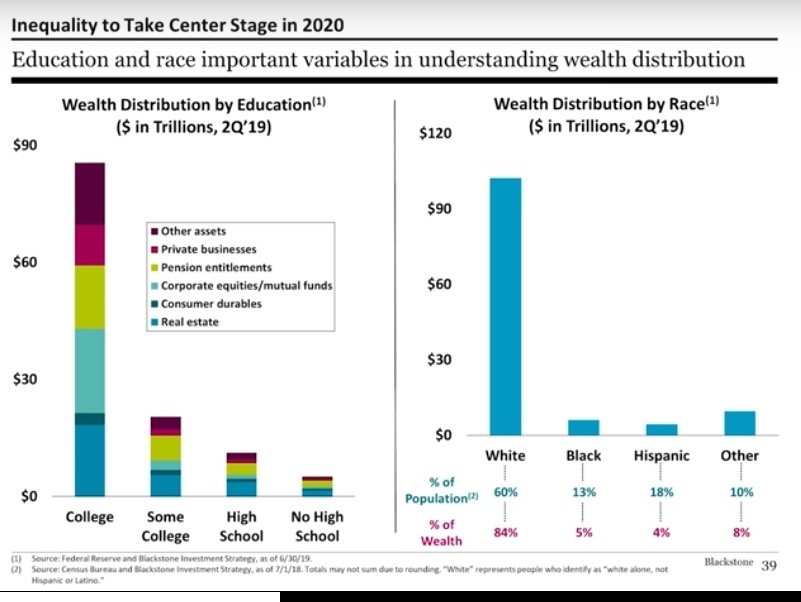



5e1861c2cd0dd599d2c465bf
0.4166666666666667
2020-03-07 16:30:35.818000
DIFFER: {'aviation', 'wireless', 'building materials', 'media', 'retail', 'tobacco', 'aerospace', 'services', 'metals', 'consumer products', 'software'}
MODEL: {'technology', 'mining', 'construction & engineering', 'automotive', 'vehicles', 'chemical', 'transportation', 'utilities', 'electricity', 'health', 'manufacturing', 'telecom', 'commodities'}
TAGGER: {'aviation', 'construction & engineering', 'wireless', 'chemical', 'utilities', 'consumer products', 'software', 'building materials', 'technology', 'metals', 'manufacturing', 'telecom', 'mining', 'automotive', 'media', 'retail', 'tobacco', 'aerospace', 'transportation', 'electricity', 'services'}


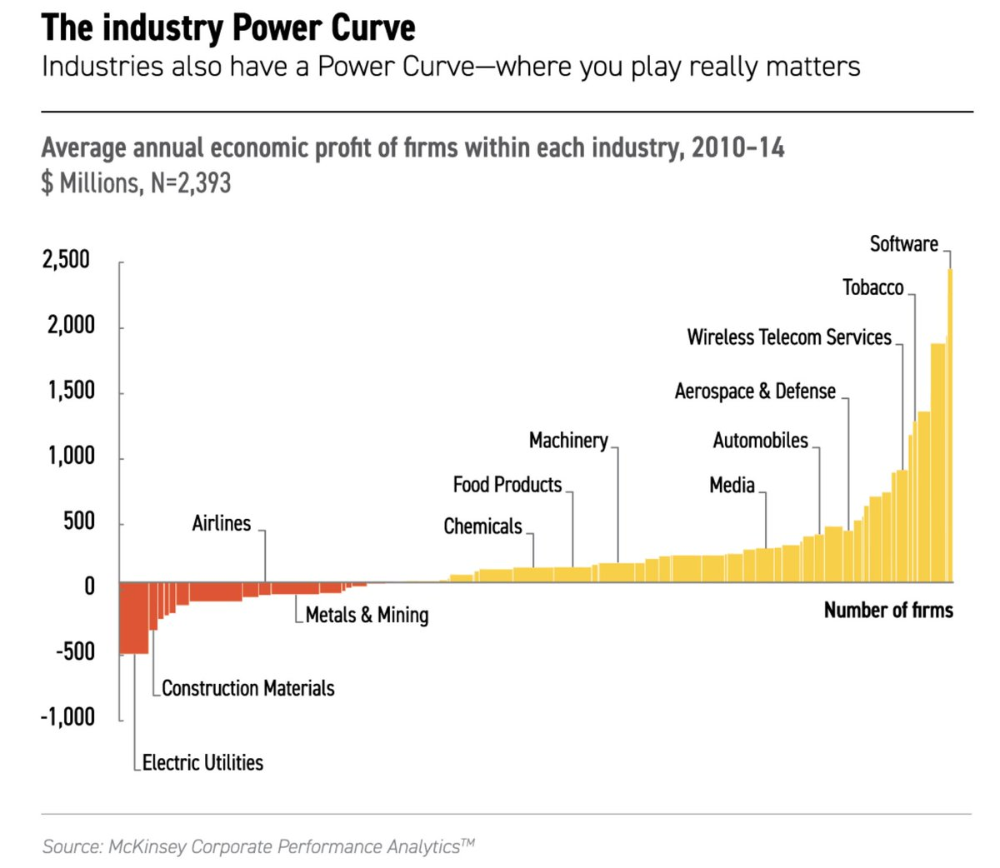



5e1f664d040ade4c827f243f
0.5
2020-03-07 16:08:29.477000
DIFFER: set()
MODEL: {'nonfarm payrolls', 'developed markets', 'labor', 'employment'}
TAGGER: {'nonfarm payrolls', 'labor'}


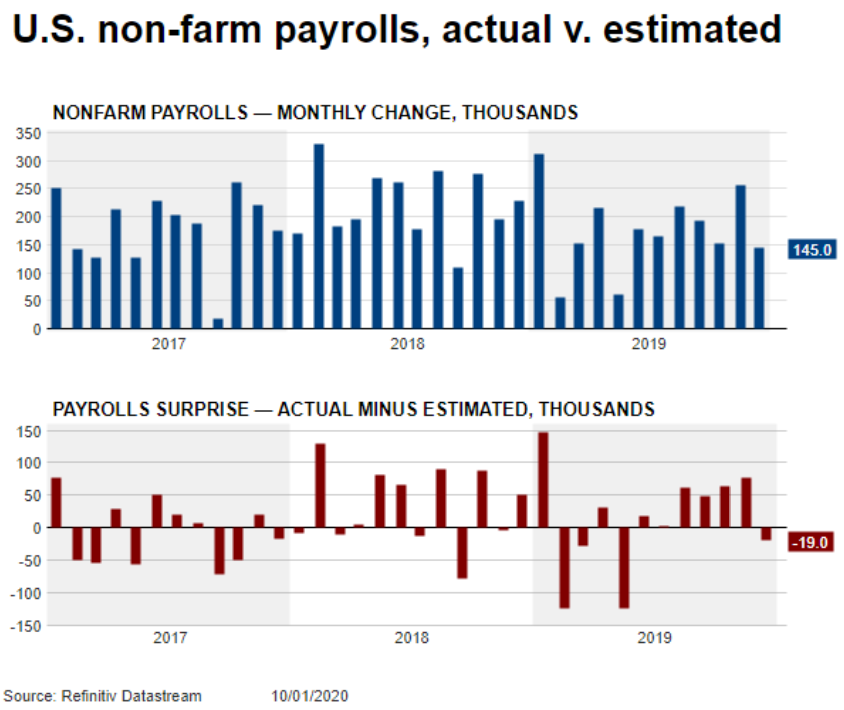



5e24f6f1fcbde0f6a18464b3
0.2
2020-03-07 16:03:14.657000
DIFFER: {'environment', 'fixed income', 'high yield'}
MODEL: {'bonds', 'private equity'}
TAGGER: {'environment', 'bonds', 'fixed income', 'high yield'}


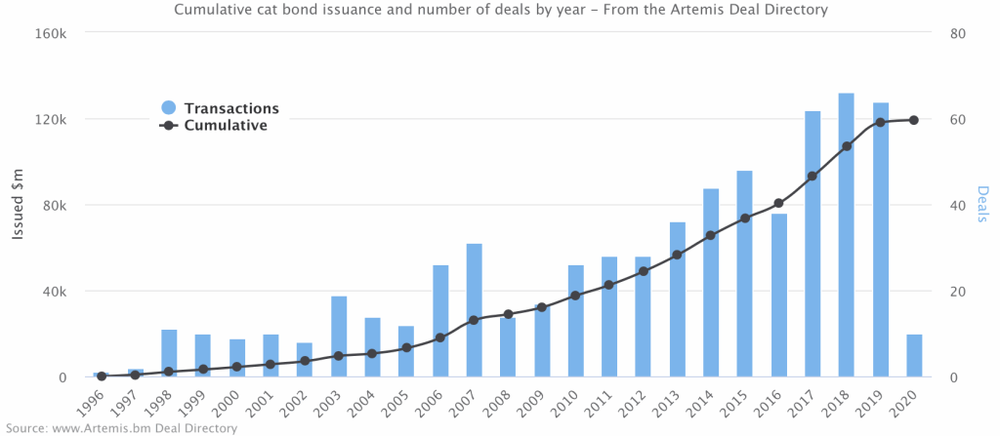



5e2345becfdca7fc47b8bcda
0.6666666666666666
2020-03-07 15:59:19.870000
DIFFER: set()
MODEL: {'nonfarm payrolls', 'labor', 'employment'}
TAGGER: {'nonfarm payrolls', 'labor'}


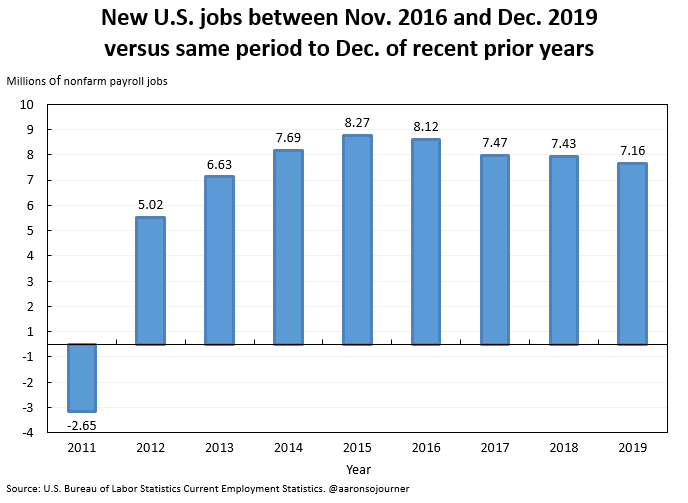



5e222d6106ba005a68c98619
0.5
2020-03-07 15:58:46.602000
DIFFER: {'currency'}
MODEL: {'tariffs'}
TAGGER: {'tariffs', 'currency'}


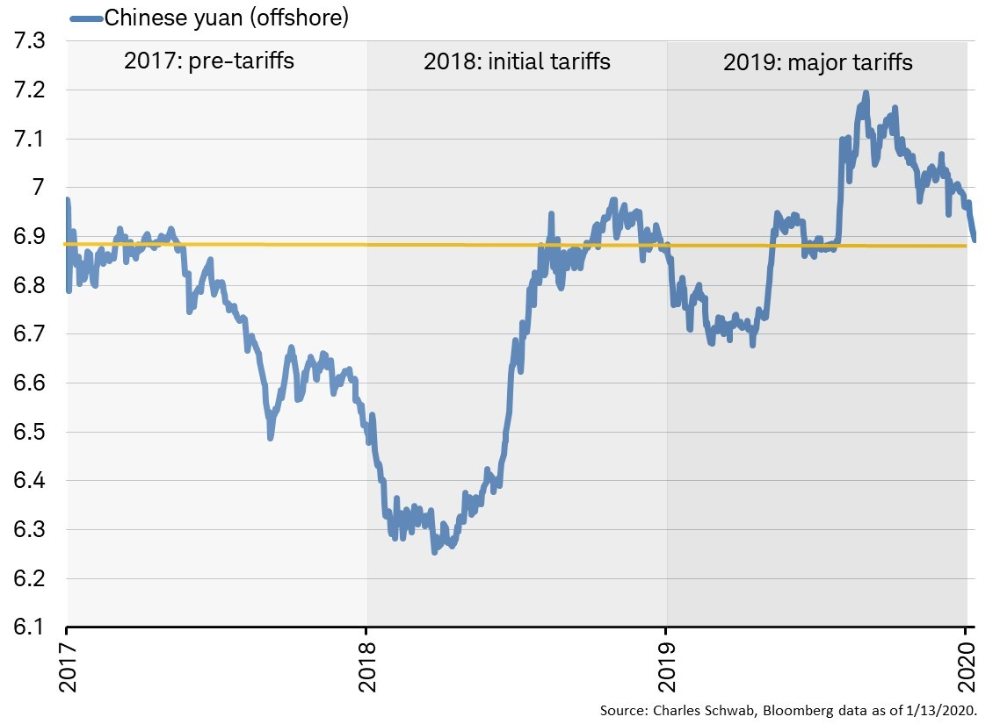



5e20c1c106577d5304a061e5
0.6
2020-03-07 15:39:07.290000
DIFFER: {'trade war'}
MODEL: {'trade', 'global', 'imports', 'tariffs'}
TAGGER: {'trade', 'imports', 'trade war', 'tariffs'}


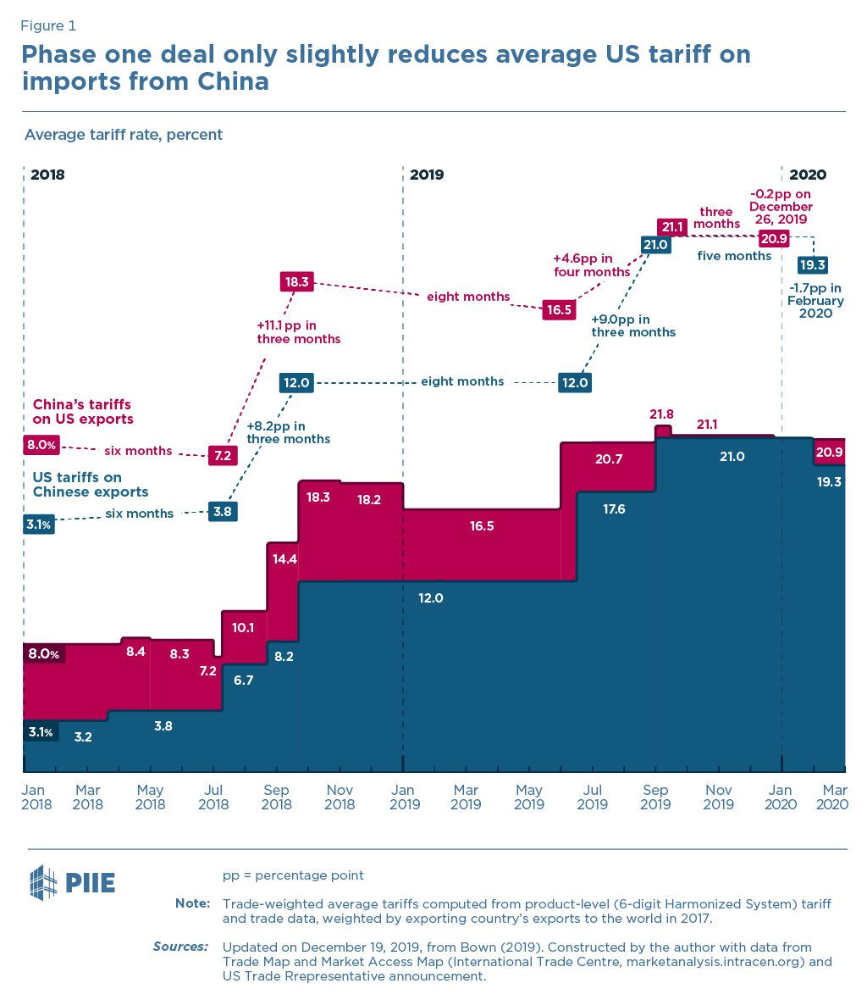



5e241036a6ffd1433a2b117f
0.5714285714285714
2020-03-07 15:38:00.488000
DIFFER: {'marketing', 'data', 'fashion'}
MODEL: {'consumer staples', 'leisure', 'consumer discretionary', 'electronics', 'travel', 'retail', 'financials', 'health', 'apparel', 'consumer products', 'consumer'}
TAGGER: {'leisure', 'consumer discretionary', 'data', 'electronics', 'fashion', 'retail', 'travel', 'financials', 'marketing', 'apparel', 'consumer products'}


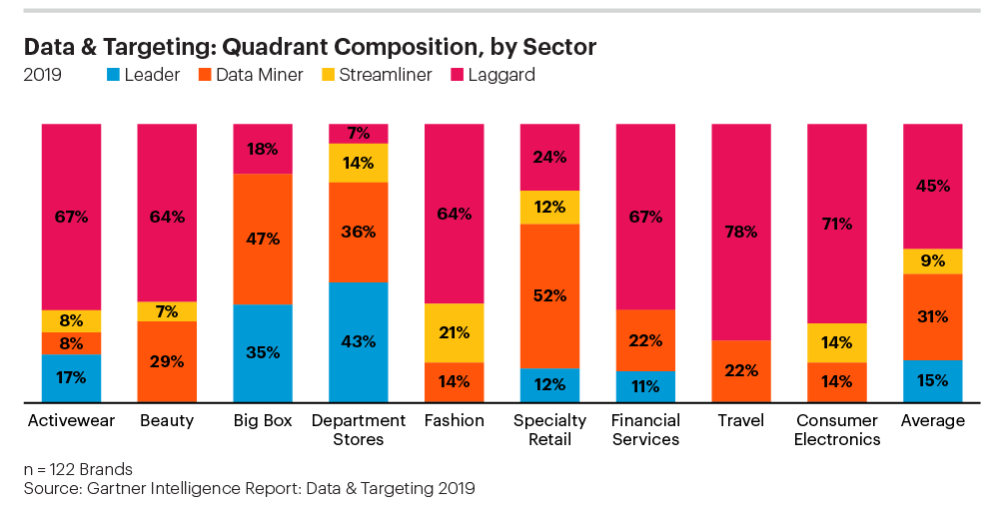



5e21e3a7658475c3fc0c23a1
0.3333333333333333
2020-03-07 15:29:58.458000
DIFFER: {'transportation', 'recession'}
MODEL: {'logistics'}
TAGGER: {'logistics', 'recession', 'transportation'}


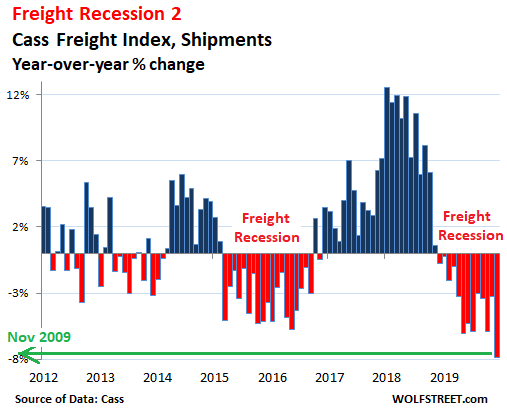



5e60a1149bd849d55a564bd4
0.6666666666666666
2020-03-07 15:29:24.078000
DIFFER: {'technology'}
MODEL: {'bubble', 'ipo'}
TAGGER: {'technology', 'bubble', 'ipo'}


5e252e53ec5feeab58214fcc
0.7142857142857143
2020-03-07 15:28:42.383000
DIFFER: set()
MODEL: {'equality', 'developed markets', 'social justice', 'wealth', 'personal finance', 'global', 'social'}
TAGGER: {'equality', 'wealth', 'social justice', 'personal finance', 'social'}


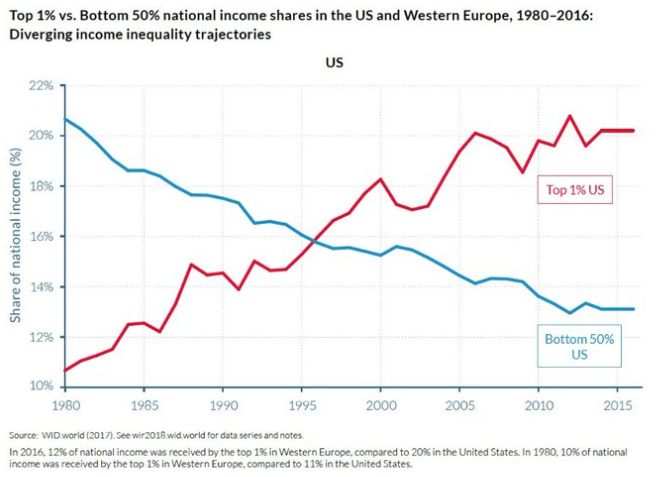



5e2509899cf0ddf338a13675
0.6
2020-03-07 15:05:38.270000
DIFFER: {'macro', 'tariffs'}
MODEL: {'trade', 'trade war', 'gdp'}
TAGGER: {'trade war', 'macro', 'gdp', 'trade', 'tariffs'}


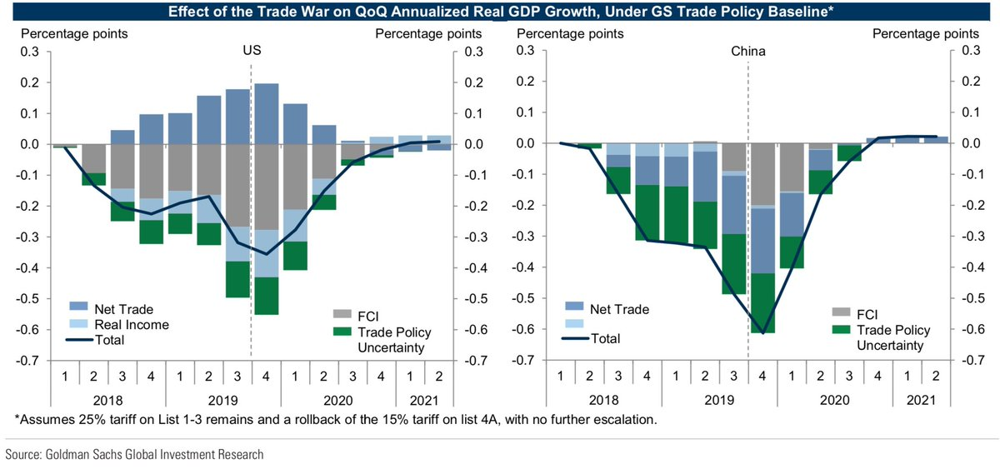



5e600f5f0baa874c0293ab82
0.8
2020-03-07 14:37:15.425000
DIFFER: set()
MODEL: {'technology', 'venture', 'financials', 'fintech', 'global'}
TAGGER: {'financials', 'fintech', 'technology', 'global'}


5e61a998dc7f9ee18f64550b
0.5714285714285714
2020-03-07 14:33:40.177000
DIFFER: {'pension funds', 'hedge funds', 'government'}
MODEL: {'etf', 'funds', 'foreign investment', 'household'}
TAGGER: {'pension funds', 'hedge funds', 'government', 'funds', 'etf', 'household', 'foreign investment'}


5e6002c191c696f3e7a86897
0.6428571428571429
2020-03-07 14:30:28.501000
DIFFER: {'electricity', 'waste', 'biofuel', 'fuel'}
MODEL: {'geothermal', 'hydro', 'nuclear power', 'solar energy', 'biomass', 'energy', 'consumer', 'renewables', 'commodities', 'wind power'}
TAGGER: {'biofuel', 'fuel', 'geothermal', 'hydro', 'nuclear power', 'solar energy', 'electricity', 'biomass', 'energy', 'waste', 'renewables', 'commodities', 'wind power'}


5e5fdb570ad1a599b5302c92
0.5
2020-03-07 14:28:29.402000
DIFFER: {'loan

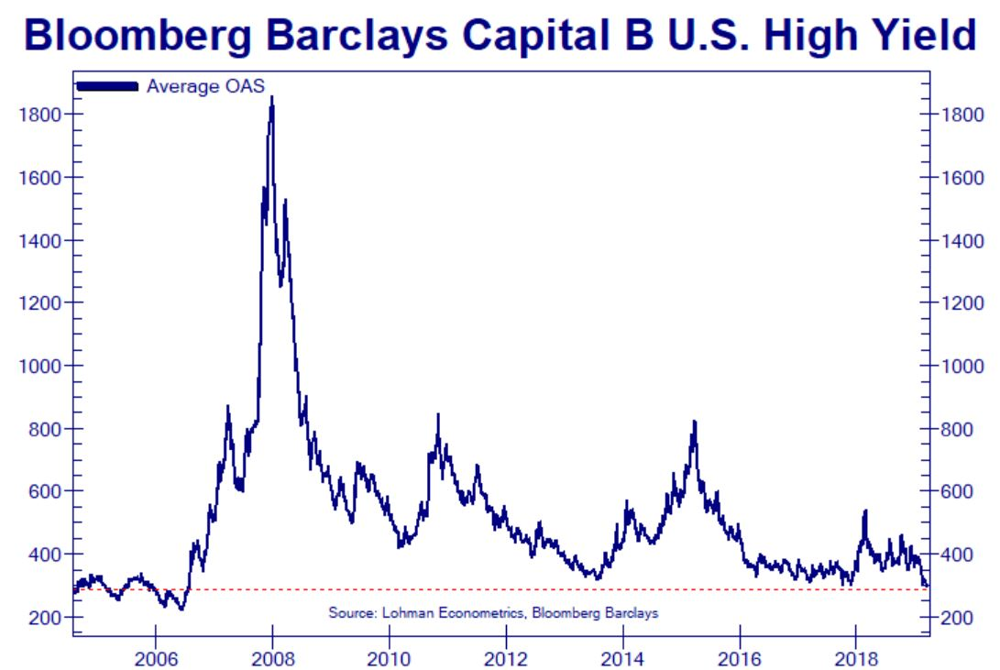



5e60aafa0f633bfccfe4f5cb
0.5333333333333333
2020-03-06 15:38:38.965000
DIFFER: {'solar energy', 'information technology', 'consumer products', 'geopolitics', 'pharmaceutical industry'}
MODEL: {'mining', 'trade war', 'automotive', 'retail', 'trade', 'transportation', 'metals', 'export', 'commodities', 'tariffs'}
TAGGER: {'mining', 'geopolitics', 'automotive', 'trade war', 'solar energy', 'information technology', 'trade', 'metals', 'export', 'consumer products', 'pharmaceutical industry', 'commodities', 'tariffs'}


5e233a34d83a3e8f0a272c23
0.5
2020-03-06 15:27:34.248000
DIFFER: {'personal finance'}
MODEL: {'savings'}
TAGGER: {'savings', 'personal finance'}


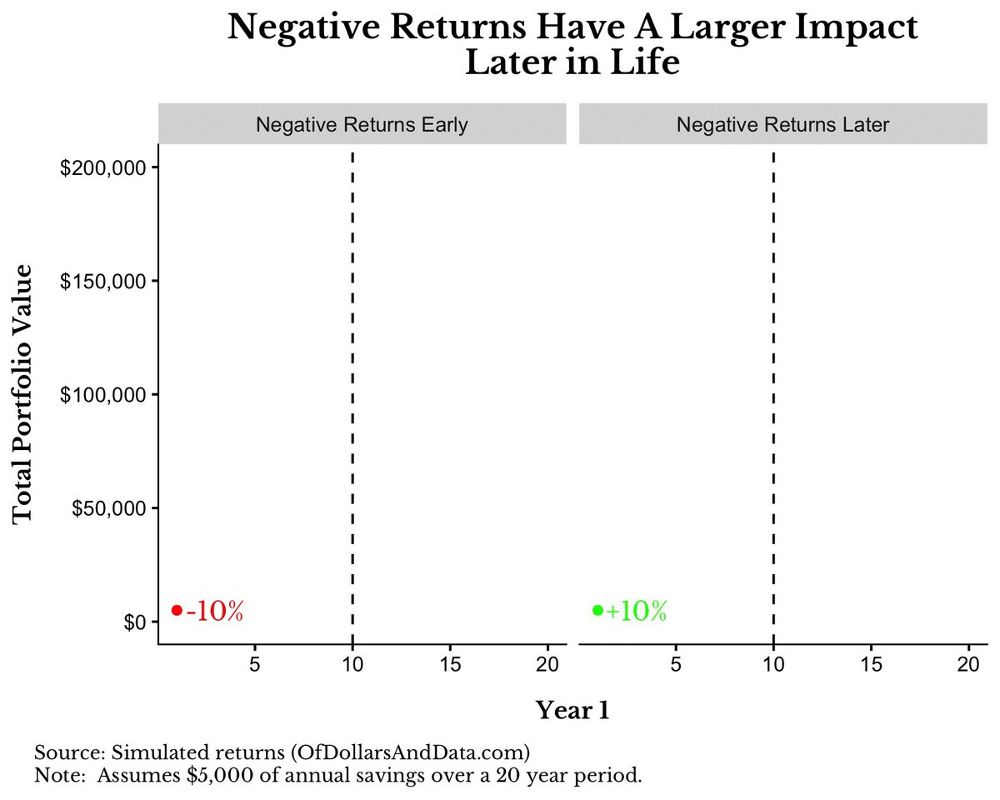



5e2505c18c0a621186490c4e
0.5
2020-03-06 15:27:05.326000
DIFFER: {'energy'}
MODEL: {'commodities'}
TAGGER: {'energy', 'commodities'}


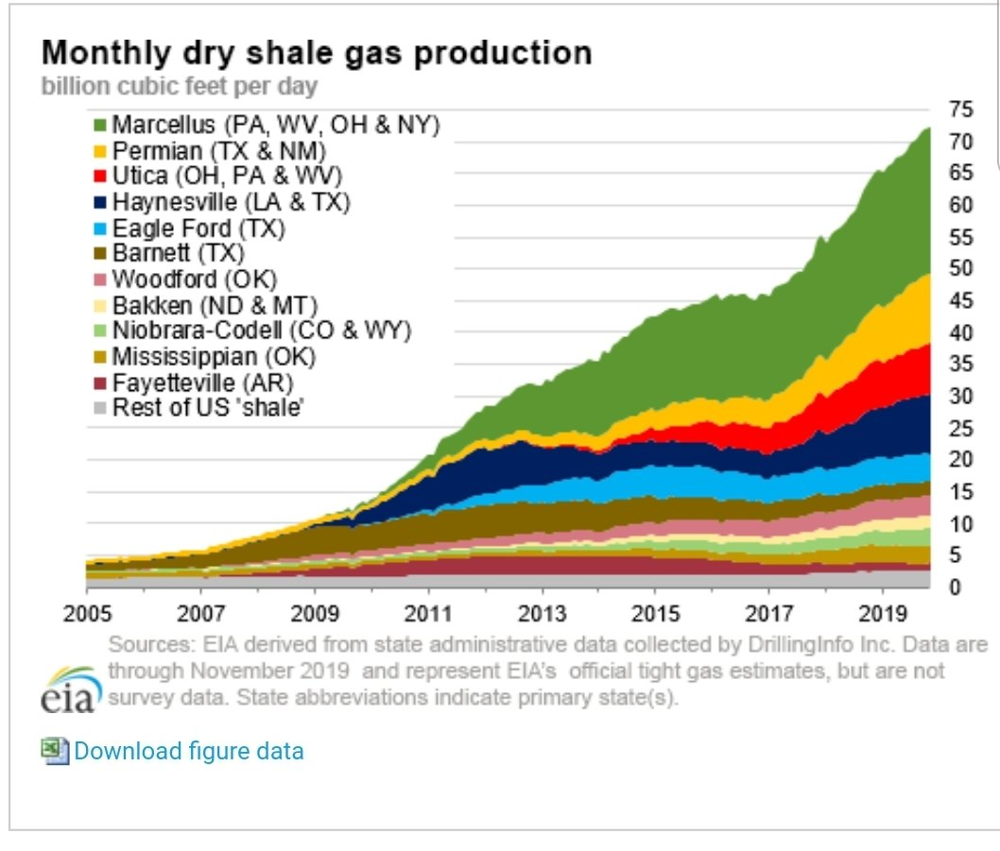



5e2583939d71396980a20684
0.2
2020-03-06 15:25:14.603000
DIFFER: {'crimes', 'social justice'}
MODEL: {'drugs', 'death', 'health'}
TAGGER: {'drugs', 'crimes', 'social justice'}


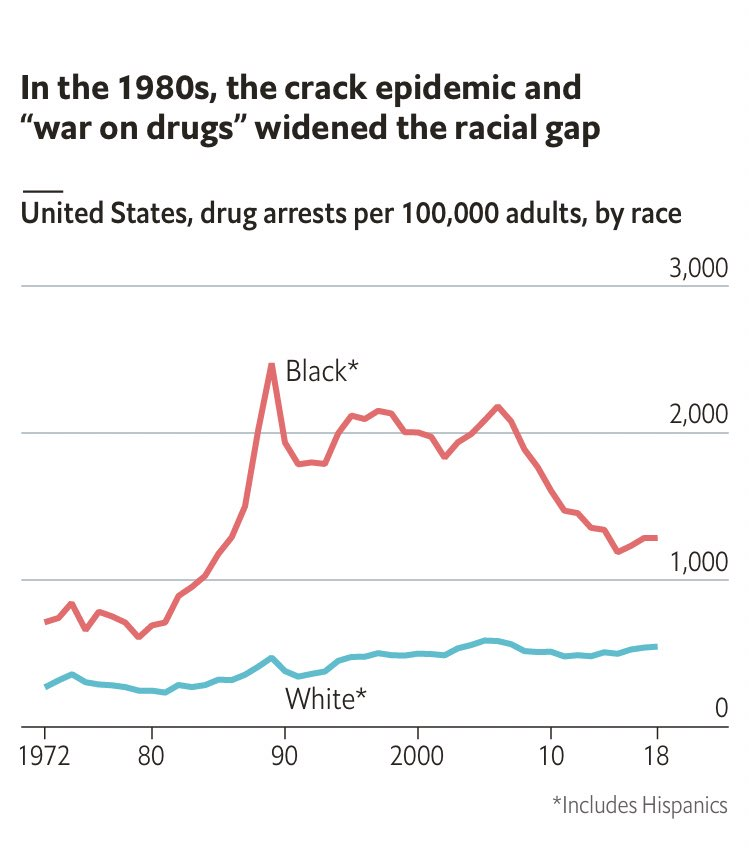



5e2e9d7c68da78083bf0709b
0.16666666666666666
2020-03-06 15:12:59.547000
DIFFER: {'technology', 'small caps', 'large caps', 'mid caps', 'funds'}
MODEL: {'futures'}
TAGGER: {'technology', 'futures', 'small caps', 'large caps', 'mid caps', 'funds'}


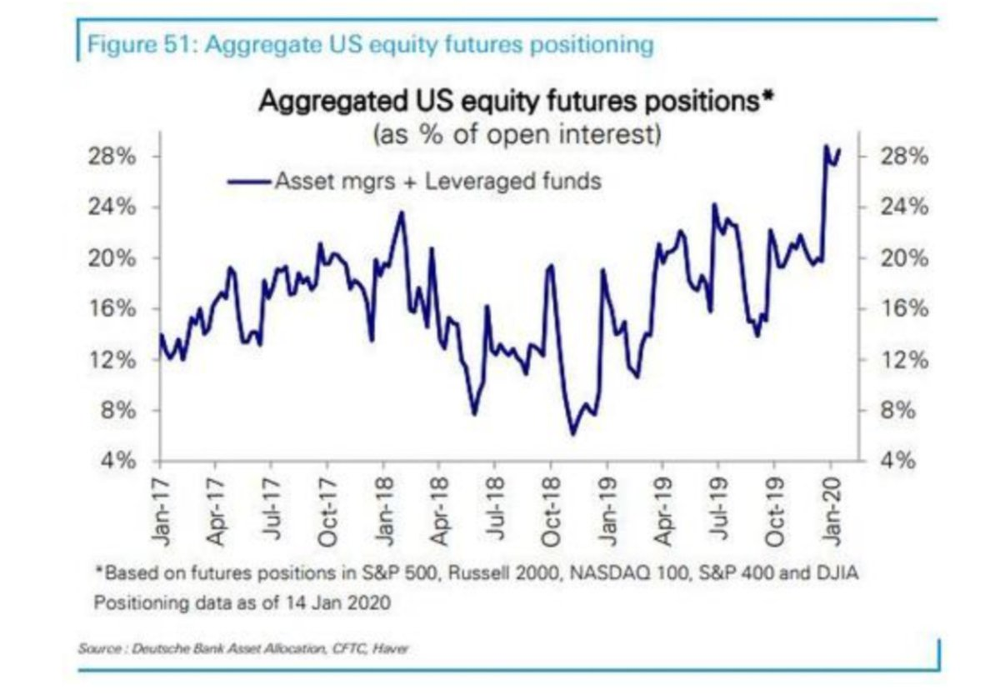



5e2b09b5ab08f7821ab42db6
0.4
2020-03-06 15:06:36.409000
DIFFER: {'trade'}
MODEL: {'macro', 'debt', 'developed markets', 'deficit'}
TAGGER: {'macro', 'deficit', 'trade'}


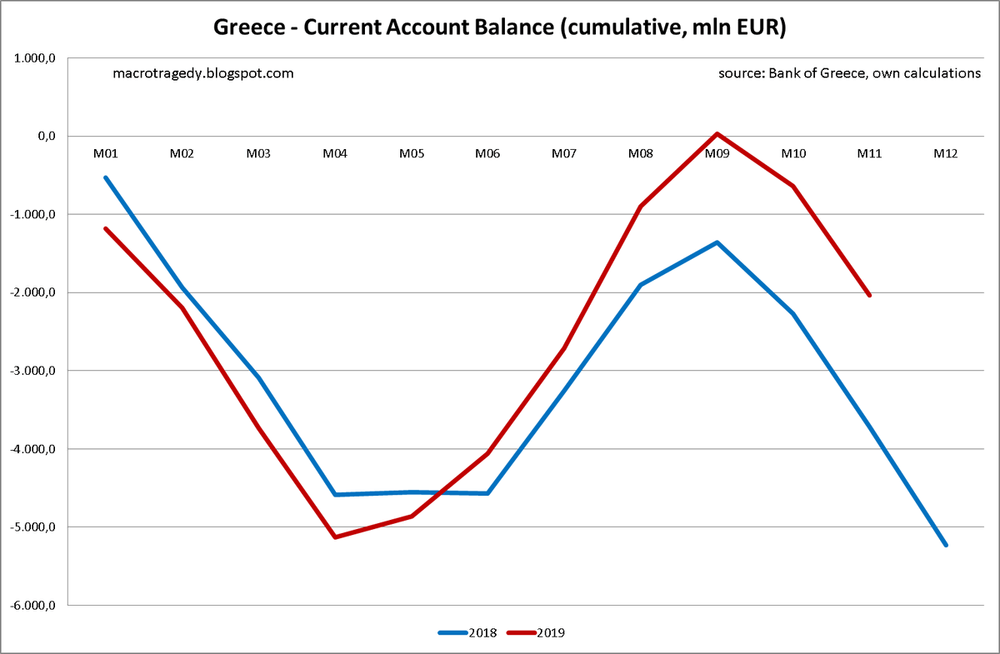



5e2900c77aac96bdd8f49d6c
0.5
2020-03-06 15:05:40.755000
DIFFER: {'electric vehicles', 'energy', 'automotive', 'fuel'}
MODEL: {'mining', 'batteries', 'commodities', 'metals'}
TAGGER: {'mining', 'automotive', 'fuel', 'electric vehicles', 'metals', 'energy', 'batteries', 'commodities'}


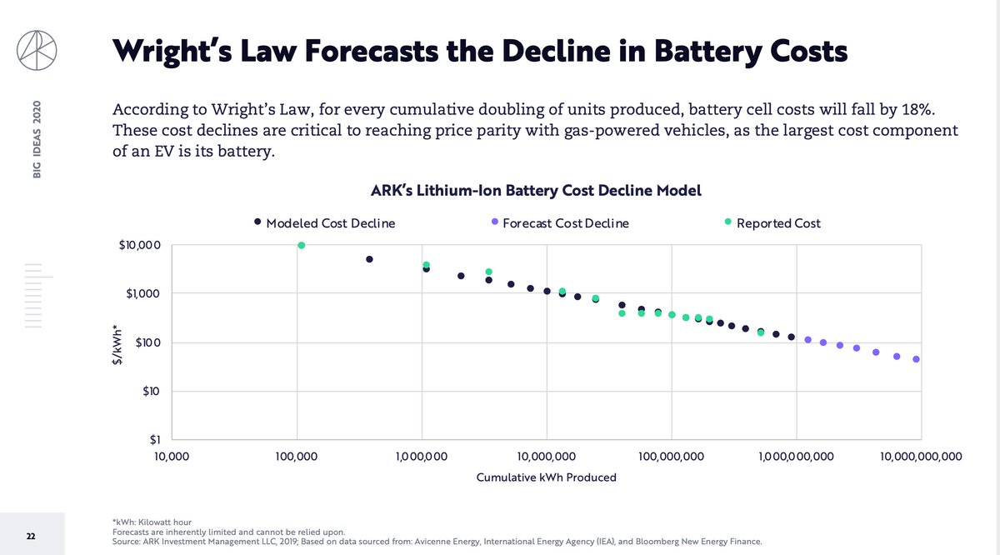



5e2e0a5e96998d025b4b4afb
0.3333333333333333
2020-03-06 14:48:43.800000
DIFFER: {'sentiment', 'politics'}
MODEL: {'volatility'}
TAGGER: {'sentiment', 'politics', 'volatility'}


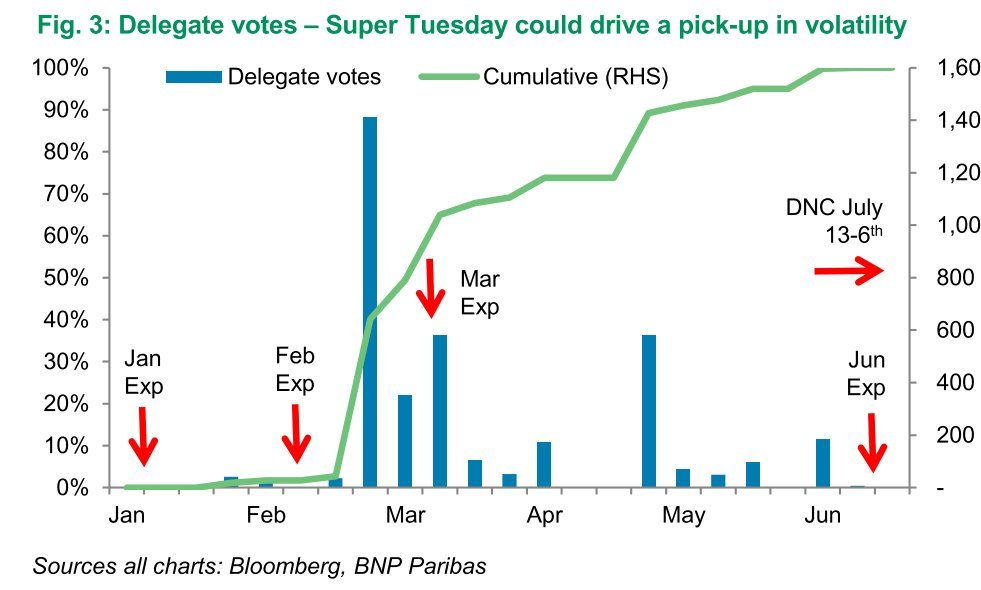



5e2e39fba94041111289316f
0.75
2020-03-06 14:42:14.649000
DIFFER: set()
MODEL: {'demography', 'social justice', 'population', 'social'}
TAGGER: {'demography', 'population', 'social'}


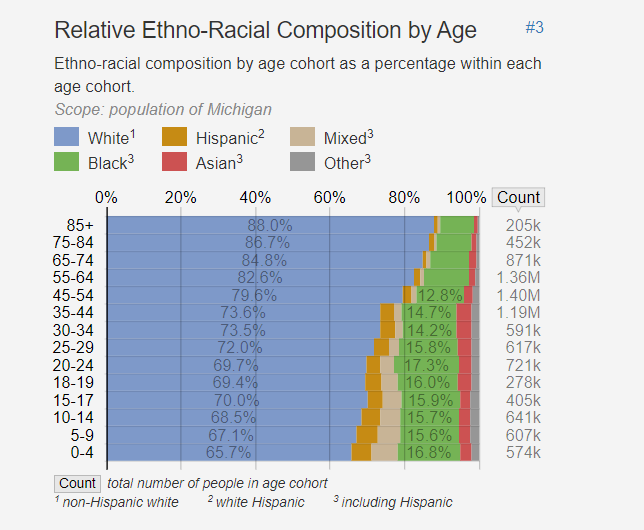



5e2f61bef9e82170e5c00d37
0.75
2020-03-06 14:25:32.157000
DIFFER: {'waste', 'biofuel'}
MODEL: {'fuel', 'hydro', 'nuclear power', 'solar energy', 'biomass', 'energy', 'renewables', 'commodities', 'global', 'wind power'}
TAGGER: {'biofuel', 'fuel', 'hydro', 'nuclear power', 'solar energy', 'energy', 'waste', 'renewables', 'commodities', 'global', 'wind power'}


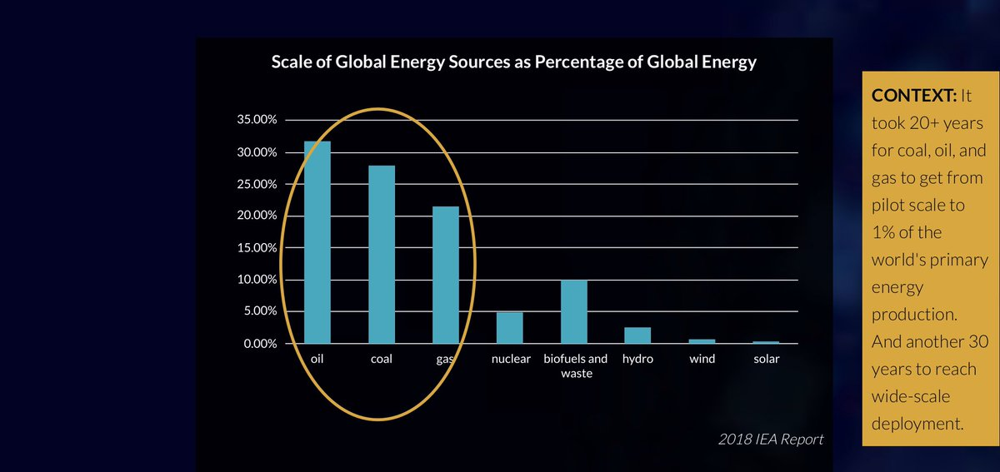



5e4157bc2ee5dee139a39933
0.7777777777777778
2020-03-06 14:23:07.765000
DIFFER: {'digital media', 'wireless'}
MODEL: {'tv', 'media', 'radio', 'digital', 'marketing', 'advertising', 'internet'}
TAGGER: {'tv', 'wireless', 'media', 'radio', 'digital', 'digital media', 'marketing', 'advertising', 'internet'}


5e60532fbee7d8cdaffc80df
0.6
2020-03-06 14:17:31.511000
DIFFER: {'media', 'football'}
MODEL: {'sports', 'education', 'labor'}
TAGGER: {'media', 'sports', 'education', 'labor', 'football'}


5e5fc5f8e09c464be3c0d62f
0.75
2020-03-06 13:59:46.493000
DIFFER: {'sentiment'}
MODEL: {'sustainability', 'funds', 'esg'}
TAGGER: {'sentiment', 'sustainability', 'funds', 'esg'}


5e603819422ebc190f19ccb8
0.6
2020-03-06 13:58:39.439000
DIFFER: {'subscriptions', 'cloud'}
MODEL: {'advertising', 'internet', 'e-commerce'}
TAGGER: {'cloud', 'subscriptions', 'advertising', 'internet', 'e-commerce'}


5e5fac163f25bfbd19283415
0.5
2020-03-06 13:56:53.643000
DIFFER: {'medicine'}
MODEL: {'drugs', 'labor', '

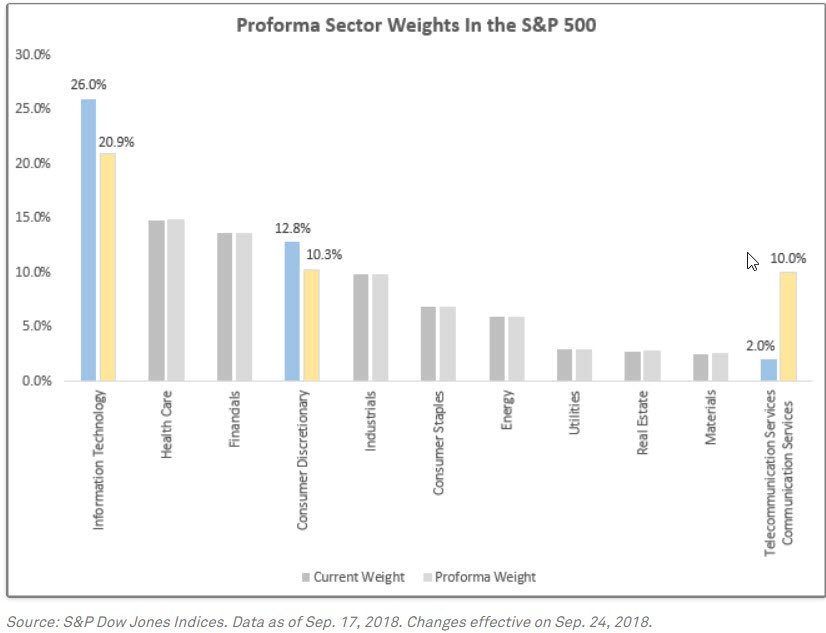



5dfc6aad31f3fbd32886d736
0.6666666666666666
2020-03-04 15:01:03.362000
DIFFER: {'trade'}
MODEL: {'tariffs', 'emerging markets'}
TAGGER: {'trade', 'tariffs', 'emerging markets'}


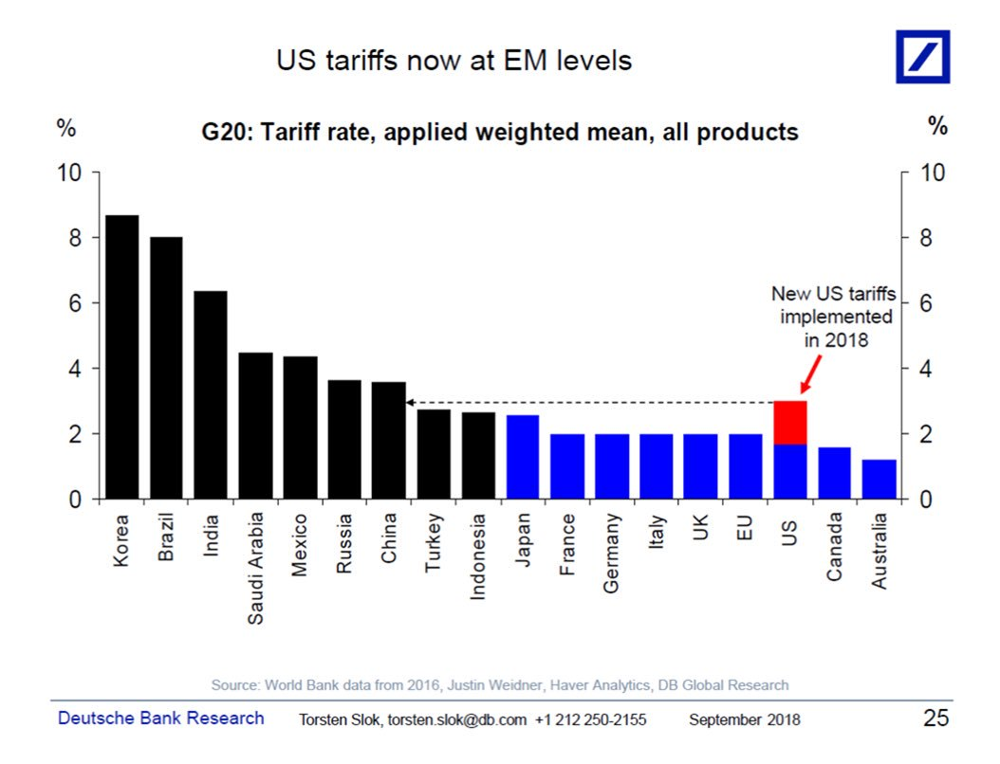



5ddaadc7b3580e6d5d3e08e5
0.5333333333333333
2020-03-04 14:56:37.139000
DIFFER: {'mining', 'metals', 'cash', 'commodities', 'emerging markets'}
MODEL: {'developed markets', 'hedge funds', 'real estate', 'wealth', 'bonds', 'fixed income', 'metals & mining', 'private equity', 'agriculture', 'social'}
TAGGER: {'mining', 'developed markets', 'hedge funds', 'real estate', 'wealth', 'bonds', 'fixed income', 'private equity', 'metals', 'agriculture', 'cash', 'commodities', 'emerging markets'}


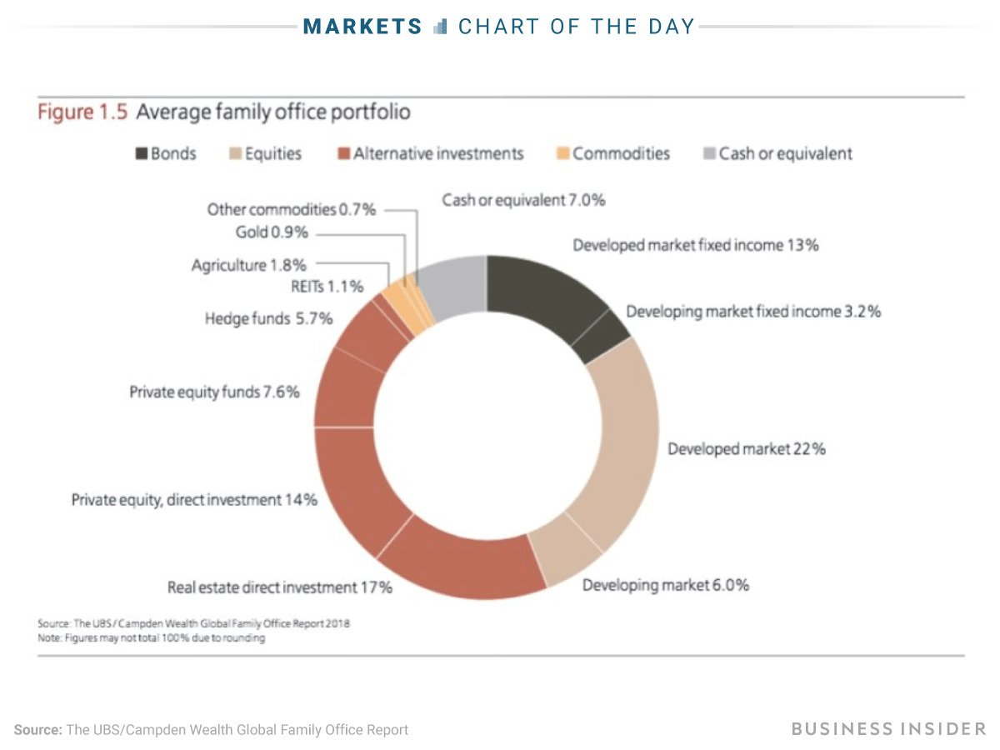



5dfc02bf9f007b135dc2a6f8
0.4
2020-03-04 14:44:49.336000
DIFFER: set()
MODEL: {'technology', 'innovation', 'information technology', 'science', 'intellectual property'}
TAGGER: {'technology', 'intellectual property'}


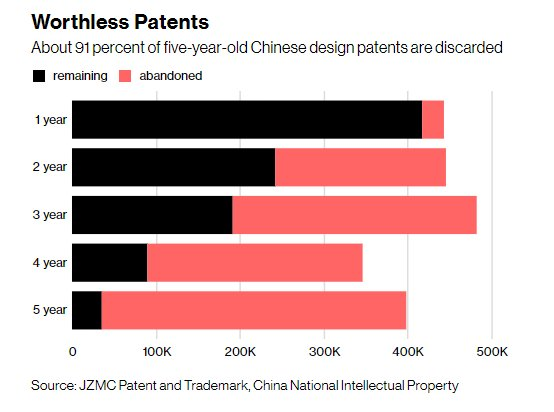



5de4fc4fd933506025e552f6
0.6666666666666666
2020-03-04 14:41:26.664000
DIFFER: {'imports'}
MODEL: {'trade', 'tariffs'}
TAGGER: {'trade', 'imports', 'tariffs'}


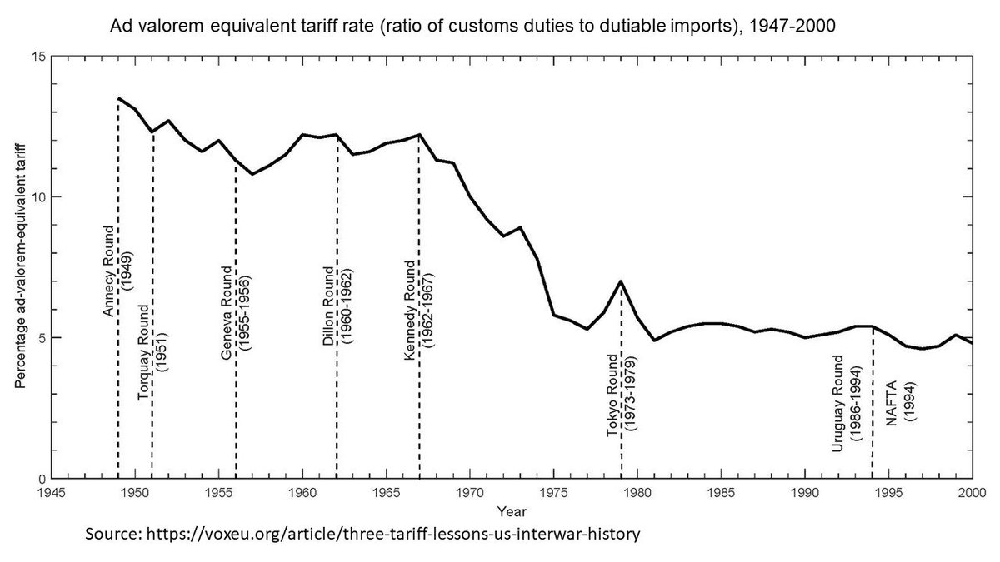



5deff2622f0683e9162f727c
0.0
2020-03-04 14:37:24.472000
DIFFER: {'debt'}
MODEL: {'small caps', 'large caps'}
TAGGER: {'debt'}


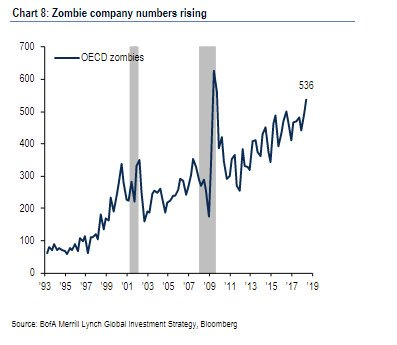



5dda9c4097a2dbd5c9889cb6
0.6666666666666666
2020-03-04 08:43:26.577000
DIFFER: {'fixed income'}
MODEL: {'bonds', 'high yield'}
TAGGER: {'bonds', 'fixed income', 'high yield'}


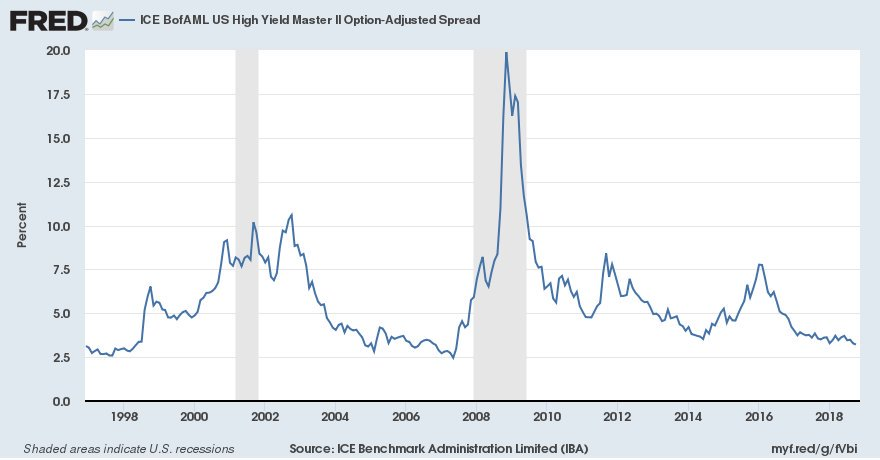



5dfc2e5151e9d21cd70efbf1
0.0
2020-03-04 08:35:30.411000
DIFFER: set()
MODEL: {'trading', 'travel'}
TAGGER: set()


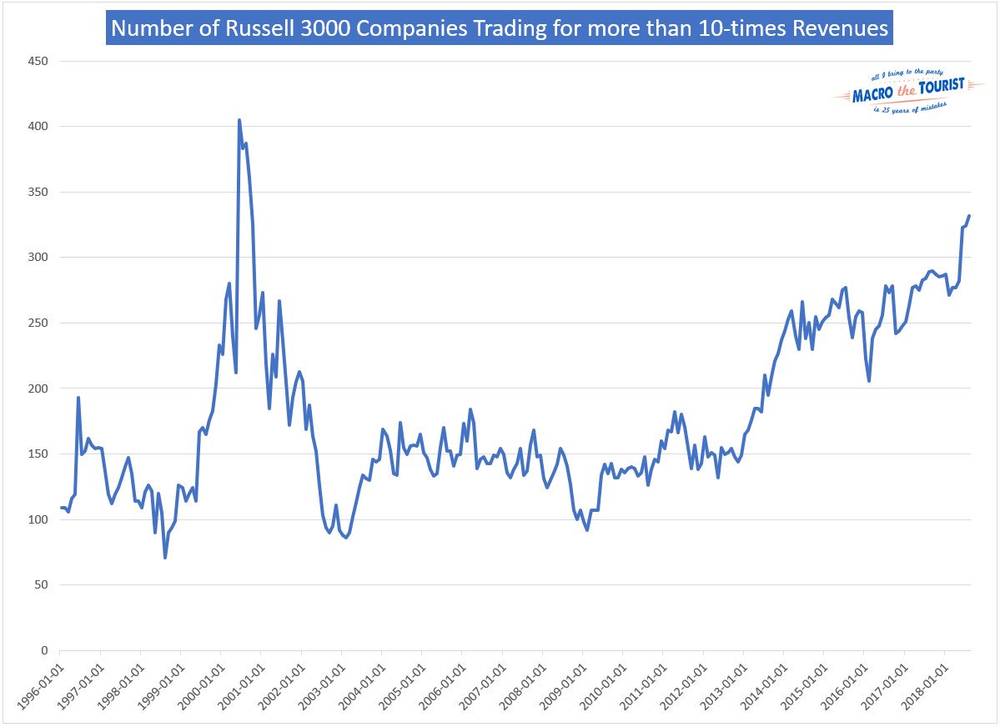



5dfb9270db2ba2d27aa21d3e
0.14285714285714285
2020-03-03 19:21:16.518000
DIFFER: {'mining', 'electric vehicles', 'metals', 'energy', 'commodities'}
MODEL: {'metals & mining', 'batteries'}
TAGGER: {'mining', 'electric vehicles', 'metals', 'energy', 'batteries', 'commodities'}


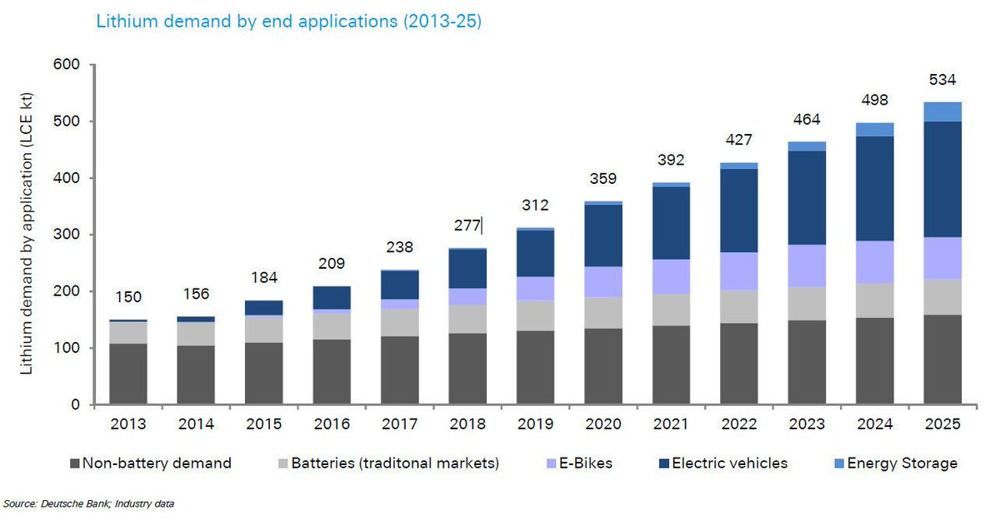



5de63165635cbf4bc8d6bd65
0.5
2020-03-03 19:04:45.744000
DIFFER: {'large caps'}
MODEL: {'volatility'}
TAGGER: {'volatility', 'large caps'}


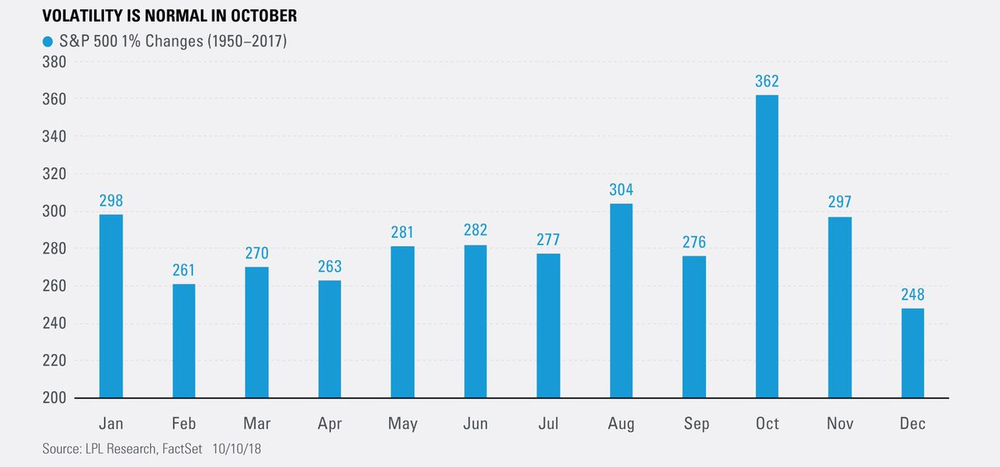



5e05ad658ce9f05a46ff7ebc
0.3333333333333333
2020-03-03 18:58:19.123000
DIFFER: {'foreign investment', 'venture'}
MODEL: {'startups'}
TAGGER: {'startups', 'foreign investment', 'venture'}


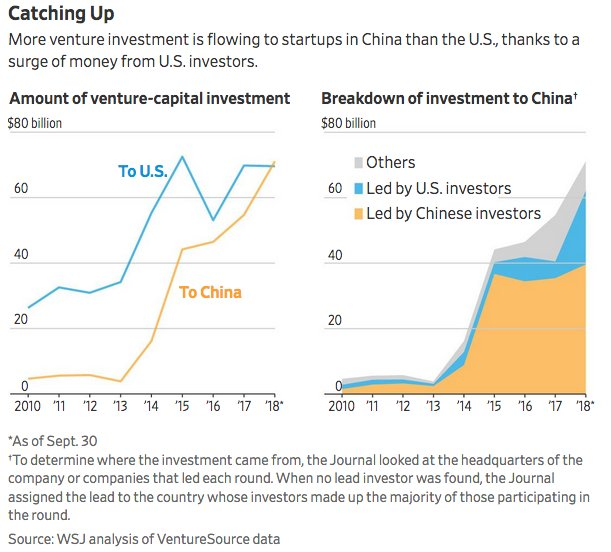



5dfb7f8220afaad67ff250d8
0.9166666666666666
2020-03-03 18:40:21.180000
DIFFER: {'bankruptcy'}
MODEL: {'consumer staples', 'technology', 'consumer discretionary', 'materials', 'financials', 'debt', 'industrials', 'utilities', 'health', 'energy', 'telecom'}
TAGGER: {'consumer staples', 'technology', 'consumer discretionary', 'bankruptcy', 'materials', 'debt', 'financials', 'industrials', 'utilities', 'health', 'energy', 'telecom'}


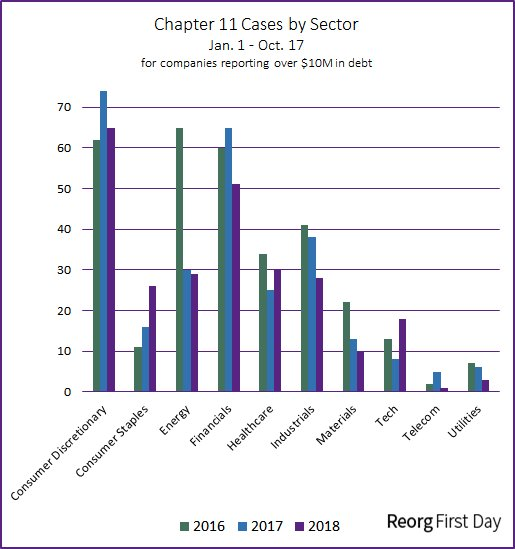



5dfb6ca7e75f75b47f5fee22
0.75
2020-03-03 18:36:39.373000
DIFFER: {'volatility'}
MODEL: {'sentiment', 'bear market', 'bull market'}
TAGGER: {'sentiment', 'bear market', 'volatility', 'bull market'}


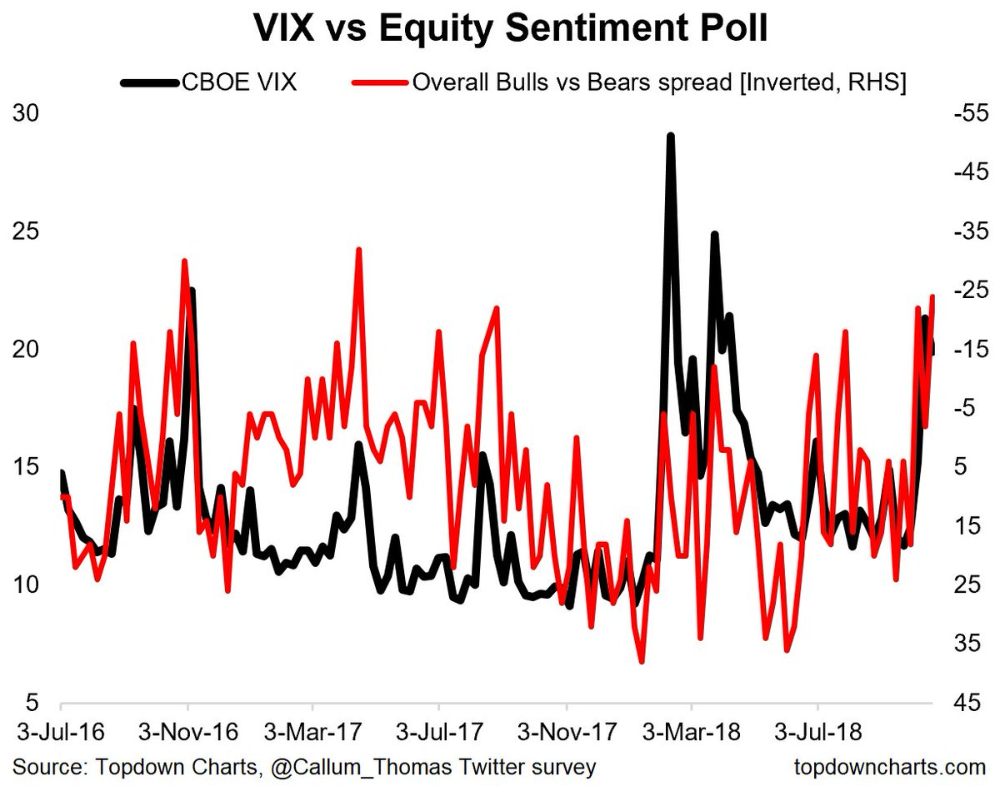



5dfc068d2c7ba0b8a0d42c96
0.6666666666666666
2020-03-03 18:30:02.644000
DIFFER: {'information technology'}
MODEL: {'labor', 'cyber security'}
TAGGER: {'information technology', 'labor', 'cyber security'}


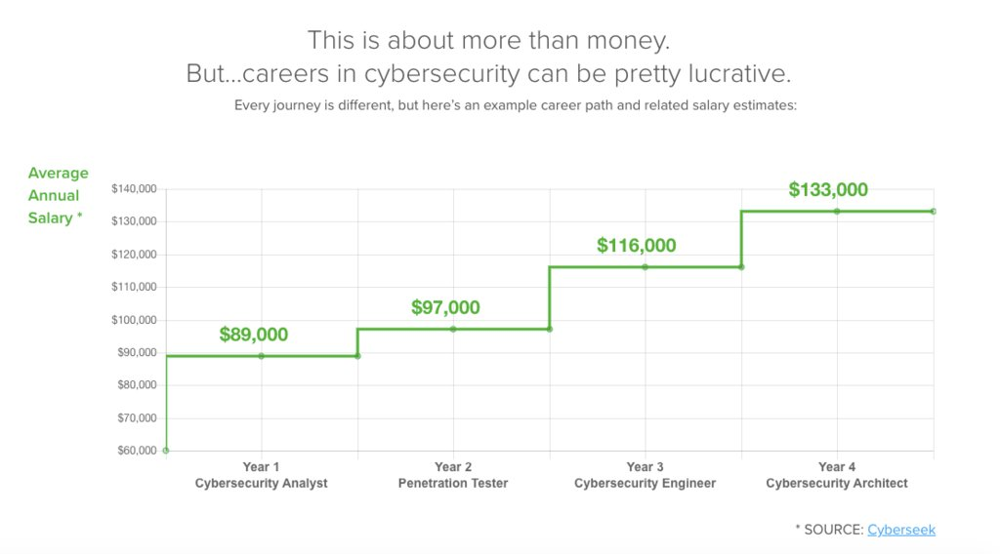



5ddc60228f433ec8481871a1
0.5
2020-03-03 18:15:39.346000
DIFFER: {'labor'}
MODEL: {'nonfarm payrolls'}
TAGGER: {'nonfarm payrolls', 'labor'}


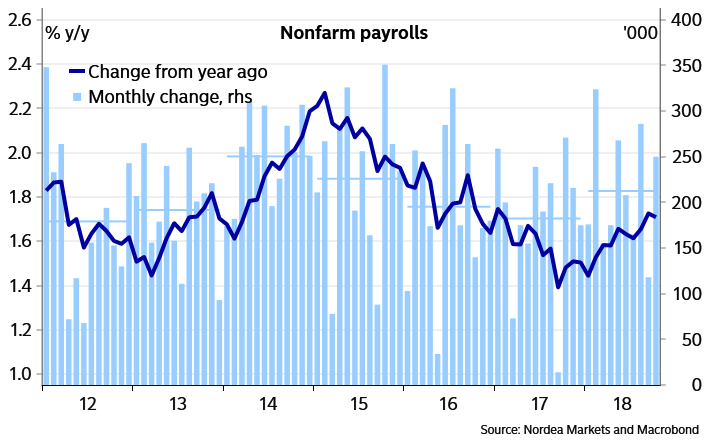



5dfc59616e02145be6275419
0.75
2020-03-03 18:14:55.495000
DIFFER: {'personal finance'}
MODEL: {'retirement', 'labor', 'employment'}
TAGGER: {'retirement', 'personal finance', 'labor', 'employment'}


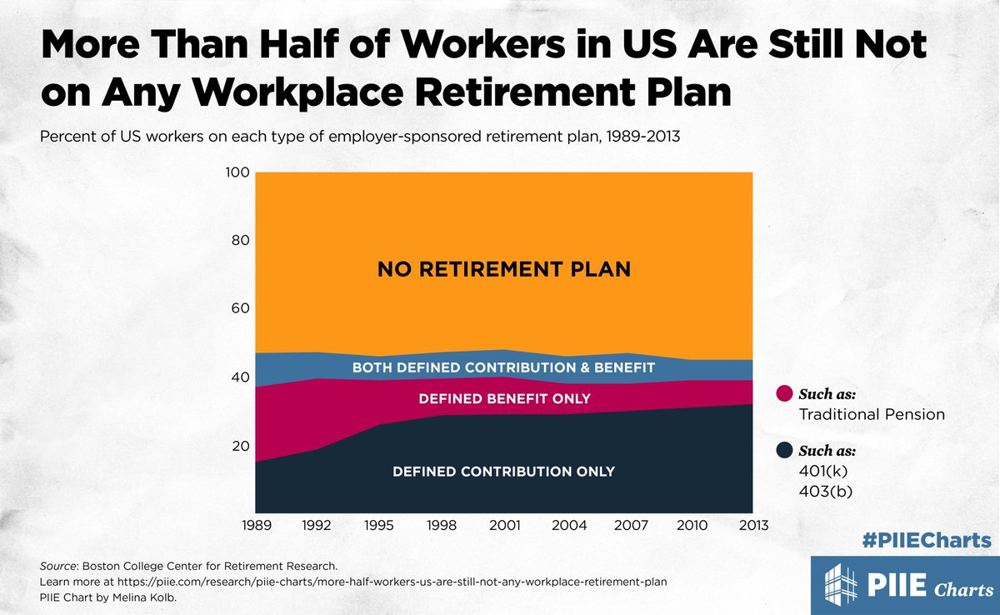



5defdb4446cd9570b6c7d7b5
0.0
2020-03-03 17:57:27.538000
DIFFER: set()
MODEL: {'small caps'}
TAGGER: set()


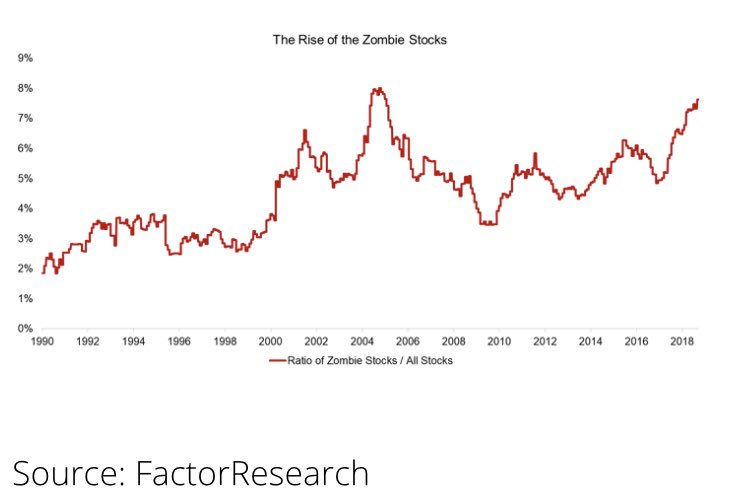



5e025aeaea78a89595085b3b
0.14285714285714285
2020-03-03 17:56:28.362000
DIFFER: {'automotive', 'electronics', 'large caps', 'trade', 'semiconductors'}
MODEL: {'retail', 'tariffs'}
TAGGER: {'automotive', 'electronics', 'semiconductors', 'large caps', 'trade', 'tariffs'}


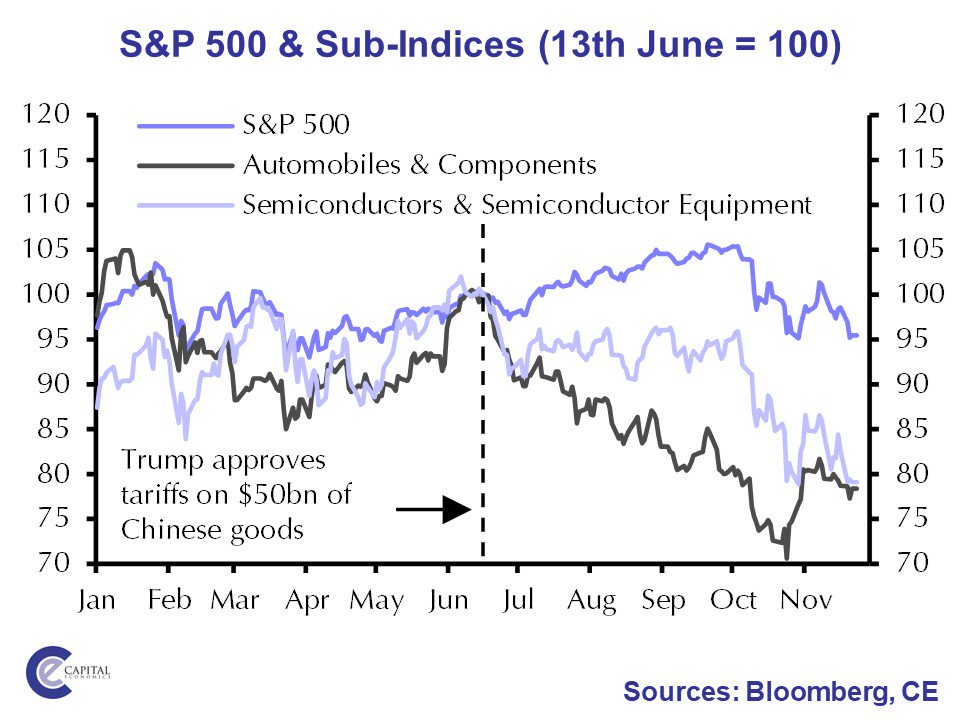



5ddba28aed18622ca1f2f8c7
0.3333333333333333
2020-03-03 17:40:19.348000
DIFFER: {'sentiment', 'large caps'}
MODEL: {'bull market'}
TAGGER: {'sentiment', 'large caps', 'bull market'}


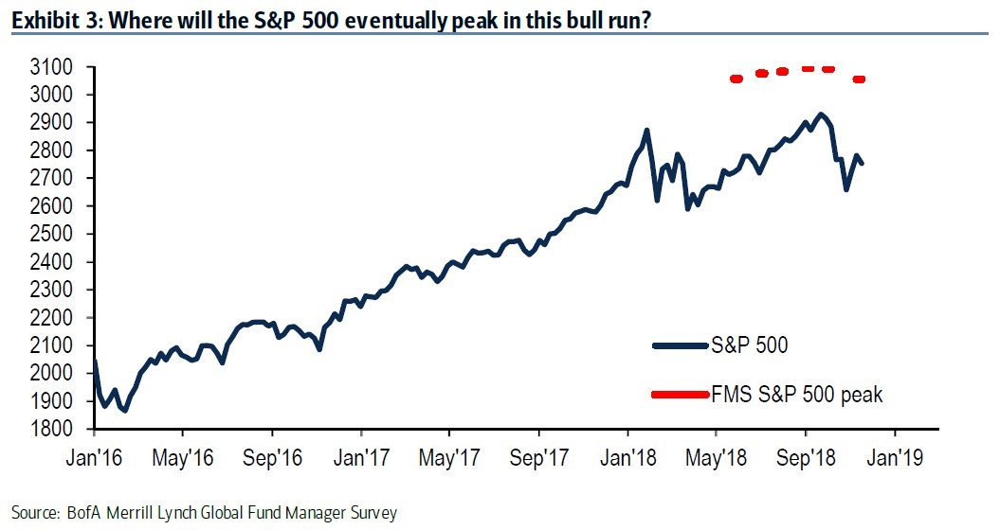



5e02ed56bdc0cfdae6511b38
0.3333333333333333
2020-03-03 17:39:26.225000
DIFFER: {'technology', 'credit', 'crowdfunding', 'banking'}
MODEL: {'financials', 'fintech'}
TAGGER: {'technology', 'crowdfunding', 'banking', 'financials', 'fintech', 'credit'}


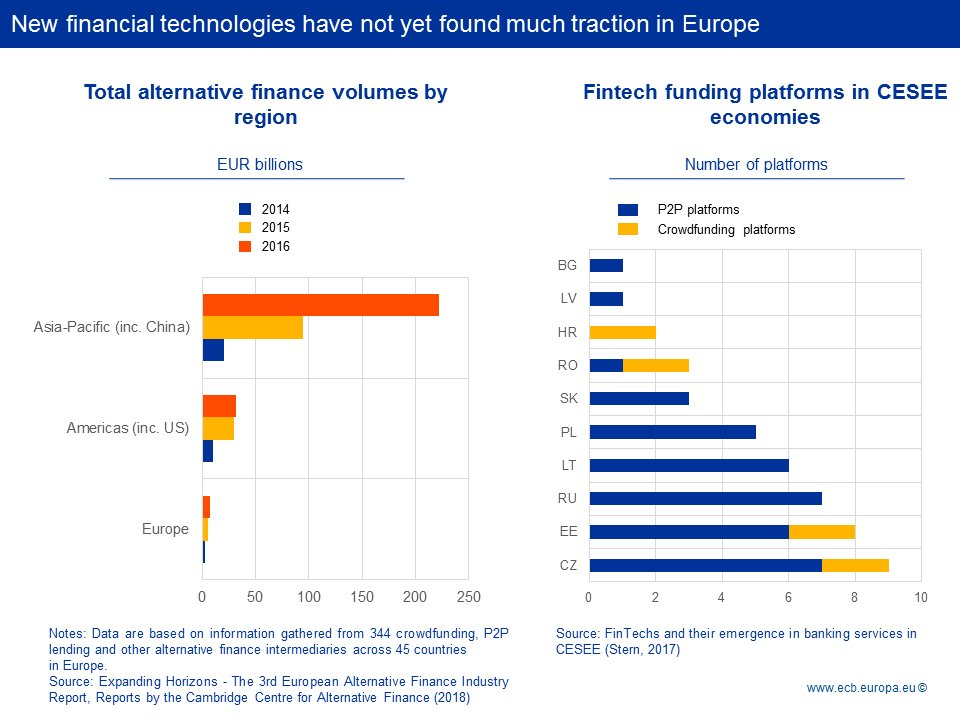



5dfc857441da3f509db99047
0.5
2020-03-03 17:31:45.776000
DIFFER: {'shopping', 'payments'}
MODEL: {'credit card', 'cashless'}
TAGGER: {'credit card', 'shopping', 'cashless', 'payments'}


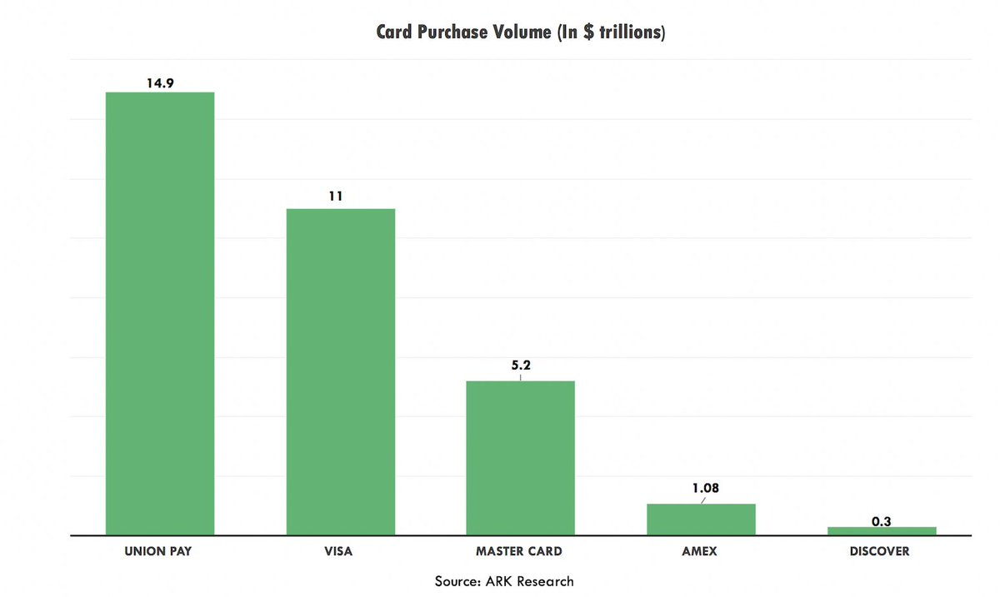



5e04e1479a8e70fa4b63627d
0.75
2020-03-03 16:36:32.095000
DIFFER: {'fixed income'}
MODEL: {'etf', 'bonds', 'high yield'}
TAGGER: {'etf', 'bonds', 'fixed income', 'high yield'}


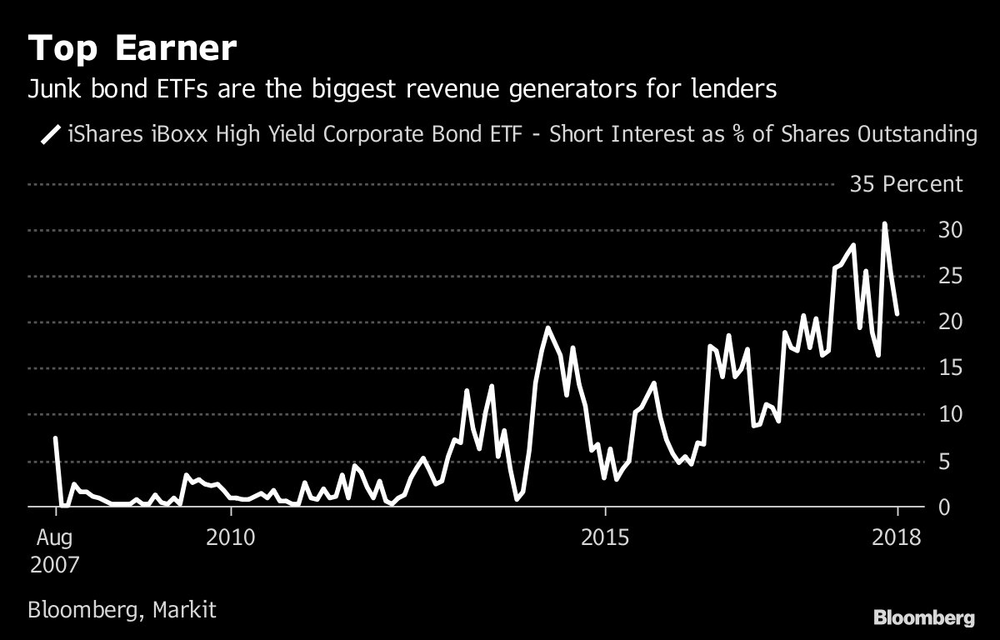



5e02ce2ca980f0d393261911
0.75
2020-03-03 16:14:09.914000
DIFFER: {'equality', 'gender'}
MODEL: {'labor', 'millennials', 'generation x', 'generations', 'boomers', 'social'}
TAGGER: {'equality', 'gender', 'labor', 'millennials', 'generation x', 'generations', 'boomers', 'social'}


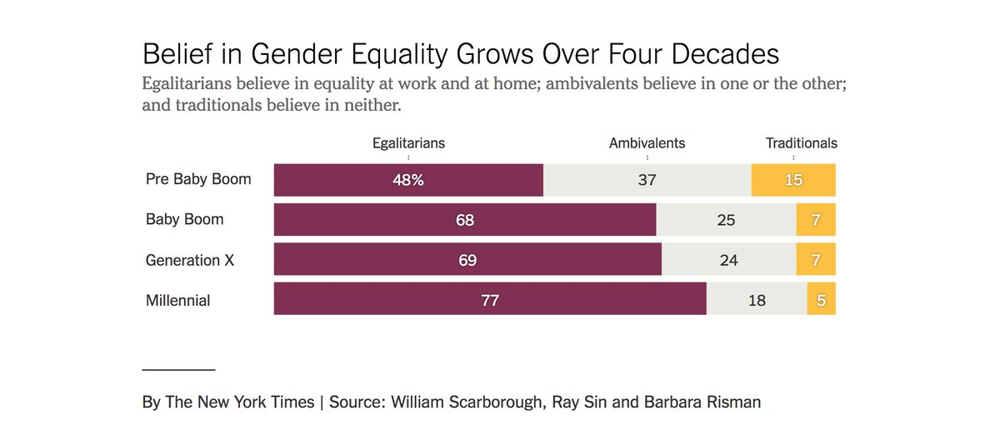



5dfbba5a513ea04cb5819166
0.6
2020-03-02 19:34:05.822000
DIFFER: {'financials', 'personal finance', 'generation x'}
MODEL: {'student loan', 'credit card', 'millennials', 'debt', 'generations', 'boomers', 'cashless'}
TAGGER: {'credit card', 'millennials', 'financials', 'debt', 'personal finance', 'generation x', 'generations', 'boomers', 'cashless'}


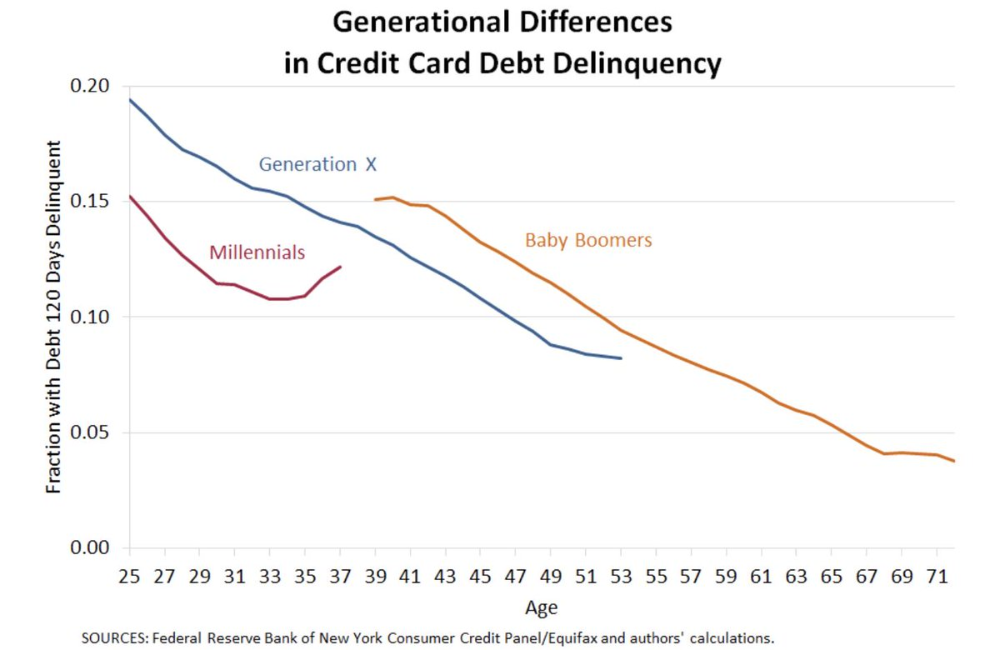



5dfb78cdbf2e0b3cf6aea4da
0.5833333333333334
2020-03-02 19:32:23.569000
DIFFER: {'trade', 'brexit', 'education', 'refugees'}
MODEL: {'migration', 'labor', 'employment', 'politics', 'health', 'environment', 'climate change', 'social'}
TAGGER: {'migration', 'education', 'labor', 'trade', 'brexit', 'politics', 'refugees', 'health', 'environment', 'climate change', 'social'}


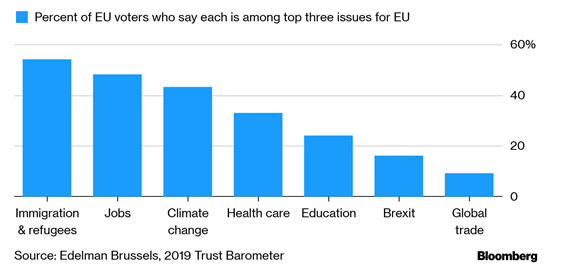



5df035197d0fd77eaaabc964
0.75
2020-03-02 19:18:49.893000
DIFFER: {'automotive'}
MODEL: {'trade', 'imports', 'tariffs'}
TAGGER: {'trade', 'imports', 'automotive', 'tariffs'}


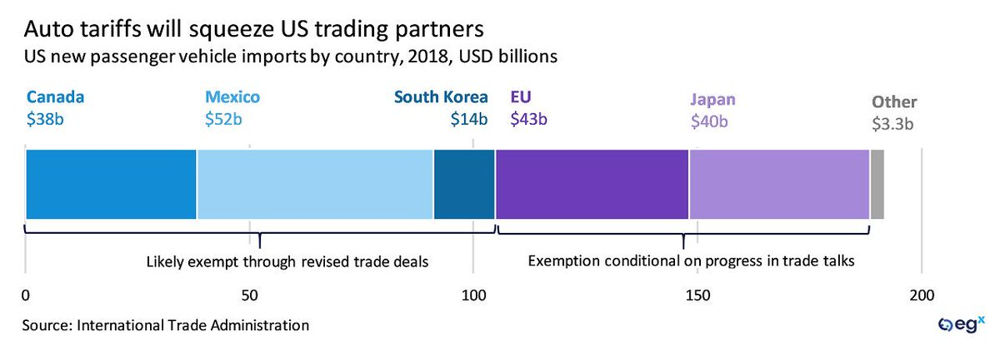



5e04e8130accfc635fa728af
0.5
2020-03-02 19:18:00.420000
DIFFER: {'fixed income', 'government bonds', 'sentiment'}
MODEL: {'bonds', 'politics', 'volatility'}
TAGGER: {'government bonds', 'bonds', 'fixed income', 'volatility', 'politics', 'sentiment'}


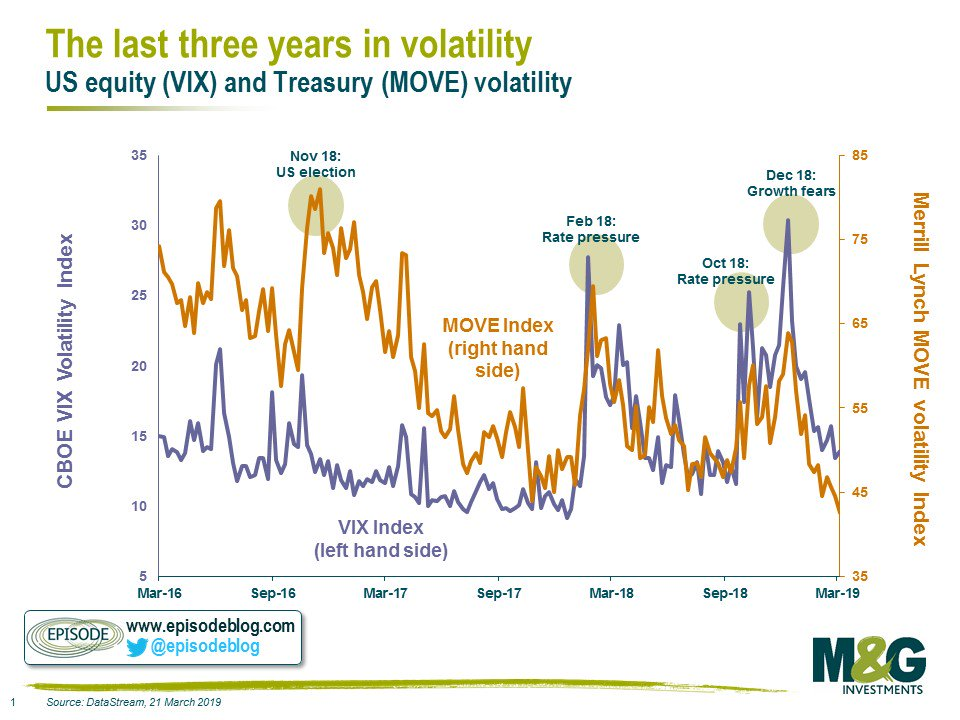



5dfc509531f3fbd32886d217
0.3333333333333333
2020-03-02 18:46:40.250000
DIFFER: {'wireless', 'radio', 'esports', 'digital', 'media', 'football', 'streaming', 'subscriptions'}
MODEL: {'digital entertainment', 'entertainment', 'gaming', 'sports'}
TAGGER: {'entertainment', 'gaming', 'wireless', 'esports', 'media', 'digital', 'radio', 'sports', 'football', 'digital entertainment', 'streaming', 'subscriptions'}


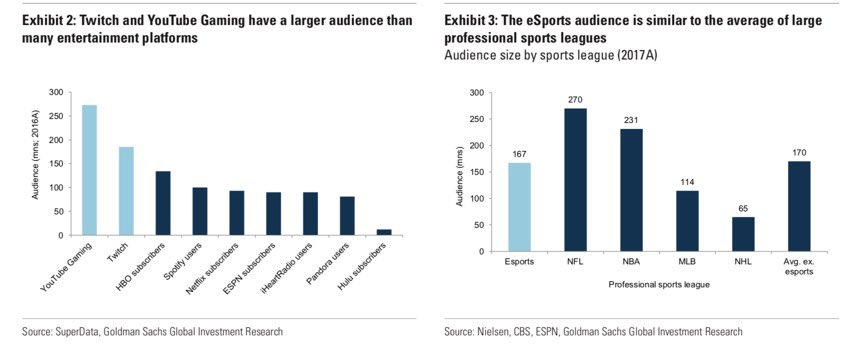



5dfbf1b1513ea04cb581a17a
0.6
2020-03-02 18:41:24.572000
DIFFER: {'global', 'crimes'}
MODEL: {'military', 'death', 'terrorism'}
TAGGER: {'death', 'military', 'crimes', 'terrorism', 'global'}


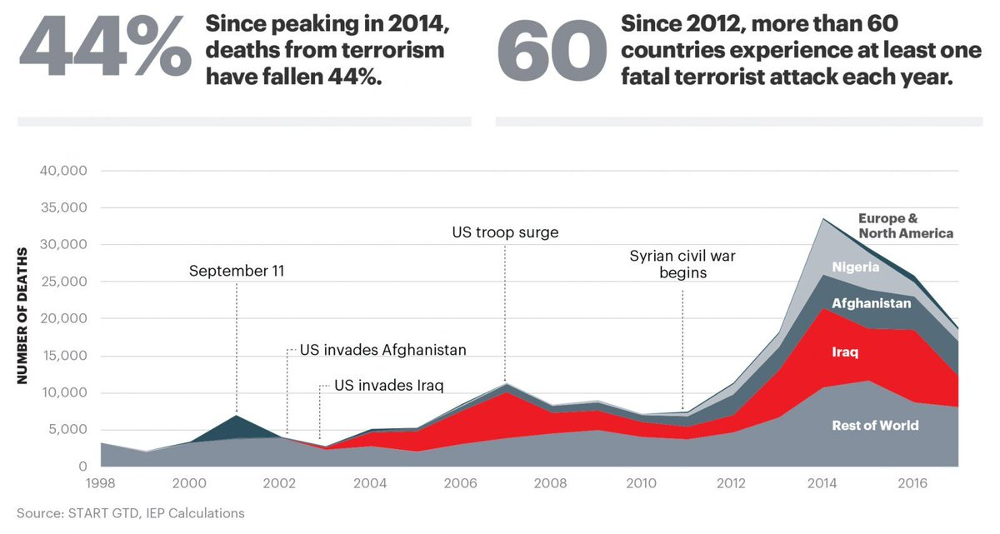



5e052927946a09279a412571
0.6666666666666666
2020-03-02 18:39:07.984000
DIFFER: {'large caps'}
MODEL: {'crisis', 'futures'}
TAGGER: {'crisis', 'large caps', 'futures'}


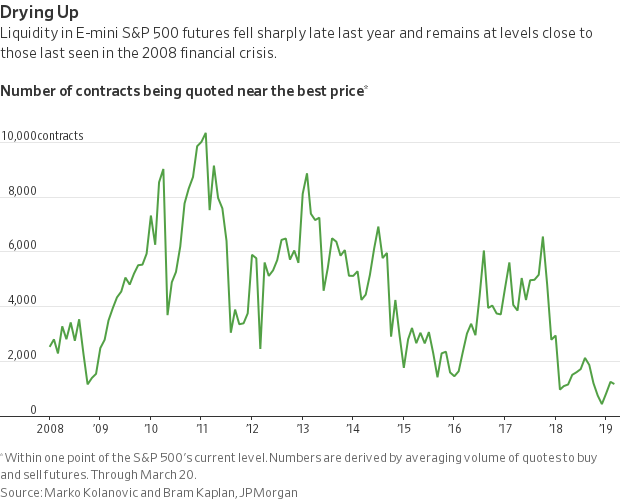



5dfc02f7513ea04cb581a66f
0.6666666666666666
2020-03-02 18:38:39.437000
DIFFER: {'large caps'}
MODEL: {'crisis', 'futures'}
TAGGER: {'crisis', 'large caps', 'futures'}


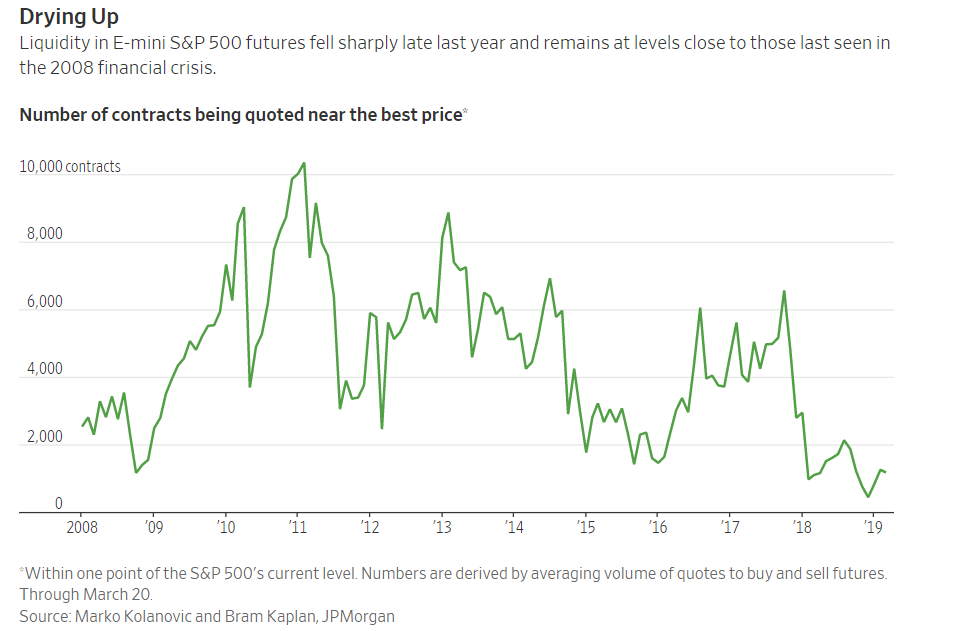



5ddb0a7286facb54ae6c7d29
0.6666666666666666
2020-03-02 18:35:25.007000
DIFFER: {'macro'}
MODEL: {'dividends', 'gdp'}
TAGGER: {'macro', 'dividends', 'gdp'}


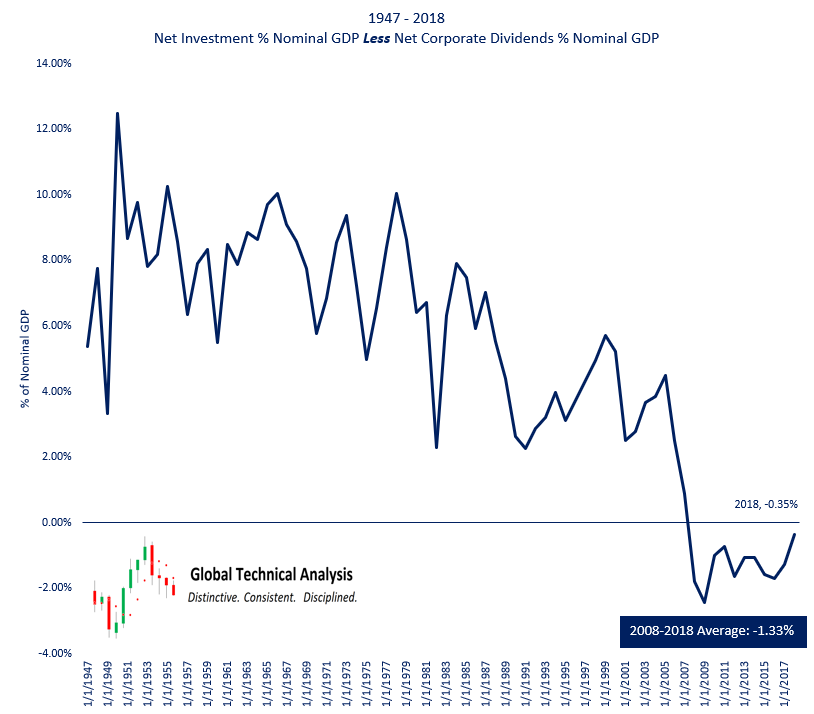



5dd3d0f03e616f8117162bf5
0.3333333333333333
2020-03-02 18:34:50.716000
DIFFER: {'lifestyle', 'social'}
MODEL: {'religion'}
TAGGER: {'religion', 'social', 'lifestyle'}


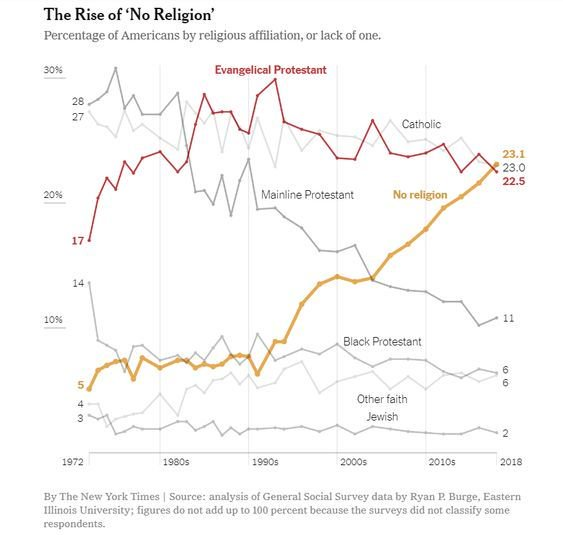



5dfb7885fc3996c4ce94e765
0.3333333333333333
2020-03-02 18:34:11.249000
DIFFER: {'financials'}
MODEL: {'funds', 'hedge funds'}
TAGGER: {'financials', 'hedge funds'}


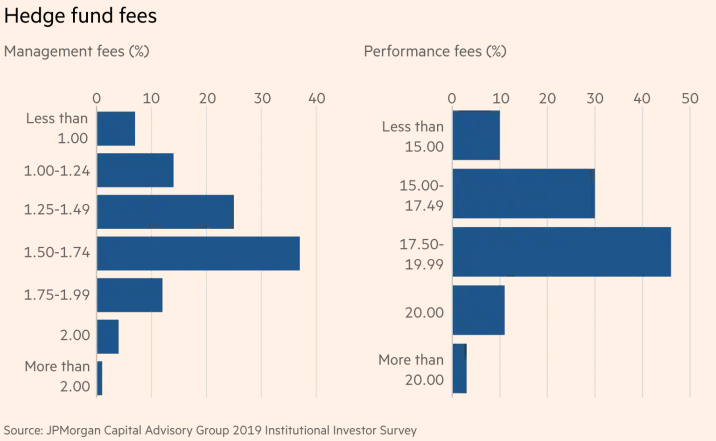



5dd9e6897f6b316ee02c0364
0.75
2020-03-02 18:33:51.451000
DIFFER: {'commodities', 'fuel'}
MODEL: {'hydro', 'solar energy', 'nuclear power', 'energy', 'renewables', 'wind power'}
TAGGER: {'fuel', 'hydro', 'nuclear power', 'solar energy', 'energy', 'renewables', 'commodities', 'wind power'}


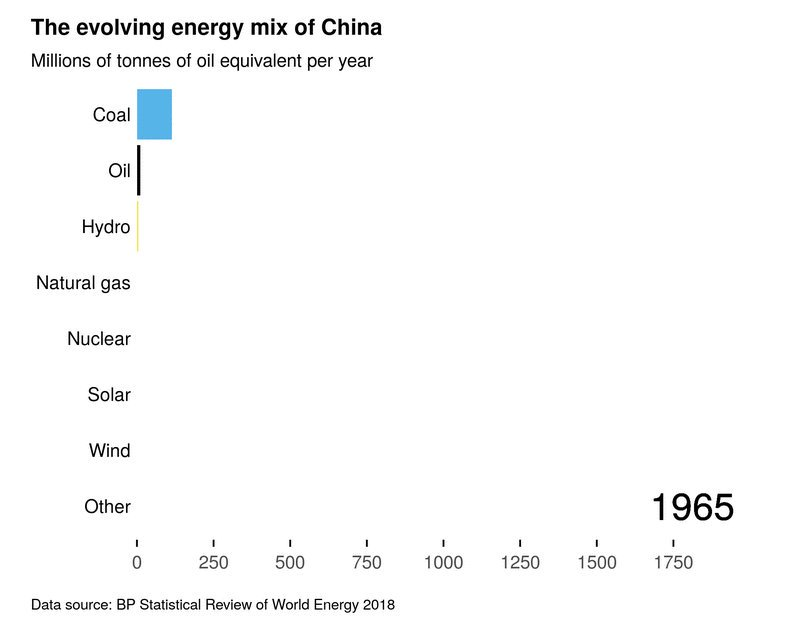



5e0210bd6eb4cb61d7829568
0.0
2020-03-02 18:17:12.114000
DIFFER: {'services'}
MODEL: {'savings'}
TAGGER: {'services'}


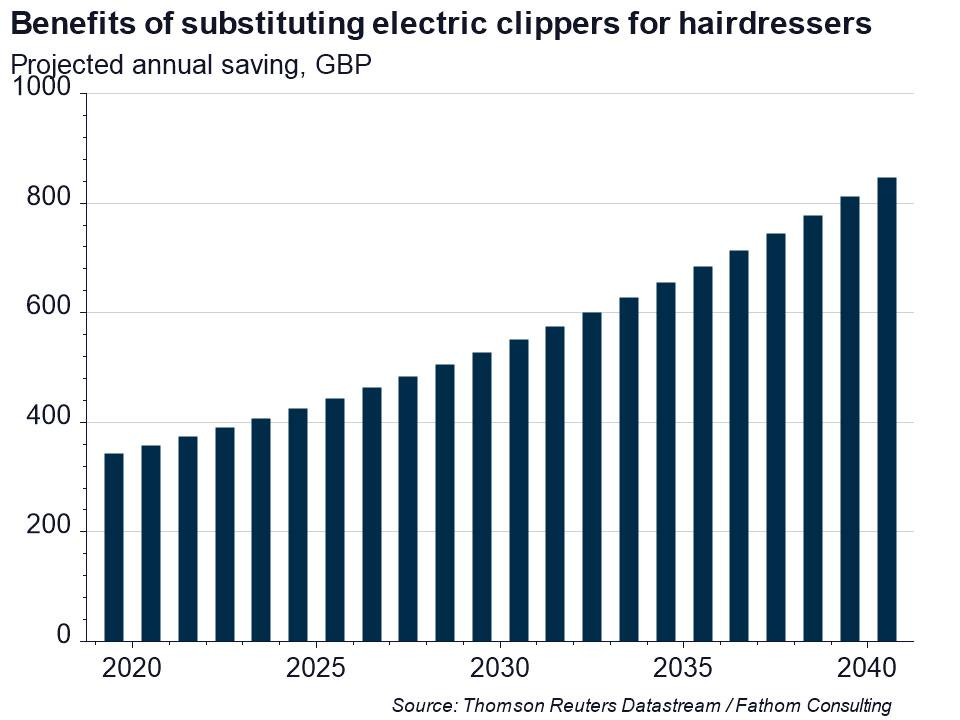



5e02cf57ce3bb8be4ca808ab
0.0
2020-03-02 18:13:44.624000
DIFFER: {'financials', 'innovation', 'artificial intelligence'}
MODEL: {'ai'}
TAGGER: {'financials', 'innovation', 'artificial intelligence'}


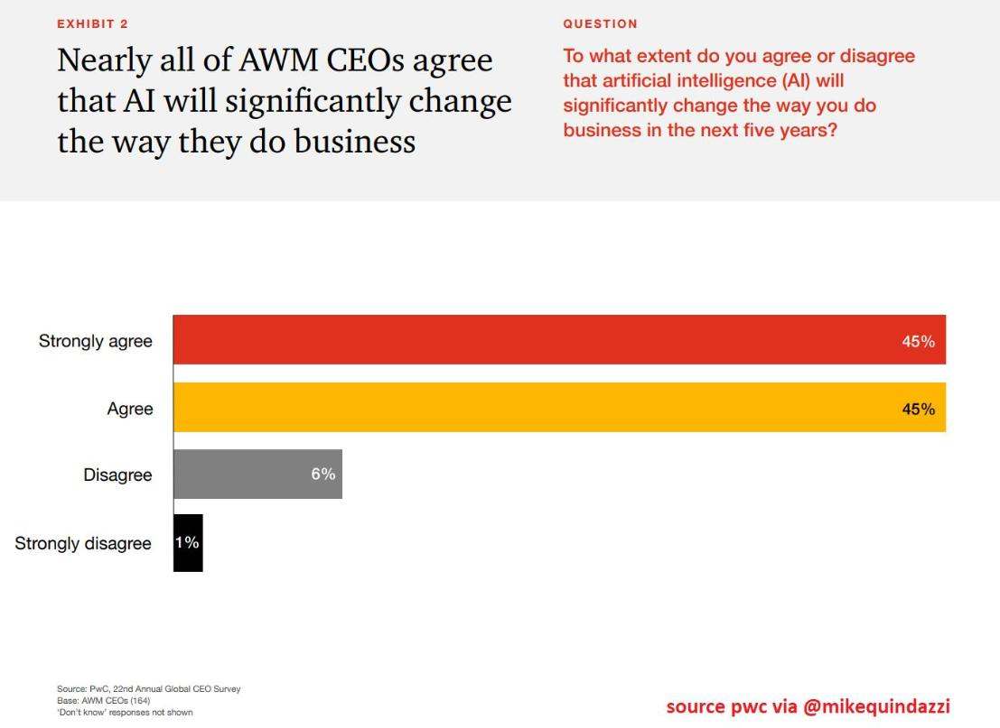



5e03a77b6958f95286239c95
0.7272727272727273
2020-03-02 18:07:18.732000
DIFFER: {'environment', 'emissions'}
MODEL: {'geothermal', 'hydro', 'nuclear power', 'solar energy', 'biomass', 'energy', 'renewables', 'global', 'wind power'}
TAGGER: {'geothermal', 'hydro', 'nuclear power', 'solar energy', 'energy', 'emissions', 'biomass', 'environment', 'renewables', 'wind power'}


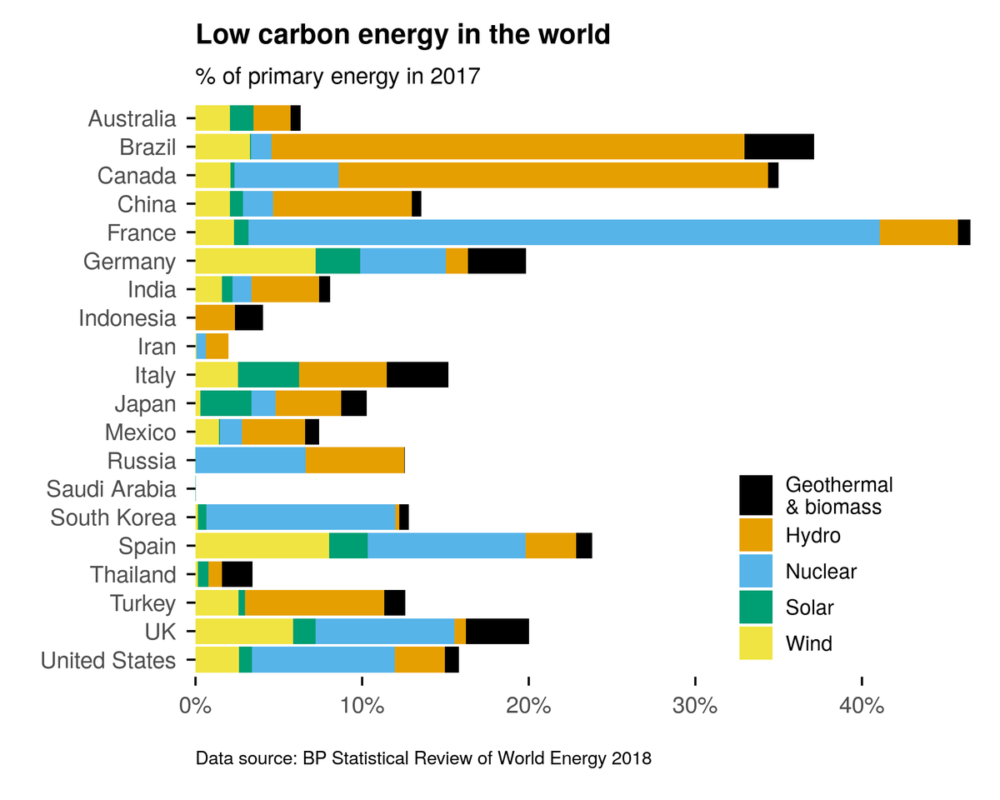



5df03a03cfadc6b344a4d4a6
0.6666666666666666
2020-03-02 18:02:35.893000
DIFFER: {'commodities'}
MODEL: {'imports', 'retail', 'trade', 'export', 'tariffs'}
TAGGER: {'imports', 'trade', 'export', 'commodities', 'tariffs'}


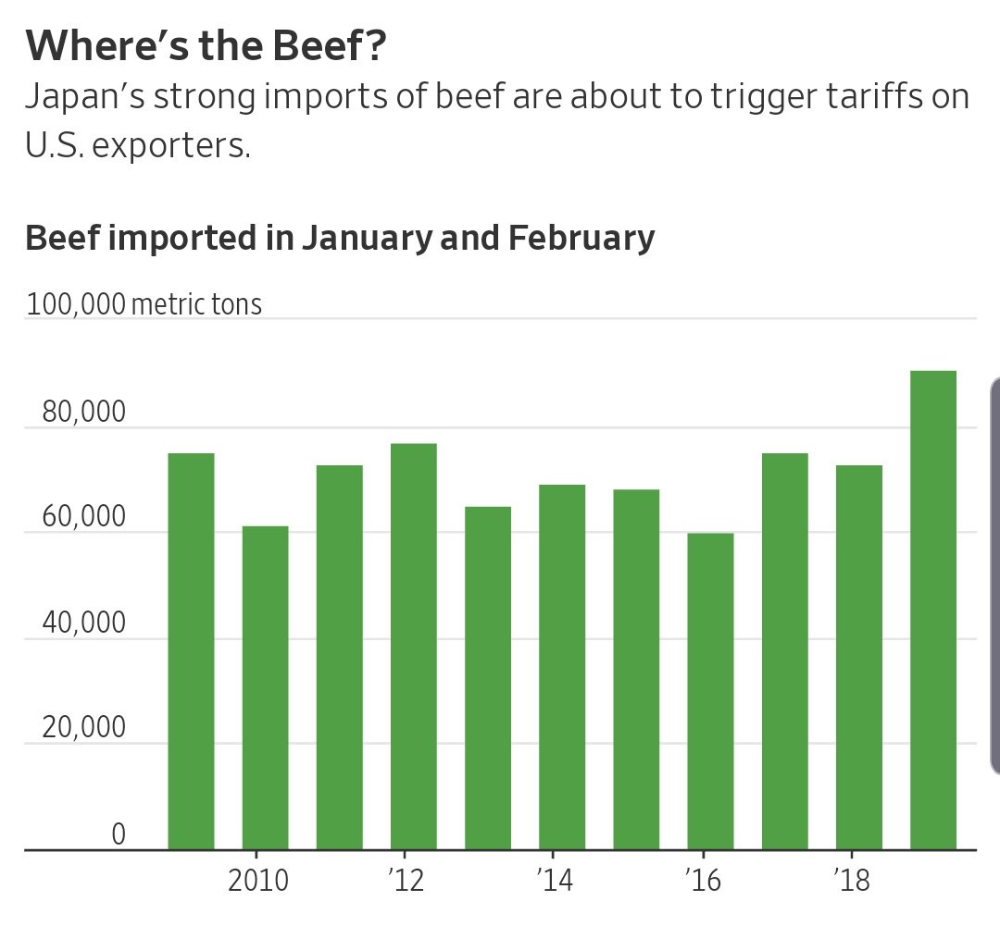



5ddab4beb3580e6d5d3e0b2a
0.6666666666666666
2020-03-02 18:01:10.575000
DIFFER: {'mining', 'private equity'}
MODEL: {'debt', 'funds', 'real estate', 'infrastructure'}
TAGGER: {'mining', 'real estate', 'debt', 'funds', 'private equity', 'infrastructure'}


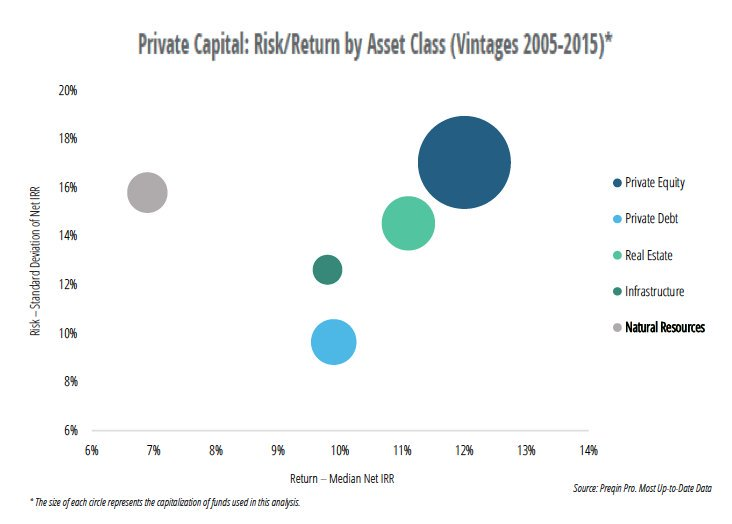



5dd34db5afd3a2104cea9dfb
0.5
2020-03-02 17:59:33.217000
DIFFER: {'industrials'}
MODEL: {'dividends'}
TAGGER: {'dividends', 'industrials'}


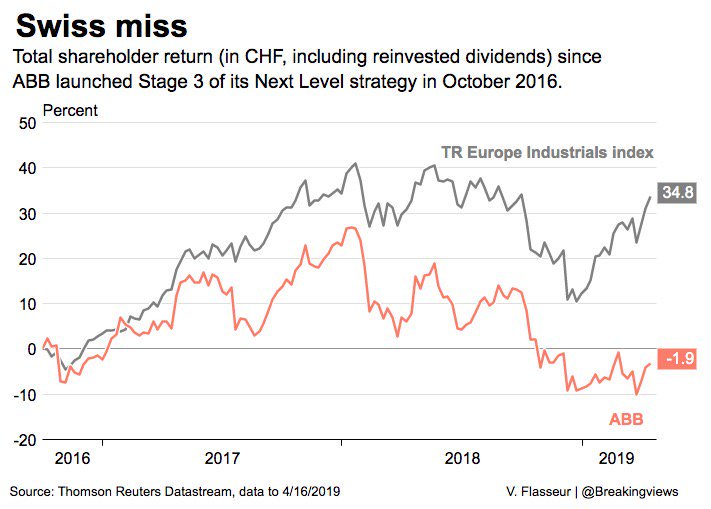



5dfb7884fc3996c4ce94e75f
0.3333333333333333
2020-03-02 17:47:01.516000
DIFFER: {'ageing', 'personal finance', 'demography'}
MODEL: {'savings', 'household', 'retirement'}
TAGGER: {'demography', 'savings', 'household', 'personal finance', 'ageing'}


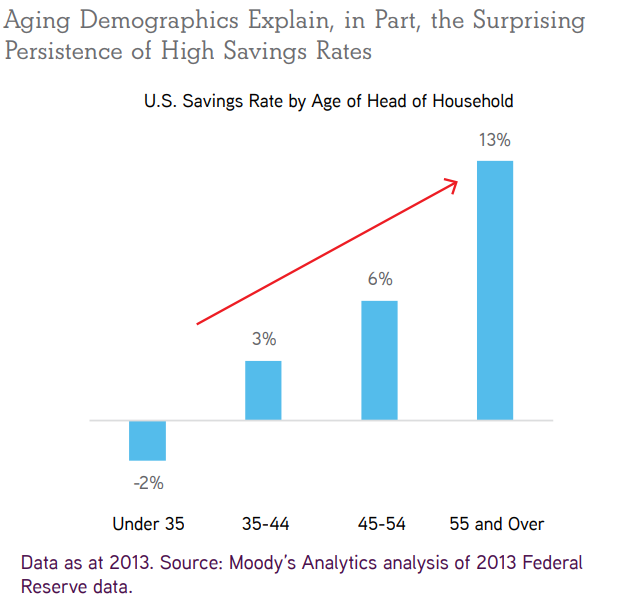



5e023adb5ce6ff0dca1a7bc7
0.25
2020-03-02 17:46:14.311000
DIFFER: {'macro', 'travel', 'services'}
MODEL: {'deficit'}
TAGGER: {'macro', 'travel', 'deficit', 'services'}


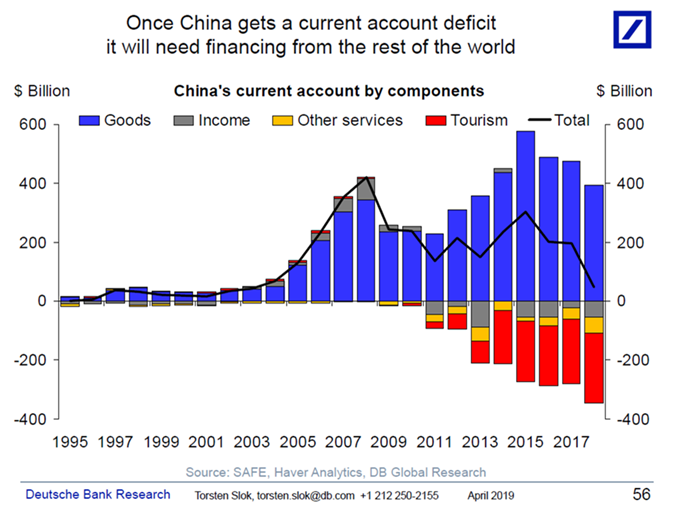



5dfc06792c7ba0b8a0d42c54
0.75
2020-03-02 17:44:38.938000
DIFFER: {'manufacturing'}
MODEL: {'global', 'technology', 'robotics'}
TAGGER: {'global', 'technology', 'manufacturing', 'robotics'}


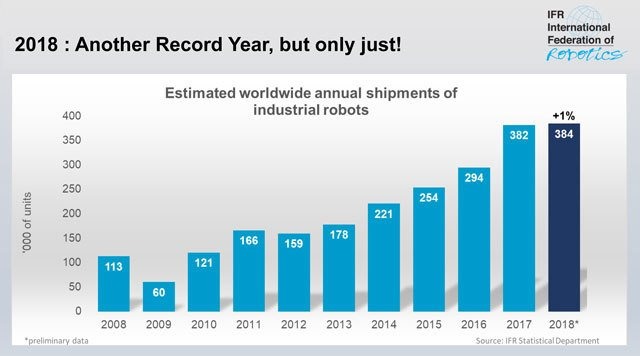



5df0382a6cdcbbbb8c78996a
0.6666666666666666
2020-03-02 17:44:17.031000
DIFFER: {'macro'}
MODEL: {'savings', 'gdp'}
TAGGER: {'macro', 'savings', 'gdp'}


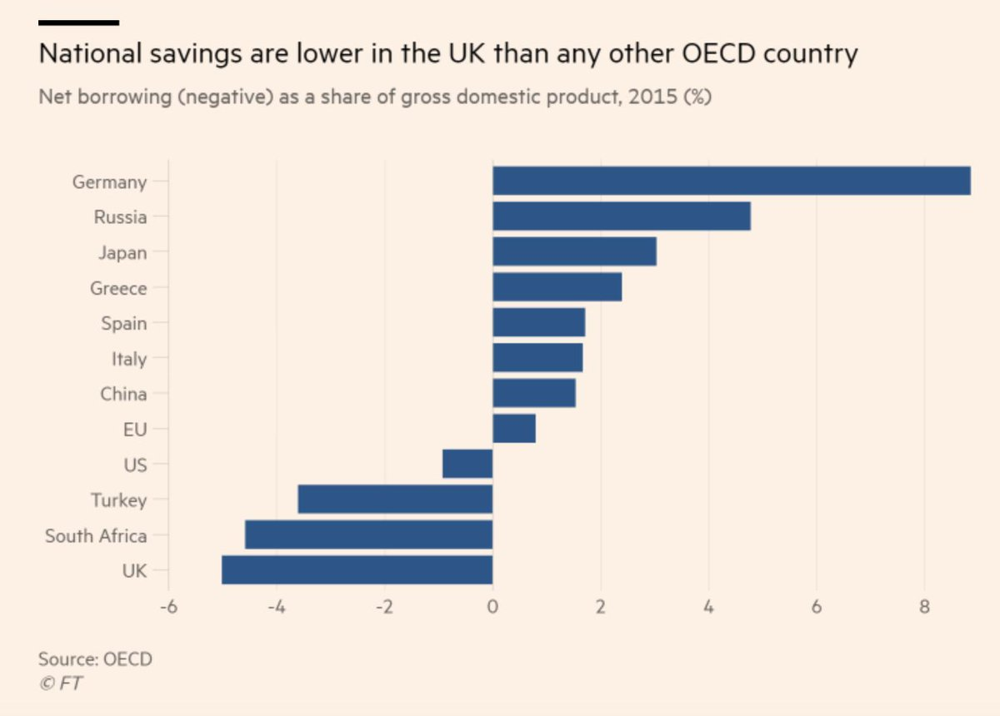



5e05d6deb399ac7efd492fab
0.0
2020-03-02 17:41:21.558000
DIFFER: set()
MODEL: {'trading'}
TAGGER: set()


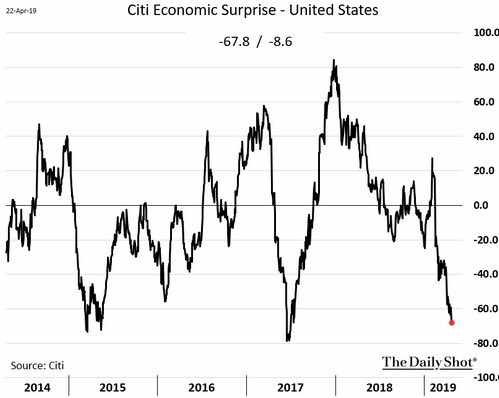



5dfc65606e02145be6275579
0.5
2020-03-02 17:32:33.560000
DIFFER: {'labor'}
MODEL: {'retirement'}
TAGGER: {'labor', 'retirement'}


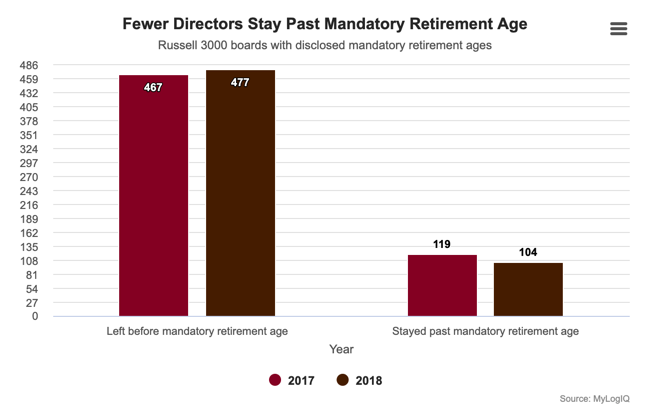



5e0292b630ac50bea26e0719
0.25
2020-03-02 17:26:50.510000
DIFFER: {'global', 'technology'}
MODEL: {'startups', 'venture'}
TAGGER: {'global', 'startups', 'technology'}


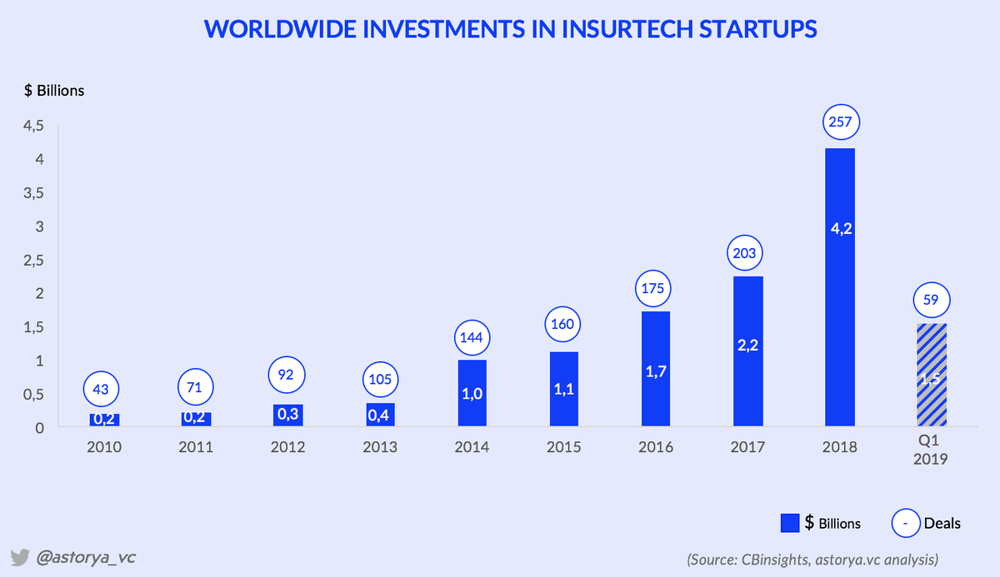



5e0485275b41d65afecfd667
0.3333333333333333
2020-03-02 17:25:47.891000
DIFFER: {'personal finance', 'wealth'}
MODEL: {'migration'}
TAGGER: {'migration', 'personal finance', 'wealth'}


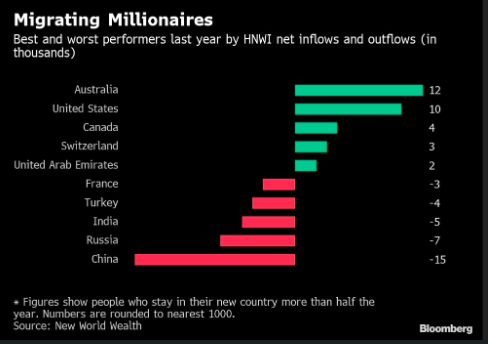



5e022da67267f881f0aead36
0.6666666666666666
2020-03-02 17:24:18.915000
DIFFER: {'fixed income'}
MODEL: {'bonds', 'high yield'}
TAGGER: {'bonds', 'fixed income', 'high yield'}


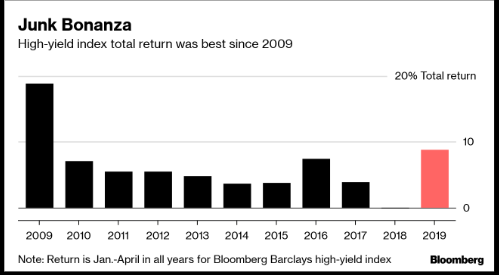



5ddb66c2120fcc7581549c0f
0.5
2020-03-02 17:22:54.859000
DIFFER: {'large caps'}
MODEL: {'buyback'}
TAGGER: {'large caps', 'buyback'}


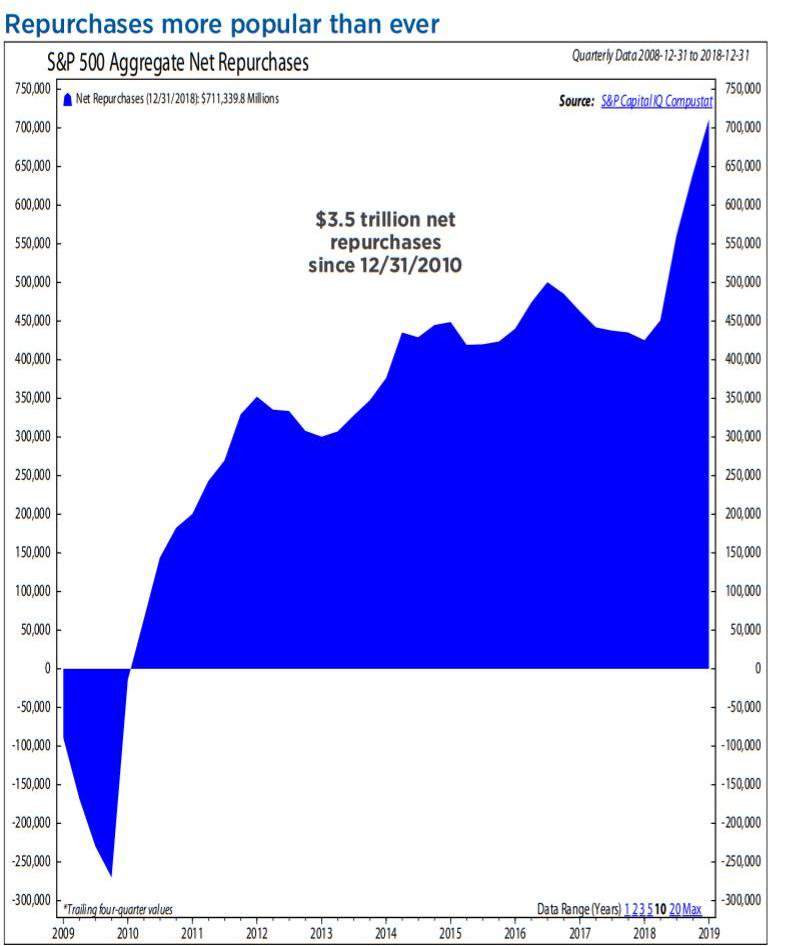



5dfba1b726b6c18e899894c0
0.0
2020-03-02 17:17:16.277000
DIFFER: {'culture', 'leisure', 'music'}
MODEL: {'sports'}
TAGGER: {'culture', 'leisure', 'music'}


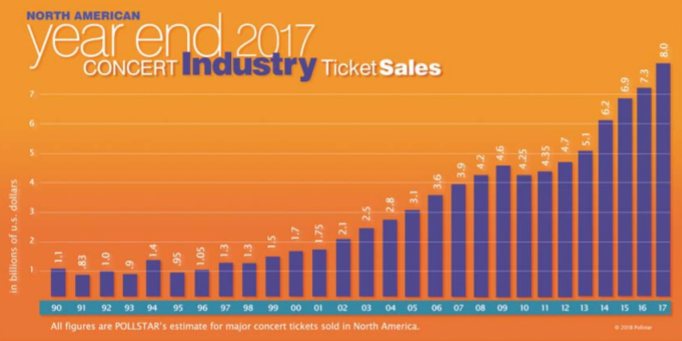



5dfbd7eb9f007b135dc29ad8
0.0
2020-03-02 17:14:45.451000
DIFFER: {'wealth'}
MODEL: set()
TAGGER: {'wealth'}


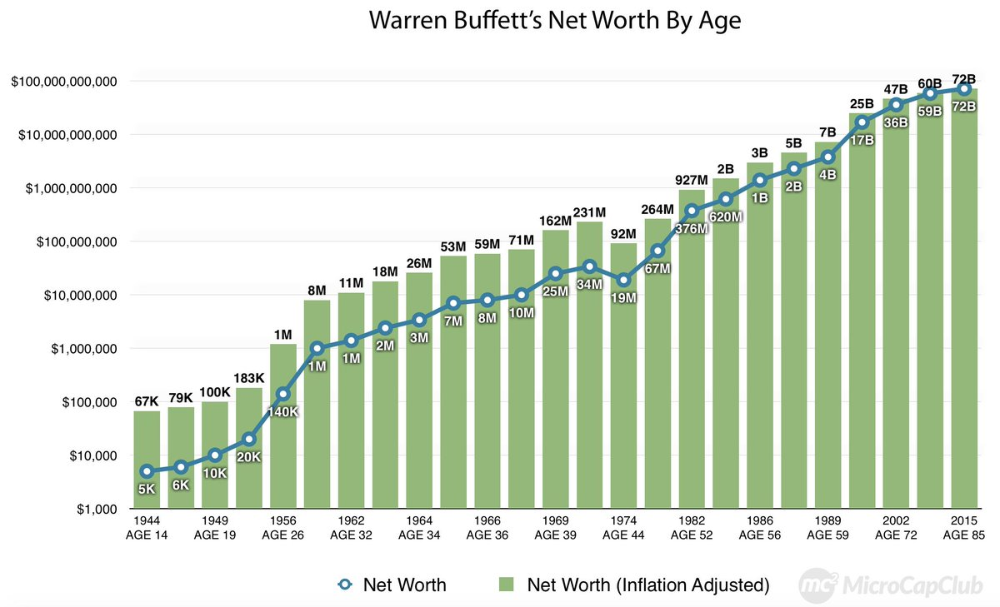



5e02b712bbdbb53c75517965
0.4
2020-03-02 17:13:57.871000
DIFFER: {'internet', 'digital', 'art'}
MODEL: {'streaming', 'music'}
TAGGER: {'digital', 'music', 'art', 'streaming', 'internet'}


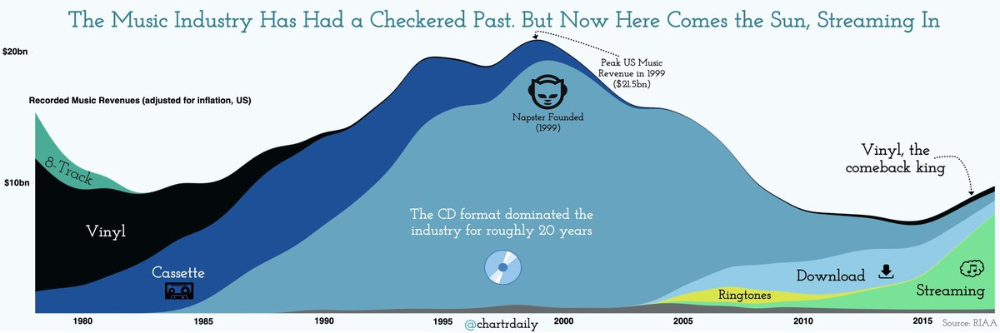



5e025ad3ea78a89595085ae7
0.6666666666666666
2020-03-02 17:10:45.838000
DIFFER: {'global'}
MODEL: {'trade', 'trade war'}
TAGGER: {'trade', 'global', 'trade war'}


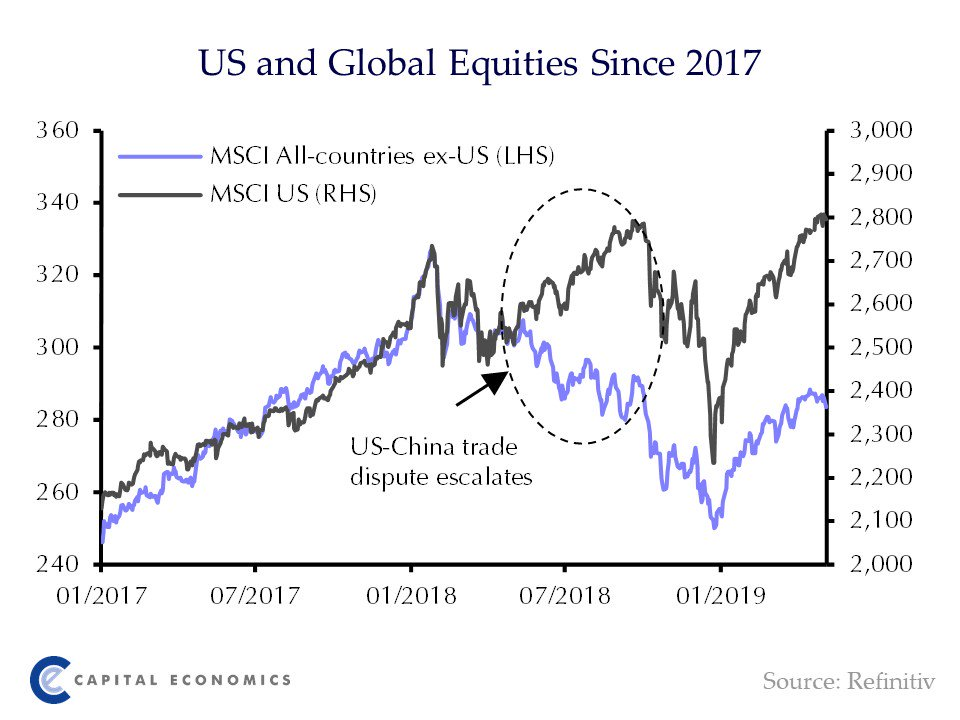



5e049c069ff8bbd9ecf554a5
0.6666666666666666
2020-03-02 16:10:03.668000
DIFFER: {'trade'}
MODEL: {'tariffs', 'emerging markets'}
TAGGER: {'trade', 'tariffs', 'emerging markets'}


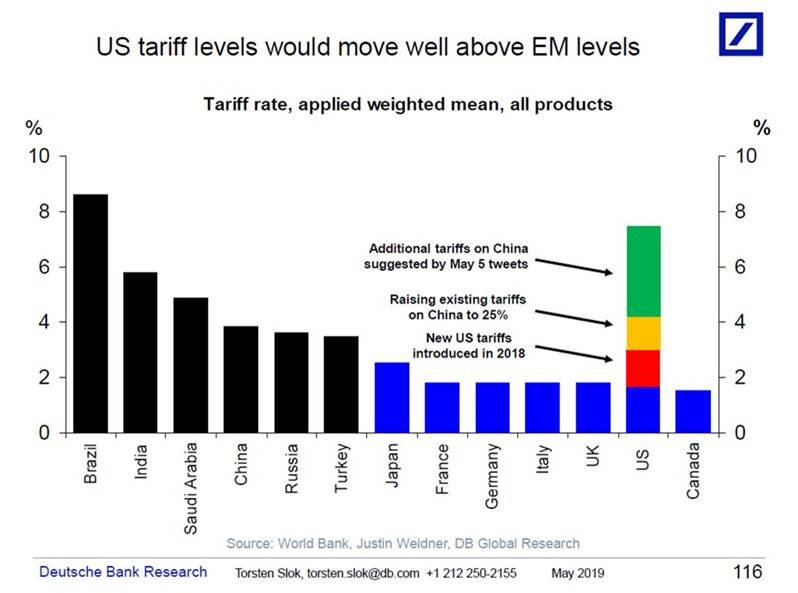



5dfc182c890c58587407f8e2
0.4
2020-03-02 16:05:37.213000
DIFFER: {'banking', 'payments'}
MODEL: {'mobile payments', 'credit card', 'cashless'}
TAGGER: {'credit card', 'cashless', 'banking', 'payments'}


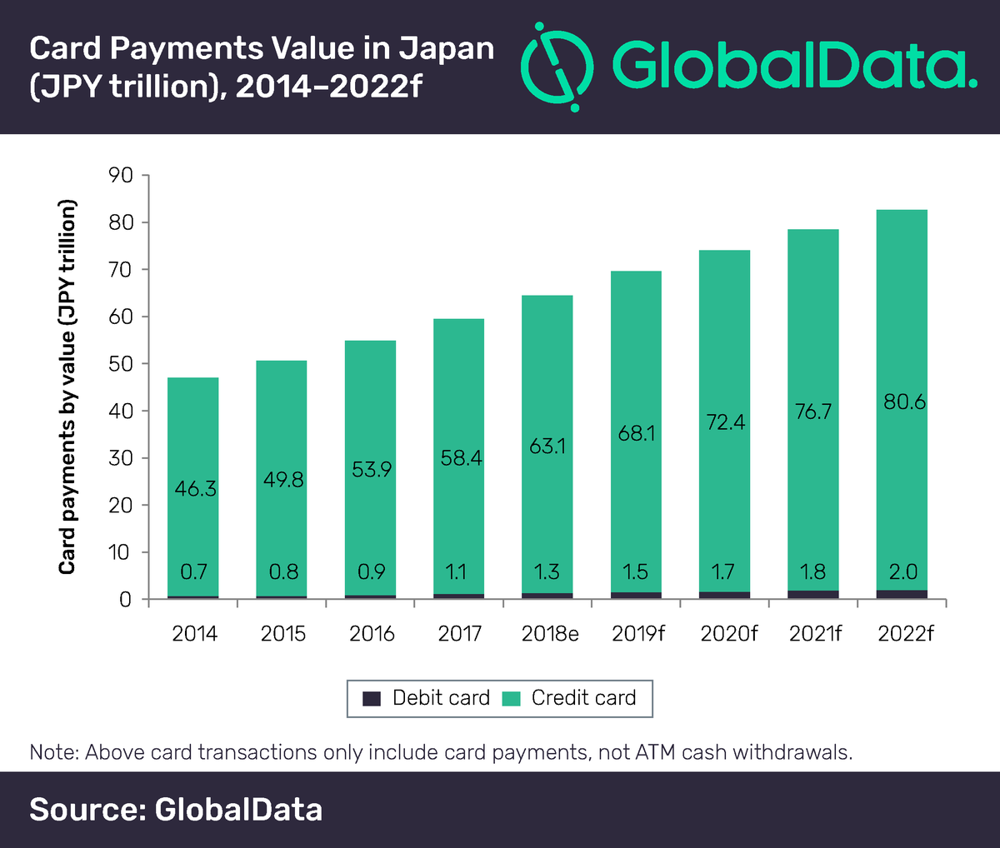



5e05d6dbb399ac7efd492f9d
0.75
2020-03-02 16:04:44.952000
DIFFER: {'fixed income'}
MODEL: {'real estate', 'bonds', 'high yield'}
TAGGER: {'real estate', 'bonds', 'fixed income', 'high yield'}


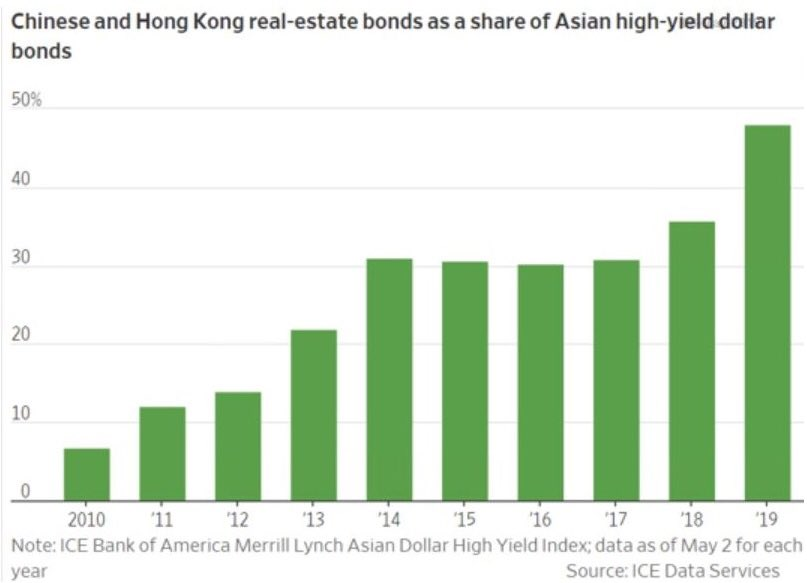



5dfc489b27e154cdda6e153a
0.5
2020-03-02 16:04:10.396000
DIFFER: {'labor', 'real estate'}
MODEL: {'taxes', 'savings', 'personal finance', 'social'}
TAGGER: {'real estate', 'savings', 'labor', 'personal finance', 'taxes'}


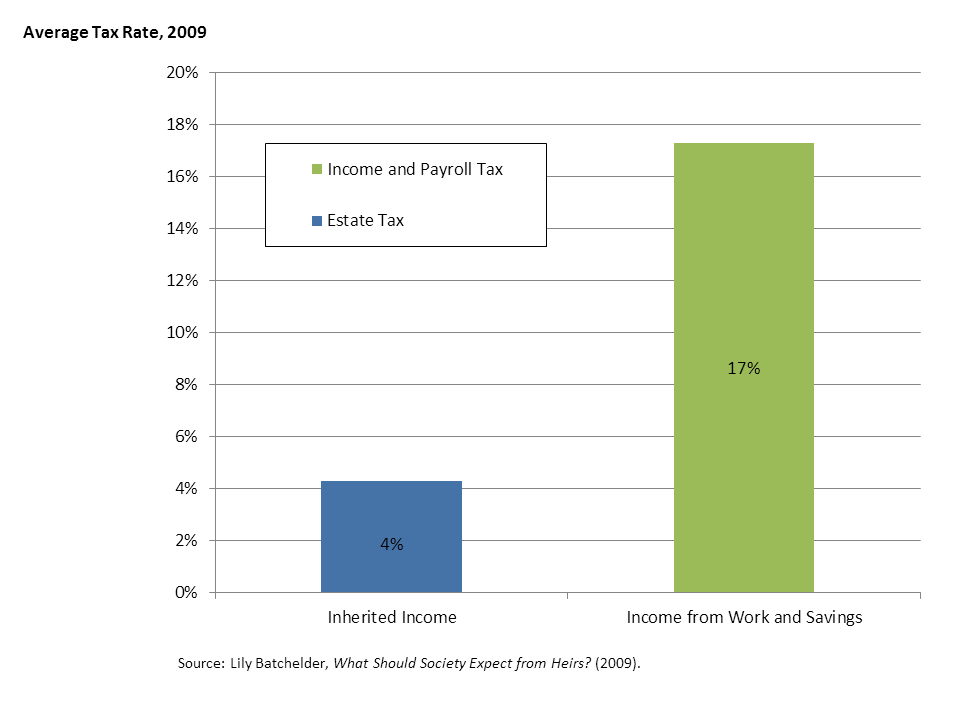



5dfb7f2026947026f22993a8
0.5
2020-03-02 15:42:35.799000
DIFFER: {'solar energy', 'global', 'renewables', 'electricity'}
MODEL: {'energy', 'utilities', 'batteries', 'wind power'}
TAGGER: {'solar energy', 'utilities', 'electricity', 'energy', 'renewables', 'batteries', 'global', 'wind power'}


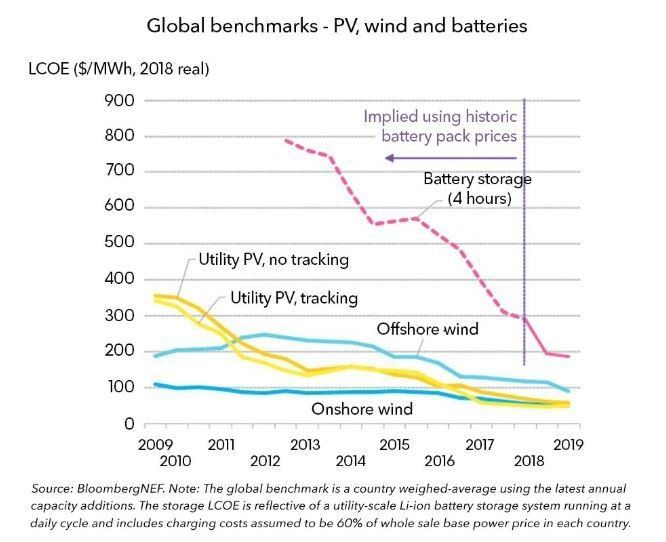



5e06e56f0099650c825886e6
0.3333333333333333
2020-03-02 15:10:31.644000
DIFFER: {'consumer products', 'automotive', 'consumer discretionary', 'materials'}
MODEL: {'inflation', 'tariffs'}
TAGGER: {'automotive', 'consumer discretionary', 'materials', 'consumer products', 'inflation', 'tariffs'}


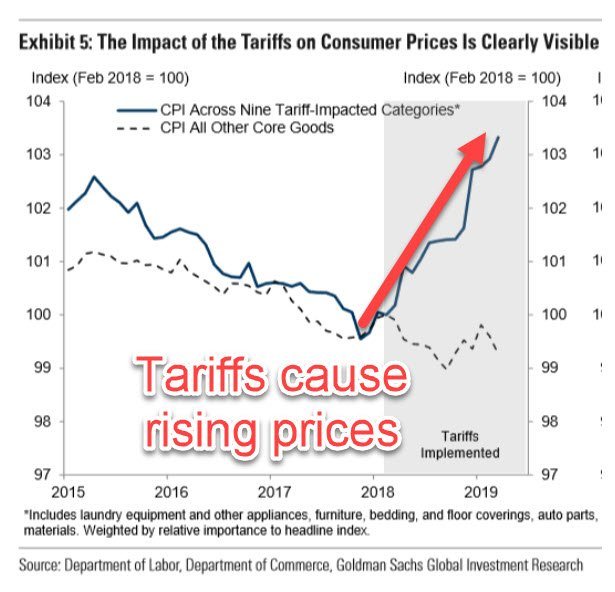



5e0255978e38314b10233c28
0.8333333333333334
2020-03-02 14:55:39.243000
DIFFER: {'generation z'}
MODEL: {'wealth', 'millennials', 'generation x', 'generations', 'boomers'}
TAGGER: {'wealth', 'millennials', 'generation z', 'generation x', 'generations', 'boomers'}


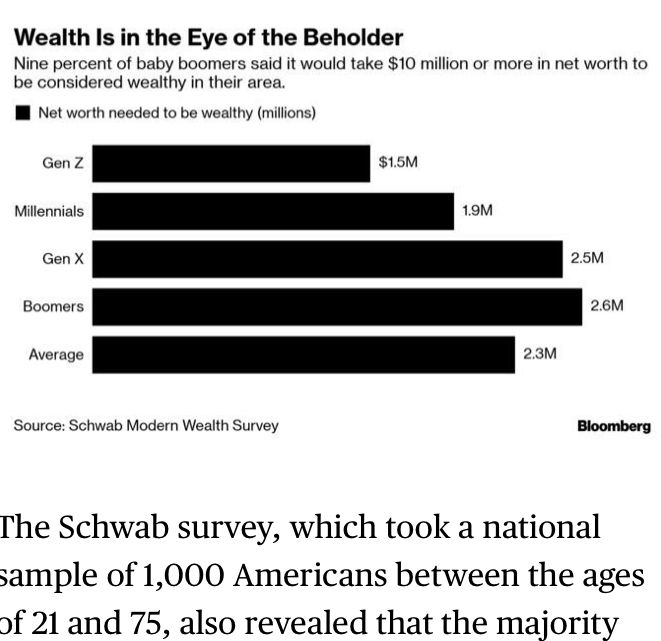



5e04a2b249d9a1060f782e36
0.6
2020-03-02 14:51:39.420000
DIFFER: {'technology', 'large caps'}
MODEL: {'trade', 'imports', 'tariffs'}
TAGGER: {'technology', 'imports', 'large caps', 'trade', 'tariffs'}


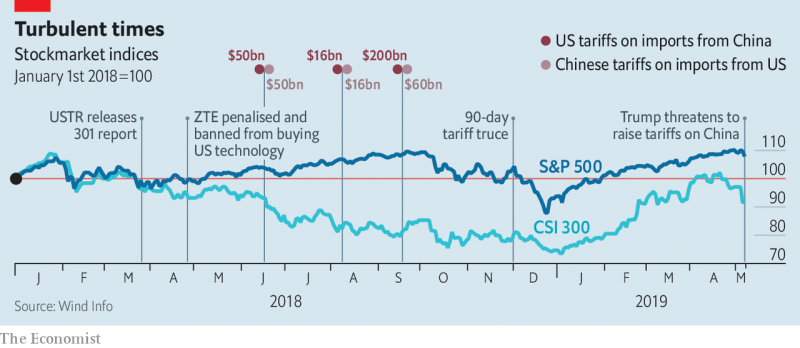



5de4e6d950452a49d140e72a
0.3333333333333333
2020-03-02 14:48:50.046000
DIFFER: {'currency'}
MODEL: {'bonds', 'fixed income'}
TAGGER: {'fixed income', 'currency'}


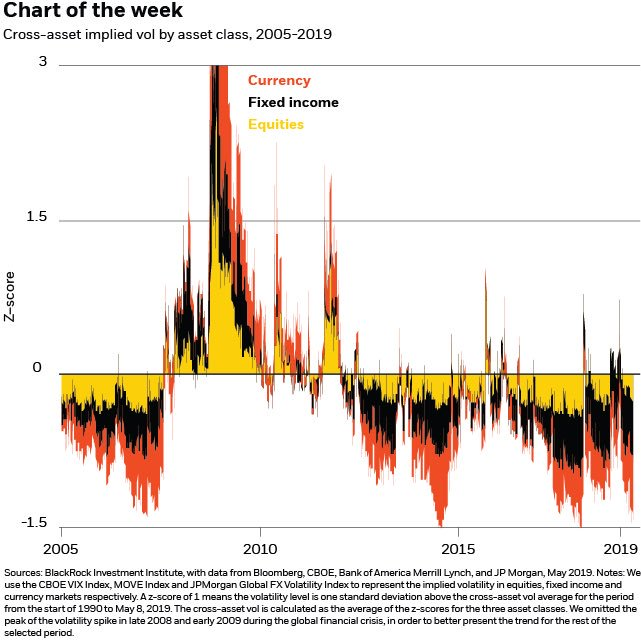



5defdf446db757cc181911cd
0.36363636363636365
2020-03-02 14:28:52.234000
DIFFER: {'aviation', 'banking', 'payments', 'shopping', 'financials', 'travel'}
MODEL: {'credit card', 'millennials', 'mobile payments', 'generations', 'cashless'}
TAGGER: {'aviation', 'banking', 'payments', 'credit card', 'shopping', 'millennials', 'financials', 'generations', 'travel', 'cashless'}


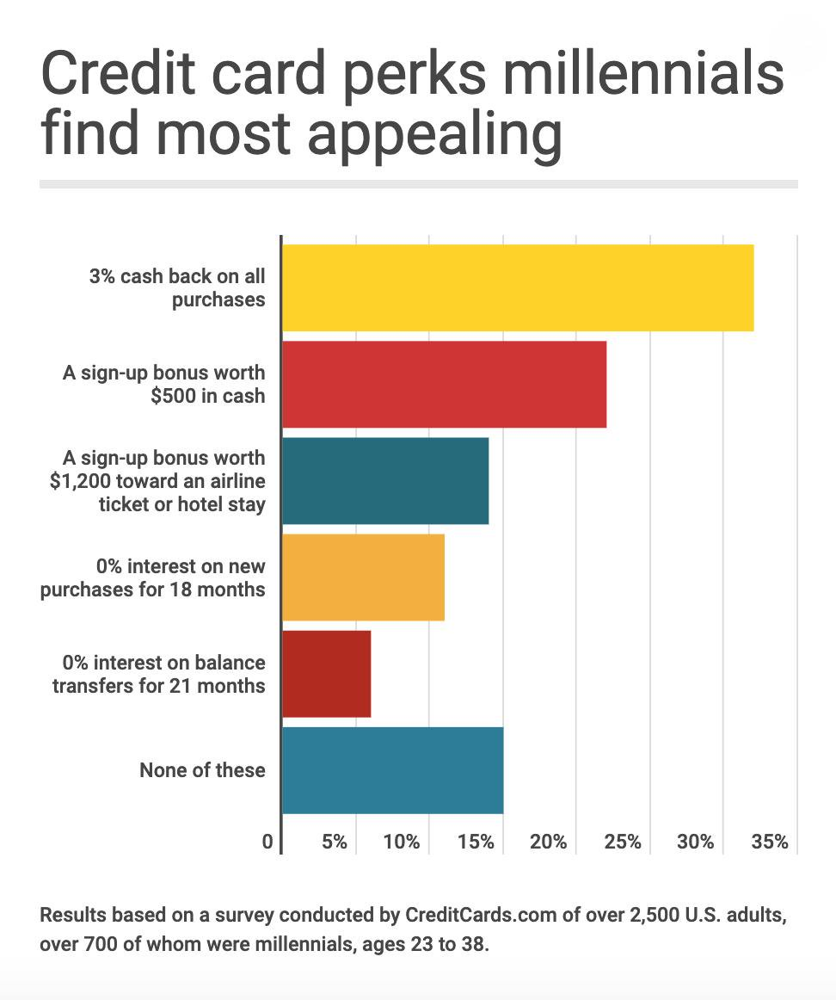



5e0292cf7267f881f0aeb82f
0.3333333333333333
2020-03-02 14:16:16.516000
DIFFER: {'education', 'social'}
MODEL: {'migration'}
TAGGER: {'migration', 'education', 'social'}


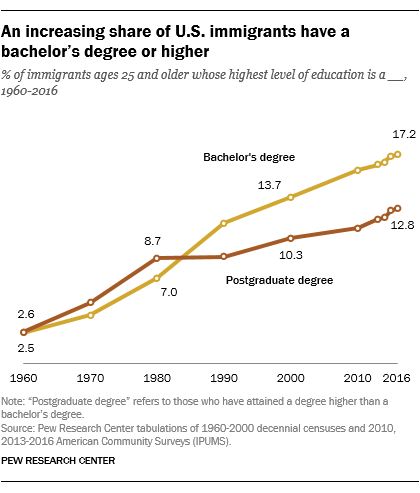



5e052923946a09279a412567
0.5
2020-03-02 14:04:32.420000
DIFFER: {'etf'}
MODEL: {'volatility'}
TAGGER: {'etf', 'volatility'}


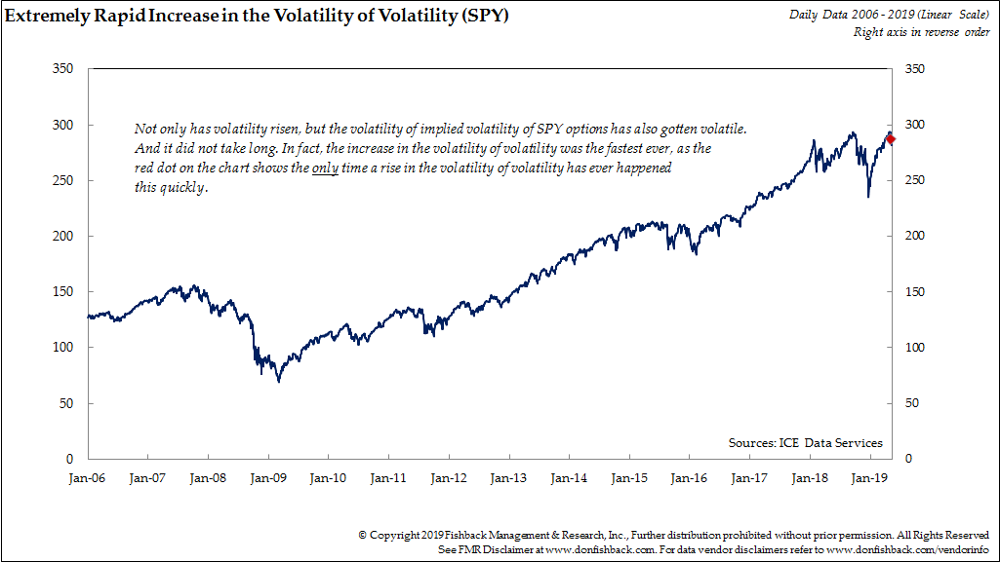



5e022da37267f881f0aead2b
0.5
2020-03-02 13:56:21.309000
DIFFER: {'personal finance', 'education'}
MODEL: {'debt', 'student loan', 'mortgage', 'real estate'}
TAGGER: {'student loan', 'real estate', 'education', 'debt', 'personal finance'}


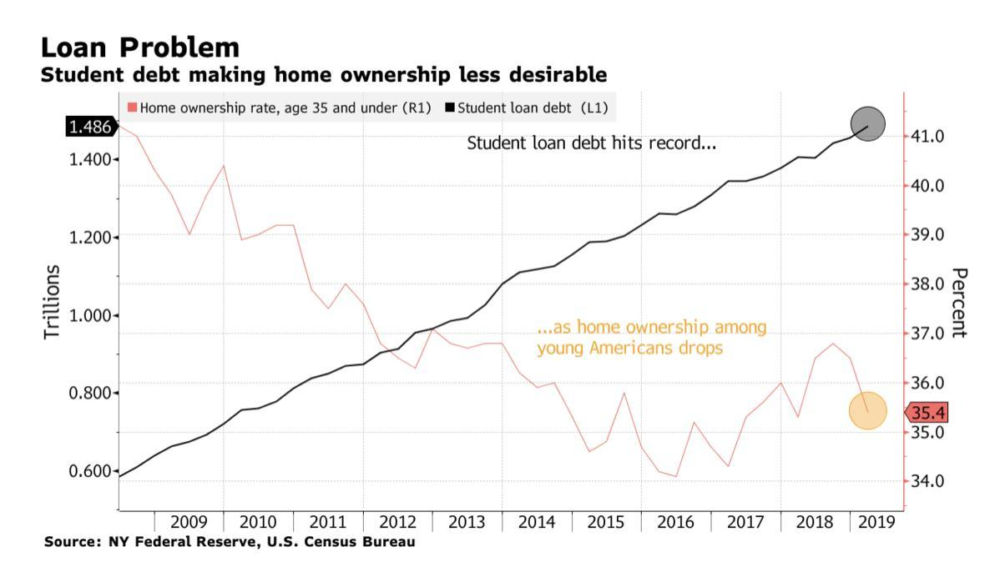

In [28]:
for i in db_client["tweets_pipeline_v2"].find({"$or": [{"status":"validated"}, 
                                                      ],
                                               'validated_timestamp': {'$gte': datetime(2020,3,1)},

#                                                'validated_timestamp': {'$gte': end_date, '$lte': start_date},
                                               }).sort('validated_timestamp',pymongo.DESCENDING):
    tagger = set()
    guten_tag = set()
        
    if "bert_tags" in i:
        guten_tag = set(i["bert_tags"])

    if "confirmed_after_validate" in i:
        tagger = set(i["confirmed_after_validate"])
        tagger = tagger.intersection(guten_tag_labels)

    sim = tags_simmilarity(guten_tag, tagger.intersection(guten_tag_labels))
    if sim != 1:
        print(i["_id"])
        print(sim)
        print(i["validated_timestamp"])
        print("DIFFER:", tagger.difference(guten_tag))
        print("MODEL:", guten_tag)
        print("TAGGER:", tagger)
        if "s3_url" in i:
            display(Image(i['s3_url'], unconfined=True))
        print()    
        print()
#     print(i)

#     break



In [ ]:
for i in db_client["tweets_pipeline_v2"].find({"$or": [{"status":"validated"}, 
                                                      ],
                                               'validated_timestamp': {'$gte': datetime(2020,3,1)},

#                                                'validated_timestamp': {'$gte': end_date, '$lte': start_date},
                                               }).sort('validated_timestamp',pymongo.DESCENDING):
    tagger = set()
    guten_tag = set()
        
    if "bert_tags" in i:
        guten_tag = set(i["bert_tags"])

    if "confirmed_after_validate" in i:
        tagger = set(i["confirmed_after_validate"])
        tagger = tagger.intersection(guten_tag_labels)

    sim = tags_simmilarity(guten_tag, tagger.intersection(guten_tag_labels))
    if sim != 1:
        print(i["_id"])
        print(sim)
        print(i["validated_timestamp"])
        print("DIFFER:", tagger.difference(guten_tag))
        print("MODEL:", guten_tag)
        print("TAGGER:", tagger)
        if "s3_url" in i:
            display(Image(i['s3_url'], unconfined=True))
        print()    
        print()
#     print(i)

#     break


